In [1]:
import pandas as pd
import numpy as  np
from sklearn import model_selection
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, Normalizer

In [2]:
df1 = pd.read_excel(open('D:/PhD_research/NOC_deep_learning/ML_training_data/ML_training_data/Secured_routing_data.xlsx', 'rb'), sheet_name = 'mesh_4vc_pkt_cnt', dtype = float)
df1 = pd.DataFrame(df1.transpose())
y = pd.DataFrame(df1.index, columns=['labels'])
X = df1.set_index(pd.Index([0,1,2,3,4,5,6,7,8,9,10,11]))
df1 = pd.concat([X, y], axis = 1)
df1.shape

(12, 81)

In [3]:
df2 = pd.read_excel(open('D:/PhD_research/NOC_deep_learning/ML_training_data/ML_training_data/Mix_2_secured_training_data.xlsx', 'rb'), sheet_name = 'mesh_4vc_pkt_cnt_mix_2_traffic')
df2 = pd.DataFrame(df2.transpose())
df2 = df2.reset_index()
df2.columns = (list(range(0, 81)))
df2.rename(columns={ df2.columns[80]: "labels" }, inplace = True)
y = df2['labels']
X = df2.drop(['labels'], axis = 1)
X = X.astype(float)
df2 = pd.concat([X, y], axis = 1)
df2.shape

(66, 81)

In [4]:
df = df1.append(df2)
df.reset_index(drop=True, inplace=True)
df_main = df

In [5]:
target = df['labels']
df = df.drop(['labels'], axis = 1)

In [6]:
df_main.head()

,0,1,2,3,4,5,6,7,8,9,...,71,72,73,74,75,76,77,78,79,labels
0,303.0,318.0,334.0,119.0,23.0,11.0,9.0,163.0,14.0,4.0,...,0.0,5.0,0.0,17.0,12.0,0.0,0.0,0.0,0.0,Barnes
1,11.0,9.0,7.0,7.0,3.0,5.0,3.0,9.0,2.0,3.0,...,0.0,0.0,0.0,0.0,5.0,0.0,6.0,0.0,0.0,Blackschole
2,12.0,9.0,7.0,16.0,11.0,8.0,13.0,23.0,19.0,11.0,...,0.0,16.0,0.0,15.0,16.0,0.0,0.0,5.0,5.0,bodytrack
3,165.0,173.0,187.0,133.0,248.0,95.0,86.0,144.0,234.0,70.0,...,42.0,60.0,49.0,32.0,18.0,22.0,31.0,39.0,62.0,Cholesky
4,87.0,76.0,80.0,101.0,43.0,46.0,77.0,910.0,21879.0,20747.0,...,11.0,12.0,26.0,68.0,57.0,7.0,20.0,20.0,22.0,facesism


In [7]:
df.head()

,0,1,2,3,4,5,6,7,8,9,...,70,71,72,73,74,75,76,77,78,79
0,303.0,318.0,334.0,119.0,23.0,11.0,9.0,163.0,14.0,4.0,...,0.0,0.0,5.0,0.0,17.0,12.0,0.0,0.0,0.0,0.0
1,11.0,9.0,7.0,7.0,3.0,5.0,3.0,9.0,2.0,3.0,...,0.0,0.0,0.0,0.0,0.0,5.0,0.0,6.0,0.0,0.0
2,12.0,9.0,7.0,16.0,11.0,8.0,13.0,23.0,19.0,11.0,...,5.0,0.0,16.0,0.0,15.0,16.0,0.0,0.0,5.0,5.0
3,165.0,173.0,187.0,133.0,248.0,95.0,86.0,144.0,234.0,70.0,...,56.0,42.0,60.0,49.0,32.0,18.0,22.0,31.0,39.0,62.0
4,87.0,76.0,80.0,101.0,43.0,46.0,77.0,910.0,21879.0,20747.0,...,21.0,11.0,12.0,26.0,68.0,57.0,7.0,20.0,20.0,22.0


In [8]:
def randompacketgen(p = 0.99, n=5000, returnvectorsize = 80):
    # p is probability of success (for us it it roughly 1 - injectionload)
    from scipy.stats import nbinom
    return [int(nbinom.rvs(n, p, loc=0, size=1, random_state=None)//8) for i in range(returnvectorsize)]

In [9]:
def generate_data():
    frame = []
    for i in range(78):
        x=np.array(randompacketgen())
        x_noise=x.T
        frame.append(x_noise)
    return frame 
    #df.drop(columns=['index'])
    #df['labels'].iloc[78]=y[0]

In [10]:
def append_data(data, target):   
    gen_with_labels = pd.concat([data, target], axis = 1)
    return gen_with_labels

In [11]:
def add_to_original(gen_data, df):
    df = pd.concat([df, gen_data], axis = 0)
    return df

In [12]:
def add_noise(data, df):
    gen_data = pd.DataFrame(data)
    noise_data = df.add(gen_data)
    return noise_data

In [13]:
# data = generate_data()
# noise_data = add_noise(data, df)
# gen_data = append_data(noise_data, target)
# df_final = add_to_original(gen_data, df_main)

In [14]:
for i in range(2000):
    data = generate_data()
    noise_data = add_noise(data, df)
    gen_data = append_data(noise_data, target)
    df_main = add_to_original(gen_data, df_main)

In [15]:
df= df_main

In [16]:
df.shape

(156078, 81)

In [17]:
y = df['labels']
X = df.drop(['labels'], axis = 1)

In [18]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=42)

In [19]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(109254, 80)
(46824, 80)
(109254,)
(46824,)


## PCA based Dimensionality Reduction 

In [20]:
sc = Normalizer()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [21]:
# from sklearn.decomposition import PCA 
# pca = PCA(n_components=16) ## 1 / 2 / 4 / 8 / 16 
# pca.fit(X_train)
# X_train = pca.transform(X_train)
# X_test = pca.transform(X_test)

In [22]:
from tensorflow import keras

from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Dropout
from sklearn import preprocessing

C:\Users\adhavlle\AppData\Local\Continuum\anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\adhavlle\AppData\Local\Continuum\anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\adhavlle\AppData\Local\Continuum\anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\adhavlle\AppData

In [23]:
y_train=pd.DataFrame(y_train)

In [24]:
y_train.columns=['values']

In [25]:
y_train['values'] = y_train['values'].str.replace(' ', '')

In [26]:
y_train=pd.DataFrame(y_train)

In [27]:
y_train=y_train['values'].str.split("+", n = 1, expand = True) 

In [28]:
y_train.columns=['Zero','One']

In [29]:
y_train.head()

,Zero,One
54,Swaption,facesism
68,Raytrace,radix
26,Blackschole,fft
36,bodytrack,fluidanimate
58,fft,radix


In [30]:
y1=pd.get_dummies(y_train['Zero'])

In [31]:
y2=pd.get_dummies(y_train['One'])

In [32]:
y1.columns

Index(['Barnes', 'Blackschole', 'Cholesky', 'Raytrace', 'Swaption',
       'bodytrack', 'facesism', 'fft', 'fluidanimate', 'radix',
       'water_nsquared', 'water_spatial'],
      dtype='object')

In [33]:
y2.columns

Index(['Blackschole', 'Cholesky', 'Raytrace', 'Swaption', 'bodytrack',
       'facesism', 'fft', 'fluidanimate', 'radix', 'water_nsquared',
       'water_spatial'],
      dtype='object')

In [34]:
y2['Barnes']=0

In [35]:
y_train=y1+y2

In [36]:
y_train=y_train.values.tolist()

In [37]:
y_train = np.asarray(y_train, dtype=np.int8)

In [38]:
print(X_test.shape)
print(y_test.shape)

(46824, 80)
(46824,)


In [39]:
print(X_train.shape)
print(y_train.shape)

(109254, 80)
(109254, 12)


In [40]:
# print(X.shape)
# print(y.shape)

In [41]:
from tensorflow.keras.optimizers import Adadelta, Adam

In [42]:
model = Sequential()
input_shape = X_train[0].shape
model.add(Dense(units=800,input_shape=input_shape,activation='relu',kernel_initializer='glorot_uniform'))
model.add(Dense(500, activation='relu'))
model.add(Dense(200, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(12, activation='softmax'))
# compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy',metrics=['accuracy'])
# fit the model
history=model.fit(X_train, y_train, epochs=100, batch_size=64,validation_split=0.30)

Instructions for updating:
Colocations handled automatically by placer.
Train on 76477 samples, validate on 32777 samples
Instructions for updating:
Use tf.cast instead.
Epoch 1/100
76477/76477 [==============================] - 7s 87us/sample - loss: 2.0941 - acc: 0.5440 - val_loss: 1.8140 - val_acc: 0.4997
Epoch 2/100
76477/76477 [==============================] - 6s 82us/sample - loss: 1.8258 - acc: 0.5244 - val_loss: 1.7970 - val_acc: 0.5225
Epoch 3/100
76477/76477 [==============================] - 6s 81us/sample - loss: 1.7352 - acc: 0.5244 - val_loss: 1.6498 - val_acc: 0.5400
Epoch 4/100
76477/76477 [==============================] - 6s 81us/sample - loss: 1.6191 - acc: 0.5333 - val_loss: 1.5684 - val_acc: 0.5598
Epoch 5/100
76477/76477 [==============================] - 6s 80us/sample - loss: 1.5761 - acc: 0.5365 - val_loss: 1.5163 - val_acc: 0.5409
Epoch 6/100
76477/76477 [==============================] - 6s 80us/sample - loss: 1.5443 - acc: 0.5394 - val_loss: 1.6479 - val_ac

76477/76477 [==============================] - 6s 82us/sample - loss: 1.3421 - acc: 0.5471 - val_loss: 1.3509 - val_acc: 0.5704
Epoch 55/100
76477/76477 [==============================] - 6s 83us/sample - loss: 1.3233 - acc: 0.5489 - val_loss: 1.3713 - val_acc: 0.5540
Epoch 56/100
76477/76477 [==============================] - 6s 81us/sample - loss: 1.3196 - acc: 0.5478 - val_loss: 1.3036 - val_acc: 0.5105
Epoch 57/100
76477/76477 [==============================] - 6s 81us/sample - loss: 1.3421 - acc: 0.5451 - val_loss: 1.3340 - val_acc: 0.4712
Epoch 58/100
76477/76477 [==============================] - 6s 83us/sample - loss: 1.3350 - acc: 0.5480 - val_loss: 1.3248 - val_acc: 0.5419
Epoch 59/100
76477/76477 [==============================] - 6s 82us/sample - loss: 1.3289 - acc: 0.5502 - val_loss: 1.2868 - val_acc: 0.5060
Epoch 60/100
76477/76477 [==============================] - 6s 82us/sample - loss: 1.3136 - acc: 0.5508 - val_loss: 1.3138 - val_acc: 0.5401
Epoch 61/100
76477/76477 [

In [44]:
import tensorflow as tf
tf.keras.losses.categorical_crossentropy

<function tensorflow.python.keras.losses.categorical_crossentropy(y_true, y_pred, from_logits=False)>

In [45]:
keras.backend.set_epsilon(1)

# One - Hot encoding Y_test

In [46]:
y_test=pd.DataFrame(y_test)

In [47]:
y_test.columns=['values']

In [48]:
import tensorflow as tf
tf.keras.losses.categorical_crossentropy

<function tensorflow.python.keras.losses.categorical_crossentropy(y_true, y_pred, from_logits=False)>

In [49]:
keras.backend.set_epsilon(1)

# One - Hot encoding Y_test

In [50]:
y_test=pd.DataFrame(y_test)

In [51]:
y_test.columns=['values']

In [52]:
y_test.head()

,values
12,Barnes + Blackschole
50,facesism + fft
57,fft + fluidanimate
22,Barnes + water_spatial
52,facesism + radix


In [53]:
y_test['values'] = y_test['values'].str.replace(' ' ,'')

In [54]:
y_test.head()

,values
12,Barnes+Blackschole
50,facesism+fft
57,fft+fluidanimate
22,Barnes+water_spatial
52,facesism+radix


In [55]:
y_test=y_test['values'].str.split("+", n = 1, expand = True)

In [56]:
y_test.columns=['Zero','One']

In [57]:
y_test.head()

,Zero,One
12,Barnes,Blackschole
50,facesism,fft
57,fft,fluidanimate
22,Barnes,water_spatial
52,facesism,radix


In [58]:
y1=pd.get_dummies(y_test.Zero)

In [59]:
y2=pd.get_dummies(y_test.One)

In [60]:
y2['Barnes']=0

In [61]:
y_test=y1+y2

In [62]:
y_test=y_test.values.tolist()

In [63]:
y_test = np.asarray(y_test, dtype=np.int8)

# Model predicting probabilites and classes

In [64]:
y_pred_proba=model.predict_proba(X_test)#probabilities
y_pred=model.predict(X_test)
y_pred_classes=model.predict(X_test)#class prediction

In [65]:
model.predict(X_test)

array([[4.1805488e-01, 5.8186239e-01, 1.5876946e-09, ..., 4.0808903e-10,
        7.4961463e-05, 6.4453625e-06],
       [0.0000000e+00, 3.6616814e-38, 2.4241162e-06, ..., 3.4541090e-13,
        0.0000000e+00, 0.0000000e+00],
       [1.5858032e-10, 1.7123173e-04, 5.3198006e-09, ..., 3.2425906e-08,
        1.3310524e-02, 2.0398463e-06],
       ...,
       [4.9666937e-02, 1.1154168e-01, 8.9270884e-09, ..., 5.5934781e-01,
        1.0096075e-01, 9.6430697e-02],
       [7.4509773e-03, 2.6033501e-04, 1.4544664e-05, ..., 5.3766817e-01,
        3.3297166e-03, 1.8804460e-03],
       [3.6745462e-07, 4.3477735e-06, 8.4354599e-07, ..., 2.2024551e-33,
        3.8699659e-03, 5.1587075e-01]], dtype=float32)

In [66]:
y_pred_proba.argsort()[0][10:]

array([0, 1], dtype=int64)

In [67]:
lis=y_pred_proba.argsort()

In [68]:
y_pred_proba=lis[:,10:]

In [69]:
# nb_classes=12
# y_pred_classes1 = np.eye(nb_classes)[y_pred_classes]

In [70]:
# y_pred_classes1[0]

In [71]:
y_pred=model.predict(X_test)

In [72]:
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix

In [73]:
y_pred_proba1=y_pred_proba[:][:,0]
#[:3,0]

In [74]:
y_pred_proba2=y_pred_proba[:][:,1]

In [75]:
nb_classes=12
one_hot_targets = np.eye(nb_classes)[y_pred_proba1]

In [76]:
nb_classes=12
one_hot_targets2 = np.eye(nb_classes)[y_pred_proba2]

In [77]:
one_hot_targets3=one_hot_targets+one_hot_targets2

In [78]:
count = 0
count1 = 0
for i in range(len(one_hot_targets3)):
    if np.array_equal(one_hot_targets3[i],y_test[i])==True:
        count=count+1
    else:
        pass

In [79]:
one_hot_targets3[0]

array([1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [80]:
print(count/len(one_hot_targets3)*100)

79.33751922091236


In [81]:
data=pd.DataFrame()

In [82]:
data.fillna(0)
print(data)

Empty DataFrame
Columns: []
Index: []


In [83]:
y_test_1 = y_test
print(y_test_1)

[[1 1 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 1 0 ... 1 0 0]
 [0 0 0 ... 1 0 0]
 [0 0 0 ... 0 0 1]]


In [84]:
data['count']=0

In [85]:
count_list = []
for i in range(len(y_test_1)):
    count=0
    temp = 0
    
    for x in y_test[i]:
        #print("class value:", x)
        if x == 1:
            count=count+1
    var = count
    count_list.append(var)
print(count_list)


[2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2, 1, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 1, 2, 2, 2, 2, 2, 1, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 1, 2, 2, 2, 2, 2, 1, 2, 1, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 1, 1, 1, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 1, 1, 2, 2, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 1, 2, 

In [86]:
data['count'] = count_list

In [87]:
data.head()

,count
0,2
1,2
2,2
3,2
4,2


In [88]:
type(y_pred_proba)

numpy.ndarray

for i in range(len(y_pred_proba)):
    if data.iloc[i] is 2:
        y_pred_proba_df[i].append(y_pred_proba[i][10:12])
    else:
        y_pred_proba_df.iloc[i].append(y_pred_proba[i][11:12])

In [89]:
data1=data[data['count']==1]
data2=data[data['count']==2]

In [90]:
data1.index

Int64Index([    5,    12,    18,    23,    27,    32,    33,    40,    61,
               64,
            ...
            46795, 46796, 46804, 46805, 46806, 46807, 46811, 46812, 46817,
            46820],
           dtype='int64', length=7275)

In [91]:
y_pred_proba

array([[ 0,  1],
       [ 7,  6],
       [ 8,  7],
       ...,
       [ 1,  9],
       [ 4,  9],
       [ 6, 11]], dtype=int64)

In [92]:
for i in (data1.index):
    y_pred_proba[i]=y_pred_proba[i][1]

In [93]:
for i in (data2.index):
    y_pred_proba[i]=y_pred_proba[i]

In [94]:
y_pred_proba3=y_pred_proba[:][:,0]

In [95]:
y_pred_proba3

array([0, 7, 8, ..., 1, 4, 6], dtype=int64)

In [96]:
y_pred_proba4=y_pred_proba[:][:,1]

In [97]:
y_pred_proba4

array([ 1,  6,  7, ...,  9,  9, 11], dtype=int64)

In [98]:
nb_classes=12
one_hot_targets = np.eye(nb_classes)[y_pred_proba3]

In [99]:
nb_classes=12
one_hot_targets2 = np.eye(nb_classes)[y_pred_proba4]

In [100]:
one_hot_targets3=one_hot_targets+one_hot_targets2

In [101]:
np.where(one_hot_targets3>1)

(array([    5,    12,    18, ..., 46812, 46817, 46820], dtype=int64),
 array([ 7,  5,  2, ...,  0, 11,  2], dtype=int64))

In [102]:
for i in np.where(one_hot_targets3>1):
    print(one_hot_targets3[i])

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 2. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 2.]
 [0. 0. 2. ... 0. 0. 0.]]
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [1. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [103]:
one_hot_targets3[one_hot_targets3==2]=1

In [104]:
one_hot_targets3[0]

array([1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [105]:
one_hot_targets3[1]

array([0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0., 0.])

In [106]:
print(y_test[0])
print(y_test[1])

[1 1 0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 1 1 0 0 0 0]


In [107]:
count = 0
count1 = 0
for i in range(len(one_hot_targets3)):
    if np.array_equal(one_hot_targets3[i],y_test[i])==True:
        count=count+1
    else:
        pass

## Accuracy

In [108]:
print(count/len(one_hot_targets3)*100)

94.87442337262942


In [109]:
one_hot_targets3[0]

array([1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [110]:
one_hot_targets3[1]

array([0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0., 0.])

In [111]:
def decode(datum):
    return np.where(datum==1)

In [112]:
lst_decode=[]

In [113]:
for i in range(len(one_hot_targets3)):
    datum = one_hot_targets3[i]
    print('index: %d' % i)
    print('encoded datum: %s' % datum)
    lst_decode.append(decode(one_hot_targets3[i]))
    print('decoded datum: %s' % decode(datum))
    print()


index: 0
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 1
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 2
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 3
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 4
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 5
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [7]

index: 6
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 7
encoded datum: [1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 3]

index: 8
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 9
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [4 8]

index: 10
encoded datum: [0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [1 7]

index: 11
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datu

encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0.]
decoded datum: [ 7 10]

index: 410
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0.]
decoded datum: [ 7 10]

index: 411
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [10]

index: 412
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 413
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 414
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 2 11]

index: 415
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 416
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 4 10]

index: 417
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 418
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [5]

index: 419
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 420
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 


index: 733
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [4 8]

index: 734
encoded datum: [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 4]

index: 735
encoded datum: [0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [1 7]

index: 736
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1.]
decoded datum: [ 7 11]

index: 737
encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index: 738
encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index: 739
encoded datum: [0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 2]

index: 740
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 741
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1]

index: 742
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 743
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.]
decoded datum: [6 8]

index: 744
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0

decoded datum: [3 5]

index: 876
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 877
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 878
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 879
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 880
encoded datum: [0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [1 6]

index: 881
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 882
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0.]
decoded datum: [ 7 10]

index: 883
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [9]

index: 884
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 5 11]

index: 885
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 886
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [5]

index: 887
encoded datum: [0. 0. 0. 

index: 1161
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 1162
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [2 8]

index: 1163
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 1164
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 1165
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 1166
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 1167
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 1168
encoded datum: [0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 5]

index: 1169
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 1170
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 1171
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 1172
encoded datum: [1. 1. 0. 0. 0


index: 1304
encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index: 1305
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 1306
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 1307
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 1308
encoded datum: [0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 2]

index: 1309
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 1310
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 1311
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 1312
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 1313
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1]

index: 1314
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [1 8]

index: 1315
encoded datum: [0. 0. 0. 0. 

encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 1590
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1.]
decoded datum: [ 7 11]

index: 1591
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1.]
decoded datum: [ 8 11]

index: 1592
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 1593
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 1594
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 1595
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 1596
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 4 10]

index: 1597
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 1598
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [9]

index: 1599
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 1600
encoded datum: [0. 1. 0. 0. 0. 0. 0. 

index: 1732
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 1733
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 1734
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 1735
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 1736
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [7]

index: 1737
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 1738
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 1739
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [2 8]

index: 1740
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 1741
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 1742
encoded datum: [0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 2]

index: 1743
encoded datum: [0. 1. 0. 0. 0

decoded datum: [ 3 10]

index: 2018
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 2019
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 2020
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [9]

index: 2021
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 2022
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [9]

index: 2023
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 2024
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 4 10]

index: 2025
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 2026
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 2027
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 2028
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 2029
encoded d

encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 2161
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [4 8]

index: 2162
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 2 10]

index: 2163
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 2164
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 2165
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 2166
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 2167
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 2168
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 2169
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 2170
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 2171
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0.

index: 2446
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 2447
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 5 11]

index: 2448
encoded datum: [1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 3]

index: 2449
encoded datum: [0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [1 7]

index: 2450
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.]
decoded datum: [ 6 10]

index: 2451
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 2452
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 2453
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 2454
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [10]

index: 2455
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 3 10]

index: 2456
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 2457
encoded datum: [0. 0. 1.

decoded datum: [2 8]

index: 2589
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 2590
encoded datum: [0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 2]

index: 2591
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [4 8]

index: 2592
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 2593
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 2594
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 2595
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [4 8]

index: 2596
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 3 10]

index: 2597
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 2598
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 2599
encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

index: 2600
encod

encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 2875
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 2876
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [2 8]

index: 2877
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 2878
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 2879
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 2880
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 2881
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 2882
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [0 8]

index: 2883
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 2884
encoded datum: [0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 2]

index: 2885
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.

index: 3017
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 3018
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1.]
decoded datum: [ 8 11]

index: 3019
encoded datum: [0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [2 7]

index: 3020
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [9]

index: 3021
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 3022
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 3023
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 3024
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 3025
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 3026
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 3027
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [1 8]

index: 3028
encoded datum: [0. 0. 1. 1. 0. 0.

decoded datum: [2 4]

index: 3303
encoded datum: [0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [1 7]

index: 3304
encoded datum: [0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [4 6]

index: 3305
encoded datum: [0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 5]

index: 3306
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 3307
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [2 8]

index: 3308
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 3309
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 3310
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 3311
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 3312
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 3313
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [2 8]

index: 3314
encoded dat

encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 3446
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0.]
decoded datum: [ 7 10]

index: 3447
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 3448
encoded datum: [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 4]

index: 3449
encoded datum: [0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 2]

index: 3450
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 3451
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [8]

index: 3452
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]
decoded datum: [10 11]

index: 3453
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 3454
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 2 11]

index: 3455
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 3456
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 1


index: 3731
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 3732
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 3733
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 3734
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 3735
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 3736
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 3737
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [2 8]

index: 3738
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 3739
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0.]
decoded datum: [ 7 10]

index: 3740
encoded datum: [1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 3]

index: 3741
encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

index: 3742
encoded datum: [1. 0. 0.

decoded datum: [5 9]

index: 3874
encoded datum: [0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [2 7]

index: 3875
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 3876
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 3877
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [0 8]

index: 3878
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 3879
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 3880
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.]
decoded datum: [6 8]

index: 3881
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 3882
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 3883
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 3884
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 3885
enc

index: 4159
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 4160
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 4161
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1.]
decoded datum: [ 7 11]

index: 4162
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 4163
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 4164
encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index: 4165
encoded datum: [0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 5]

index: 4166
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 4167
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 4168
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 4169
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 4170
encoded datum: [0. 0. 0. 0. 0


index: 4302
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [0 8]

index: 4303
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 3 10]

index: 4304
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 4305
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [11]

index: 4306
encoded datum: [0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [1 7]

index: 4307
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 5 11]

index: 4308
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 4309
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 4310
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 4311
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 4312
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 4313
encoded datum: [0. 0. 0. 0. 0. 

encoded datum: [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 3]

index: 4588
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 4589
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 4590
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 4591
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [1 8]

index: 4592
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 4593
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 4594
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 4595
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 4596
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 4597
encoded datum: [1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 3]

index: 4598
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0

index: 4730
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 4731
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 4732
encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

index: 4733
encoded datum: [0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [4 6]

index: 4734
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [9]

index: 4735
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 4736
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 4737
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 4738
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 4739
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 4740
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 4741
encoded datum: [0. 0. 0. 0. 0. 1.

decoded datum: [3 8]

index: 5016
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 5017
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 5018
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 5019
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [5]

index: 5020
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 5021
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 5022
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 5023
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 5024
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 5025
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 5026
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 2 11]

index: 5027
encod

encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 5159
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 5160
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 5161
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 5162
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 5 11]

index: 5163
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 5164
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 5165
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0.]
decoded datum: [ 7 10]

index: 5166
encoded datum: [0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [2 7]

index: 5167
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [8]

index: 5168
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 5169
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0.

index: 5444
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 5445
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index: 5446
encoded datum: [0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 2]

index: 5447
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 5448
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index: 5449
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 5450
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1.]
decoded datum: [ 8 11]

index: 5451
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.]
decoded datum: [ 6 10]

index: 5452
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 5453
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 5454
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.]
decoded datum: [6 8]

index: 5455
encoded datum: [0. 0. 0

decoded datum: [5 9]

index: 5587
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [10]

index: 5588
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 5589
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 5590
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [4 8]

index: 5591
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [10]

index: 5592
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 5593
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [4 8]

index: 5594
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1.]
decoded datum: [ 8 11]

index: 5595
encoded datum: [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 4]

index: 5596
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 5597
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 5598
encoded dat

encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1.]
decoded datum: [ 8 11]

index: 5873
encoded datum: [0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [1 6]

index: 5874
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 5875
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 5876
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [5]

index: 5877
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [5]

index: 5878
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [1 8]

index: 5879
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0.]
decoded datum: [ 7 10]

index: 5880
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 5881
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 5882
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 5 11]

index: 5883
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0.

index: 6015
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [10]

index: 6016
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 6017
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 6018
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [0 8]

index: 6019
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 6020
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 6021
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [5]

index: 6022
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 6023
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 6024
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 6025
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 6026
encoded datum: [0. 0. 0. 0. 

decoded datum: [0 5]

index: 6301
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 6302
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 6303
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 6304
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index: 6305
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 6306
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 6307
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [1 8]

index: 6308
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]
decoded datum: [10 11]

index: 6309
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 6310
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 6311
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0.]
decoded datum: [ 7 10]

index: 6312
encod

encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [7]

index: 6444
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0.]
decoded datum: [ 7 10]

index: 6445
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 6446
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 6447
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 6448
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 6449
encoded datum: [0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [2 7]

index: 6450
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [1 8]

index: 6451
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 6452
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 6453
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1]

index: 6454
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 


index: 6729
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 6730
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 6731
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 3 10]

index: 6732
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [10]

index: 6733
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 6734
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [8]

index: 6735
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 6736
encoded datum: [0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [1 7]

index: 6737
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 6738
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [8]

index: 6739
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 6740
encoded datum: [0. 0. 0. 1.

decoded datum: [10 11]

index: 6872
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 6873
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 6874
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 6875
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 6876
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 6877
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 6878
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 6879
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.]
decoded datum: [6 8]

index: 6880
encoded datum: [0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [1 6]

index: 6881
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 6882
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 6883
encoded

index: 7157
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 7158
encoded datum: [1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 3]

index: 7159
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 7160
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 7161
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 7162
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 7163
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 7164
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 7165
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 7166
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 7167
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 7168
encoded datum: [0. 0. 0. 1.


index: 7300
encoded datum: [0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 5]

index: 7301
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 7302
encoded datum: [0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [1 6]

index: 7303
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 7304
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 7305
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [0 8]

index: 7306
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index: 7307
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1.]
decoded datum: [ 8 11]

index: 7308
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 7309
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 7310
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 7311
encoded datum: [0. 0. 0. 0

encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 7586
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 7587
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 7588
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [1 8]

index: 7589
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 7590
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 7591
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 7592
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 7593
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [5]

index: 7594
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 7595
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 3 10]

index: 7596
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 

index: 7728
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 7729
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 7730
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 7731
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 7732
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 7733
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 7734
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.]
decoded datum: [6 8]

index: 7735
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 7736
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 7737
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 7738
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 3 10]

index: 7739
encoded datum: [0. 0. 0. 1.

decoded datum: [4 6]

index: 8014
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [1 8]

index: 8015
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [7]

index: 8016
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.]
decoded datum: [ 6 10]

index: 8017
encoded datum: [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 3]

index: 8018
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [5]

index: 8019
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 8020
encoded datum: [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 3]

index: 8021
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 8022
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 8023
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 8024
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 8025
encod

encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 8157
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 8158
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 8159
encoded datum: [0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [2 7]

index: 8160
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.]
decoded datum: [6 8]

index: 8161
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 8162
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 8163
encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index: 8164
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [2 8]

index: 8165
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 8166
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 4 10]

index: 8167
encoded datum: [1. 0. 0. 0. 0. 0. 0. 

index: 8442
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1.]
decoded datum: [ 7 11]

index: 8443
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 8444
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 8445
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [4 8]

index: 8446
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 8447
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 8448
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 8449
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 8450
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 8451
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 8452
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 8453
encoded datum: [0. 0. 0. 0.

decoded datum: [ 5 10]

index: 8585
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 8586
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 8587
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 8588
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 8589
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 8590
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 8591
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 8592
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 8593
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 8594
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 8595
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 8596
encoded dat

encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 8871
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 8872
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 8873
encoded datum: [0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 5]

index: 8874
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 8875
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1]

index: 8876
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 8877
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 8878
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 5 11]

index: 8879
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 8880
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 8881
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 

index: 9013
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [10]

index: 9014
encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index: 9015
encoded datum: [0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 5]

index: 9016
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 9017
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 9018
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 9019
encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

index: 9020
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 9021
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 9022
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 9023
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 9024
encoded datum: [0. 0. 0. 0. 0. 0

decoded datum: [6]

index: 9299
encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index: 9300
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 9301
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 9302
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 9303
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 9304
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 9305
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 9306
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 9307
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [2 8]

index: 9308
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 9309
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 9310
encoded dat

encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 9442
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 9443
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 9444
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 9445
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 9446
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 9447
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 9448
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 9449
encoded datum: [0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [2 7]

index: 9450
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 2 11]

index: 9451
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 9452
encoded datum: [0. 1. 0. 0. 0. 1.


index: 9727
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 9728
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 9729
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1.]
decoded datum: [ 8 11]

index: 9730
encoded datum: [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 3]

index: 9731
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 9732
encoded datum: [0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 5]

index: 9733
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 9734
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 9735
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 9736
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 9737
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [7]

index: 9738
encoded datum: [0. 1. 1. 0. 0.

decoded datum: [1 9]

index: 9870
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 9871
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 9872
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0.]
decoded datum: [ 7 10]

index: 9873
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 9874
encoded datum: [0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [1 6]

index: 9875
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 9876
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 9877
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 3 10]

index: 9878
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 9879
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 9880
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 9881
e

index: 10155
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 10156
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 10157
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 10158
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index: 10159
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 10160
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [4 8]

index: 10161
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 10162
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 4 10]

index: 10163
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [1 8]

index: 10164
encoded datum: [0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 5]

index: 10165
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 10166
encoded datum: [0


index: 10298
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 10299
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 10300
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 10301
encoded datum: [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 4]

index: 10302
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1.]
decoded datum: [ 8 11]

index: 10303
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 10304
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 10305
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 10306
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 10307
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [8]

index: 10308
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1.]
decoded datum: [ 7 11]

index: 10309
encoded datum: [1.

encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 10584
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 10585
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 10586
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index: 10587
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 10588
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 10589
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 10590
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [7]

index: 10591
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 10592
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [5]

index: 10593
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1.]
decoded datum: [ 8 11]

index: 10594
encoded datum: [0. 1. 0. 0. 1. 0

index: 10726
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 2 11]

index: 10727
encoded datum: [1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 3]

index: 10728
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1.]
decoded datum: [ 8 11]

index: 10729
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 4 10]

index: 10730
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 10731
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.]
decoded datum: [ 6 10]

index: 10732
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 10733
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1]

index: 10734
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]
decoded datum: [10 11]

index: 10735
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [5]

index: 10736
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 10737
encoded datum

decoded datum: [1 5]

index: 11012
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [0 8]

index: 11013
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 11014
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 11015
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.]
decoded datum: [6 8]

index: 11016
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 11017
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 11018
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 11019
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 11020
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 4 10]

index: 11021
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 11022
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 5 11]

index:

encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 11155
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 11156
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 11157
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 11158
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 11159
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 11160
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1.]
decoded datum: [ 8 11]

index: 11161
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 11162
encoded datum: [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 3]

index: 11163
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 11164
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 11165
encoded datum: [0. 0. 0. 0. 0. 0

index: 11440
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 5 11]

index: 11441
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 11442
encoded datum: [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 4]

index: 11443
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 11444
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [10]

index: 11445
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 11446
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [0 8]

index: 11447
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 11448
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [4 8]

index: 11449
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 11450
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [4 8]

index: 11451
encoded datum:

decoded datum: [6 8]

index: 11583
encoded datum: [0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [2 7]

index: 11584
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 11585
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 11586
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 11587
encoded datum: [0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 2]

index: 11588
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 11589
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 11590
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 11591
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 11592
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 11593
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [1 8]

index: 11594
e

encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1]

index: 11869
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 11870
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 11871
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 11872
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [2 8]

index: 11873
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 11874
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 11875
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 11876
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1.]
decoded datum: [ 8 11]

index: 11877
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index: 11878
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [0 8]

index: 11879
encoded datum: [0. 1. 0. 0

index: 12011
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 12012
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 12013
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 12014
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 12015
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 12016
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 12017
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 12018
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 12019
encoded datum: [0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [1 6]

index: 12020
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 12021
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 12022
encoded datum: [0

decoded datum: [ 3 10]

index: 12297
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 12298
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [11]

index: 12299
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.]
decoded datum: [6 8]

index: 12300
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 12301
encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

index: 12302
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 4 10]

index: 12303
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 12304
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 12305
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 12306
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [0 8]

index: 12307
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

ind

encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 12440
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 12441
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 12442
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 12443
encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

index: 12444
encoded datum: [0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 5]

index: 12445
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 12446
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1.]
decoded datum: [ 7 11]

index: 12447
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 12448
encoded datum: [0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [1 7]

index: 12449
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 12450
encoded datum: [0. 0. 0. 0


index: 12725
encoded datum: [0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 2]

index: 12726
encoded datum: [0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 5]

index: 12727
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 12728
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 12729
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 12730
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 12731
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 12732
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 12733
encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

index: 12734
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 12735
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0.]
decoded datum: [ 7 10]

index: 12736
encoded da

decoded datum: [0 2]

index: 12868
encoded datum: [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 3]

index: 12869
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 12870
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 12871
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 12872
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.]
decoded datum: [6 8]

index: 12873
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 12874
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 12875
encoded datum: [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 4]

index: 12876
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 12877
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 12878
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 1

index: 13153
encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index: 13154
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 13155
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 13156
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 13157
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 13158
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0.]
decoded datum: [ 7 10]

index: 13159
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 3 10]

index: 13160
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [5]

index: 13161
encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index: 13162
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 13163
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [2 8]

index: 13164
encoded datum: [1. 


index: 13296
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 13297
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 13298
encoded datum: [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 4]

index: 13299
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [11]

index: 13300
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1.]
decoded datum: [ 8 11]

index: 13301
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.]
decoded datum: [6 8]

index: 13302
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 13303
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 13304
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 13305
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1.]
decoded datum: [ 7 11]

index: 13306
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 13307
encoded datum

encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 13582
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 13583
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 13584
encoded datum: [0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [2 7]

index: 13585
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 13586
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [8]

index: 13587
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [2 8]

index: 13588
encoded datum: [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 3]

index: 13589
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [8]

index: 13590
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 3 10]

index: 13591
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 13592
encoded datum: [0. 1. 0. 1. 0. 0. 

index: 13724
encoded datum: [0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [2 7]

index: 13725
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 13726
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 13727
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [8]

index: 13728
encoded datum: [1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 3]

index: 13729
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 13730
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 4 10]

index: 13731
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 13732
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 13733
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 13734
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 4 10]

index: 13735
encoded datum: [0

decoded datum: [ 2 10]

index: 14010
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 14011
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 14012
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 14013
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 14014
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 14015
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 14016
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 14017
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 14018
encoded datum: [0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [1 6]

index: 14019
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1.]
decoded datum: [ 7 11]

index: 14020
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

in

encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index: 14153
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1]

index: 14154
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 3 10]

index: 14155
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 14156
encoded datum: [0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [1 7]

index: 14157
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1.]
decoded datum: [ 7 11]

index: 14158
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 14159
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 14160
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 3 10]

index: 14161
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 14162
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.]
decoded datum: [6 8]

index: 14163
encoded datum: [0. 0. 0. 0. 0. 0

index: 14438
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 14439
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 14440
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 14441
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 14442
encoded datum: [1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 3]

index: 14443
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 14444
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 14445
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 14446
encoded datum: [0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [1 7]

index: 14447
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 14448
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 14449
encoded datum

decoded datum: [ 7 11]

index: 14581
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 2 11]

index: 14582
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 14583
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 14584
encoded datum: [0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [4 6]

index: 14585
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [4 8]

index: 14586
encoded datum: [0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [1 6]

index: 14587
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 14588
encoded datum: [0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [1 6]

index: 14589
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 14590
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 2 11]

index: 14591
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

inde

encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 14867
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 14868
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [11]

index: 14869
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 14870
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 14871
encoded datum: [0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 5]

index: 14872
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 14873
encoded datum: [0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [2 7]

index: 14874
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 14875
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 14876
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.]
decoded datum: [ 6 10]

index: 14877
encoded datum: [0. 0. 0. 1. 0

index: 15009
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0.]
decoded datum: [ 7 10]

index: 15010
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 15011
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 4 10]

index: 15012
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [7]

index: 15013
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.]
decoded datum: [6 8]

index: 15014
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 15015
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [7]

index: 15016
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 15017
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 2 11]

index: 15018
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 15019
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 15020
encoded datum: [0

decoded datum: [2 9]

index: 15295
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 2 10]

index: 15296
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 5 11]

index: 15297
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index: 15298
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 15299
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 2 11]

index: 15300
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 15301
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]
decoded datum: [10 11]

index: 15302
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 15303
encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index: 15304
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 15305
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [9]

inde

encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index: 15438
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 15439
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.]
decoded datum: [6 8]

index: 15440
encoded datum: [0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [1 7]

index: 15441
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 15442
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 15443
encoded datum: [0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [1 6]

index: 15444
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.]
decoded datum: [6 8]

index: 15445
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 15446
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 15447
encoded datum: [0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [1 7]

index: 15448
encoded datum: [0. 0. 0. 1. 


index: 15723
encoded datum: [0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 5]

index: 15724
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 15725
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 15726
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0.]
decoded datum: [ 7 10]

index: 15727
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 15728
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 15729
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1]

index: 15730
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 2 10]

index: 15731
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 15732
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [4 8]

index: 15733
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 15734
encoded datum:

decoded datum: [ 2 11]

index: 15866
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [2 8]

index: 15867
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 15868
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 15869
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 15870
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [11]

index: 15871
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 15872
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 15873
encoded datum: [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 3]

index: 15874
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 15875
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 15876
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index

index: 16151
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 16152
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 2 10]

index: 16153
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 16154
encoded datum: [0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [1 6]

index: 16155
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [8]

index: 16156
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1]

index: 16157
encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

index: 16158
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 16159
encoded datum: [0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [2 7]

index: 16160
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 16161
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 3 10]

index: 16162
encoded dat


index: 16294
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 16295
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 16296
encoded datum: [0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [2 7]

index: 16297
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 16298
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 16299
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [8]

index: 16300
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 16301
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 16302
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 16303
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 16304
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 16305
encoded datum: [

encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.]
decoded datum: [ 6 10]

index: 16580
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 16581
encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index: 16582
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 16583
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [0 8]

index: 16584
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 4 10]

index: 16585
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 16586
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 16587
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index: 16588
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 16589
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0.]
decoded datum: [ 7 10]

index: 16590
encoded datum: [0. 1. 

index: 16722
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.]
decoded datum: [ 6 10]

index: 16723
encoded datum: [0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [4 6]

index: 16724
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [5]

index: 16725
encoded datum: [0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [1 6]

index: 16726
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 16727
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 16728
encoded datum: [0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 5]

index: 16729
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [1 8]

index: 16730
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 16731
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 16732
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 16733
encoded datum: [0. 0.

decoded datum: [ 1 11]

index: 17008
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 17009
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [0 8]

index: 17010
encoded datum: [0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [1 6]

index: 17011
encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index: 17012
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0.]
decoded datum: [ 7 10]

index: 17013
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 17014
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 17015
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 17016
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 17017
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 17018
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [10]

index: 17019


encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 17151
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 17152
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [7]

index: 17153
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 17154
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [2 8]

index: 17155
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 17156
encoded datum: [0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [4 6]

index: 17157
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 17158
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1]

index: 17159
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 2 10]

index: 17160
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [0 8]

index: 17161
encoded datum: [0. 0. 0. 0. 0. 0

index: 17436
encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

index: 17437
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 17438
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 17439
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 5 11]

index: 17440
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 17441
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 17442
encoded datum: [0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [1 6]

index: 17443
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 17444
encoded datum: [1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 3]

index: 17445
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 17446
encoded datum: [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 3]

index: 17447
encoded datum: [0

decoded datum: [3 9]

index: 17579
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 17580
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 17581
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 17582
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.]
decoded datum: [ 6 10]

index: 17583
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [10]

index: 17584
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 17585
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 17586
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 17587
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 17588
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 17589
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 17590


encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 17865
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 17866
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 17867
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 17868
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 17869
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.]
decoded datum: [6 8]

index: 17870
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index: 17871
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [10]

index: 17872
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 2 11]

index: 17873
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 17874
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 17875
encoded datum: [0. 0. 0. 

index: 18007
encoded datum: [1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 3]

index: 18008
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 18009
encoded datum: [0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [4 6]

index: 18010
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [10]

index: 18011
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1]

index: 18012
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 18013
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 18014
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 18015
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 18016
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 18017
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 18018
encoded datum: [0. 0

decoded datum: [ 8 10]

index: 18293
encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

index: 18294
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]
decoded datum: [10 11]

index: 18295
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 18296
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 18297
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 18298
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 18299
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 18300
encoded datum: [0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 5]

index: 18301
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [5]

index: 18302
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 18303
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 1

encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 18436
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [8]

index: 18437
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 5 11]

index: 18438
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 18439
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 18440
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 18441
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 18442
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [11]

index: 18443
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 18444
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 18445
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 18446
encoded datum: [0. 0. 0. 0. 1. 0.


index: 18721
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 18722
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 18723
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 18724
encoded datum: [0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [4 6]

index: 18725
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 18726
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 18727
encoded datum: [0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 5]

index: 18728
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 18729
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 18730
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 18731
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 18732
encoded datum: [0. 0. 

decoded datum: [7 9]

index: 18864
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 18865
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 18866
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 18867
encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

index: 18868
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 18869
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [10]

index: 18870
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 18871
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 18872
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index: 18873
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 18874
encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index

index: 19149
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 19150
encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index: 19151
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 19152
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 19153
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 19154
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 2 10]

index: 19155
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 19156
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 4 10]

index: 19157
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 19158
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1.]
decoded datum: [ 8 11]

index: 19159
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 19160
encoded dat


index: 19292
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 19293
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 19294
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 4 10]

index: 19295
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 19296
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [0 8]

index: 19297
encoded datum: [0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 5]

index: 19298
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 19299
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 19300
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 19301
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 19302
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 19303
encoded datum:

encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 19578
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 19579
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 19580
encoded datum: [1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 3]

index: 19581
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 19582
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 19583
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 19584
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 19585
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 19586
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 3 10]

index: 19587
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index: 19588
encoded datum: [0. 0. 1. 1

index: 19720
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [5]

index: 19721
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 19722
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 19723
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [9]

index: 19724
encoded datum: [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 4]

index: 19725
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [0 8]

index: 19726
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 19727
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [1 8]

index: 19728
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 19729
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 19730
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 19731
encoded datum: [0. 0. 1

decoded datum: [1 6]

index: 20006
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 20007
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 20008
encoded datum: [0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [1 7]

index: 20009
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 20010
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 20011
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 20012
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 20013
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 20014
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 20015
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 20016
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.]
decoded datum: [ 6 10]

index: 20017

encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 20149
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1.]
decoded datum: [ 7 11]

index: 20150
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 20151
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [10]

index: 20152
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 20153
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [11]

index: 20154
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 20155
encoded datum: [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 4]

index: 20156
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 20157
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 20158
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 20159
encoded datum: [1. 1. 0. 0. 

index: 20434
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.]
decoded datum: [ 6 10]

index: 20435
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 20436
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 20437
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 20438
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [4 8]

index: 20439
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [0 8]

index: 20440
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 20441
encoded datum: [0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [2 7]

index: 20442
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1.]
decoded datum: [ 8 11]

index: 20443
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 2 11]

index: 20444
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 20445
encoded datum

decoded datum: [2 6]

index: 20577
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 20578
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 20579
encoded datum: [0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [4 6]

index: 20580
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 20581
encoded datum: [0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 2]

index: 20582
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 20583
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 20584
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 20585
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 20586
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [11]

index: 20587
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 2058

encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1.]
decoded datum: [ 8 11]

index: 20863
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 20864
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [11]

index: 20865
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 20866
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 20867
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 20868
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 20869
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 3 10]

index: 20870
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 20871
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 20872
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 20873
encoded datum: [1. 0. 0. 

index: 21005
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 21006
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 21007
encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

index: 21008
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [5]

index: 21009
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [10]

index: 21010
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [5]

index: 21011
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 21012
encoded datum: [0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [2 7]

index: 21013
encoded datum: [0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [1 7]

index: 21014
encoded datum: [1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 3]

index: 21015
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 21016
encoded datum: [0. 0. 0. 0

decoded datum: [1 7]

index: 21291
encoded datum: [0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 2]

index: 21292
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 3 10]

index: 21293
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 21294
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 21295
encoded datum: [0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [1 6]

index: 21296
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 21297
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 21298
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 21299
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 21300
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 21301
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 21302
e

encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 21434
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 21435
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 21436
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 21437
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 21438
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 21439
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [8]

index: 21440
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 21441
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 21442
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 21443
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 21444
encoded datum: [0. 0. 1. 0. 0. 0. 


index: 21719
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 21720
encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index: 21721
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 21722
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1.]
decoded datum: [ 7 11]

index: 21723
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 21724
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 21725
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 2 11]

index: 21726
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 21727
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 21728
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [1 8]

index: 21729
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 21730
encoded 

decoded datum: [ 7 10]

index: 21862
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 21863
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 21864
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 21865
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 21866
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 21867
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [2 8]

index: 21868
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 21869
encoded datum: [0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [2 7]

index: 21870
encoded datum: [0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [1 7]

index: 21871
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 2 10]

index: 21872
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index:

index: 22147
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 22148
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [4 8]

index: 22149
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 22150
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 22151
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 22152
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 22153
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 22154
encoded datum: [0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [1 6]

index: 22155
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 22156
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 22157
encoded datum: [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 4]

index: 22158
encoded datum: [0


index: 22290
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 22291
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 22292
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 2 11]

index: 22293
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 22294
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 22295
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 22296
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 22297
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 22298
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1.]
decoded datum: [ 8 11]

index: 22299
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 22300
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 22301
encoded 

encoded datum: [0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 2]

index: 22576
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 22577
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 22578
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [1 8]

index: 22579
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 22580
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 22581
encoded datum: [0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [1 7]

index: 22582
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 22583
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 22584
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 22585
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 22586
encoded datum: [0. 1. 1. 0. 0. 0

index: 22718
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 22719
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 22720
encoded datum: [0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [2 7]

index: 22721
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 22722
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 22723
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 22724
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 22725
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 22726
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 3 10]

index: 22727
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 22728
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]
decoded datum: [10 11]

index: 22729
encoded datum: 

decoded datum: [5 8]

index: 23004
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 3 10]

index: 23005
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 23006
encoded datum: [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 4]

index: 23007
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 23008
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 23009
encoded datum: [0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [4 6]

index: 23010
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [11]

index: 23011
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 23012
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.]
decoded datum: [ 6 10]

index: 23013
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 23014
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 23

encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [5]

index: 23147
encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index: 23148
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 23149
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 23150
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [9]

index: 23151
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 23152
encoded datum: [0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [1 7]

index: 23153
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 23154
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 23155
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 23156
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [2 8]

index: 23157
encoded datum: [1. 0. 0. 1. 0. 0. 0.

index: 23432
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 23433
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 23434
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 23435
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 23436
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 23437
encoded datum: [0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 2]

index: 23438
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 23439
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 23440
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 23441
encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

index: 23442
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 23443
encoded datum: 

decoded datum: [ 4 11]

index: 23575
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.]
decoded datum: [ 6 10]

index: 23576
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.]
decoded datum: [6 8]

index: 23577
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 23578
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 23579
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 23580
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [8]

index: 23581
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 23582
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 23583
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 23584
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 23585
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index:

encoded datum: [0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [1 7]

index: 23861
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 23862
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 23863
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]
decoded datum: [10 11]

index: 23864
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index: 23865
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 23866
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [5]

index: 23867
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 23868
encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

index: 23869
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 23870
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [10]

index: 23871
encoded datum: [0. 0. 0. 1. 0. 

index: 24003
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 24004
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 24005
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 24006
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 24007
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 24008
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 4 10]

index: 24009
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 24010
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 24011
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 24012
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 24013
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [10]

index: 24014
encoded datum: [

decoded datum: [7]

index: 24289
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 24290
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 24291
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 24292
encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index: 24293
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 24294
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 24295
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 24296
encoded datum: [0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [4 6]

index: 24297
encoded datum: [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 3]

index: 24298
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [0 8]

index: 24299
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [11]

index: 2430

encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 24432
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [0 8]

index: 24433
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 24434
encoded datum: [0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [1 6]

index: 24435
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [0 8]

index: 24436
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 24437
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 24438
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [5]

index: 24439
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 24440
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 24441
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1]

index: 24442
encoded datum: [0. 0. 0. 1. 0. 0. 


index: 24717
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 24718
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 24719
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 24720
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 24721
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 24722
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.]
decoded datum: [6 8]

index: 24723
encoded datum: [0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [1 6]

index: 24724
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 24725
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 24726
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [1 8]

index: 24727
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [10]

index: 24728
encoded datum: [0. 1.

decoded datum: [0 2]

index: 24860
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 24861
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 24862
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 2 11]

index: 24863
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 24864
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 24865
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1]

index: 24866
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 24867
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 24868
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 24869
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 24870
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 24871

index: 25145
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 25146
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 25147
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [9]

index: 25148
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 25149
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 2 11]

index: 25150
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 25151
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [8]

index: 25152
encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index: 25153
encoded datum: [0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 5]

index: 25154
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 25155
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 25156
encoded datum: [0. 


index: 25288
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [4 8]

index: 25289
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [2 8]

index: 25290
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 25291
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1]

index: 25292
encoded datum: [1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 3]

index: 25293
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index: 25294
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 25295
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 25296
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 25297
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 25298
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 25299
encoded datum: [0. 1

encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 3 10]

index: 25574
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 25575
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 2 10]

index: 25576
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 25577
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 25578
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 25579
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 25580
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 25581
encoded datum: [0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 2]

index: 25582
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 25583
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [7]

index: 25584
encoded datum: [0. 0. 0. 0. 

index: 25716
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]
decoded datum: [10 11]

index: 25717
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 25718
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 25719
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 25720
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 25721
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 25722
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 25723
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 25724
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 25725
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 2 11]

index: 25726
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 25727
encoded datum

decoded datum: [ 7 11]

index: 26002
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 26003
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 26004
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 26005
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 26006
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 26007
encoded datum: [0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [1 6]

index: 26008
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 26009
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 5 11]

index: 26010
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 26011
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 26012
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 2

encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index: 26145
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.]
decoded datum: [6 8]

index: 26146
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [7]

index: 26147
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 26148
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 26149
encoded datum: [0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [4 6]

index: 26150
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [4 8]

index: 26151
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 26152
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 26153
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 26154
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 26155
encoded datum: [0. 0. 1. 0. 

index: 26430
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [11]

index: 26431
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 26432
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 26433
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 26434
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 26435
encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index: 26436
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 26437
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 26438
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 26439
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 26440
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 26441
encoded datum: [

decoded datum: [3 9]

index: 26573
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [11]

index: 26574
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 26575
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 26576
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 26577
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 26578
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 26579
encoded datum: [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 4]

index: 26580
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 26581
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 26582
encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

index: 26583
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 2658

encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 26859
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 26860
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 26861
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 26862
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 26863
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 26864
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 26865
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 26866
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 26867
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 26868
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [10]

index: 26869
encoded datum: [1. 0. 0. 0. 0. 0.

index: 27001
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 27002
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [0 8]

index: 27003
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 27004
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 27005
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 27006
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 27007
encoded datum: [0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [2 7]

index: 27008
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 2 10]

index: 27009
encoded datum: [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 3]

index: 27010
encoded datum: [0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 2]

index: 27011
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [0 8]

index: 27012
encoded datum: 

decoded datum: [ 6 11]

index: 27287
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 27288
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 27289
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 27290
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 27291
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 27292
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 4 10]

index: 27293
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 27294
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 27295
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [10]

index: 27296
encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index: 27297
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1.]
decoded datum: [ 8 11]

i

encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0.]
decoded datum: [ 7 10]

index: 27430
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 27431
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 27432
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 27433
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 27434
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 27435
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 27436
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 27437
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 27438
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 27439
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [4 8]

index: 27440
encoded datum: [0. 1. 0. 1


index: 27715
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [9]

index: 27716
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 27717
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 27718
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 27719
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 27720
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 27721
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 27722
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 27723
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.]
decoded datum: [ 6 10]

index: 27724
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 27725
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 27726
encoded datum: [

decoded datum: [3 4]

index: 27858
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1.]
decoded datum: [ 8 11]

index: 27859
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 27860
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 27861
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [9]

index: 27862
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 27863
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 27864
encoded datum: [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 4]

index: 27865
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 27866
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 27867
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 27868
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 2 10]

index: 278

index: 28143
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 28144
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1.]
decoded datum: [ 7 11]

index: 28145
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 28146
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 28147
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [2 8]

index: 28148
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 28149
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 28150
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1.]
decoded datum: [ 7 11]

index: 28151
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 28152
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]
decoded datum: [10 11]

index: 28153
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 28154
encoded


index: 28286
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 28287
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 28288
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.]
decoded datum: [ 6 10]

index: 28289
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 28290
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 28291
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 4 10]

index: 28292
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 28293
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 28294
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 28295
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [8]

index: 28296
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index: 28297
encoded datum: [0.

encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 28572
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 28573
encoded datum: [0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [2 7]

index: 28574
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 28575
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 28576
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 28577
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 28578
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 28579
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [5]

index: 28580
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 28581
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 28582
encoded datum: [0. 0. 0. 0. 0.

index: 28714
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [8]

index: 28715
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index: 28716
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 28717
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 5 11]

index: 28718
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 28719
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [7]

index: 28720
encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

index: 28721
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 28722
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 28723
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index: 28724
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [0 8]

index: 28725
encoded datum: 

decoded datum: [2 4]

index: 29000
encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

index: 29001
encoded datum: [1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 3]

index: 29002
encoded datum: [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 4]

index: 29003
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 4 10]

index: 29004
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 29005
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 29006
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 29007
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 29008
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 29009
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 29010
encoded datum: [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 4]

inde

encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1.]
decoded datum: [ 7 11]

index: 29143
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 29144
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 4 10]

index: 29145
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 2 10]

index: 29146
encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

index: 29147
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 29148
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]
decoded datum: [10 11]

index: 29149
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 29150
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 29151
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 29152
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [0 8]

index: 29153
encoded datum: [0. 0

index: 29428
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 29429
encoded datum: [0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [4 6]

index: 29430
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 29431
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 29432
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 29433
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 29434
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 29435
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 29436
encoded datum: [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 3]

index: 29437
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 29438
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 29439
encoded datum: 

decoded datum: [7 9]

index: 29571
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 3 10]

index: 29572
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 29573
encoded datum: [1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 3]

index: 29574
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 29575
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 29576
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 29577
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [11]

index: 29578
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 29579
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 29580
encoded datum: [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 3]

index: 29581
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index

encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

index: 29857
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 29858
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 4 10]

index: 29859
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 29860
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 29861
encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index: 29862
encoded datum: [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 3]

index: 29863
encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

index: 29864
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 29865
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 4 10]

index: 29866
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 29867
encoded datum: [0. 1. 0. 0. 

index: 29999
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.]
decoded datum: [ 6 10]

index: 30000
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index: 30001
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.]
decoded datum: [ 6 10]

index: 30002
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [7]

index: 30003
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1.]
decoded datum: [ 7 11]

index: 30004
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 30005
encoded datum: [0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [1 6]

index: 30006
encoded datum: [0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 5]

index: 30007
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 3 10]

index: 30008
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 30009
encoded datum: [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 3]

index: 30010
encoded dat

decoded datum: [10 11]

index: 30285
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 4 10]

index: 30286
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.]
decoded datum: [6 8]

index: 30287
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [10]

index: 30288
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index: 30289
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 30290
encoded datum: [0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [2 7]

index: 30291
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 2 10]

index: 30292
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 30293
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 30294
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [7]

index: 30295
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 5 11]

i

encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 4 10]

index: 30428
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 30429
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 30430
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 30431
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 30432
encoded datum: [1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 3]

index: 30433
encoded datum: [0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [1 7]

index: 30434
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 2 11]

index: 30435
encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

index: 30436
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [4 8]

index: 30437
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 30438
encoded datum: [1. 0. 0. 0. 


index: 30713
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 30714
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 3 10]

index: 30715
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 30716
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 30717
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 30718
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 30719
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 30720
encoded datum: [0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 5]

index: 30721
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.]
decoded datum: [ 6 10]

index: 30722
encoded datum: [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 4]

index: 30723
encoded datum: [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 3]

index: 30724
encoded datum:

decoded datum: [1 4]

index: 30856
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 30857
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 30858
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 30859
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [1 8]

index: 30860
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 30861
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 30862
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 30863
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 30864
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 30865
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 5 11]

index: 30866
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index:

index: 31141
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 31142
encoded datum: [0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 2]

index: 31143
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 31144
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 31145
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 31146
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 3 10]

index: 31147
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 31148
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [1 8]

index: 31149
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 31150
encoded datum: [0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [1 7]

index: 31151
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1]

index: 31152
encoded datum: [0


index: 31284
encoded datum: [0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 5]

index: 31285
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 31286
encoded datum: [0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 2]

index: 31287
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 31288
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [1 8]

index: 31289
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 31290
encoded datum: [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 3]

index: 31291
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 31292
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 31293
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 31294
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 31295
encoded datum: [

encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 31570
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 31571
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [2 8]

index: 31572
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 31573
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 31574
encoded datum: [0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [2 7]

index: 31575
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 31576
encoded datum: [0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 5]

index: 31577
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 31578
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.]
decoded datum: [6 8]

index: 31579
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 31580
encoded datum: [0. 1. 0. 0. 0. 0. 

index: 31712
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 31713
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [1 8]

index: 31714
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 31715
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 31716
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 31717
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 31718
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 31719
encoded datum: [0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [1 6]

index: 31720
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.]
decoded datum: [ 6 10]

index: 31721
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 31722
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 31723
encoded datum

decoded datum: [ 5 10]

index: 31998
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 2 10]

index: 31999
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 32000
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [7]

index: 32001
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 32002
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 32003
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 32004
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 32005
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 32006
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [1 8]

index: 32007
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 32008
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index:

encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [0 8]

index: 32141
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 32142
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [10]

index: 32143
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1]

index: 32144
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 32145
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 32146
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 32147
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 32148
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 32149
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 32150
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [7]

index: 32151
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0.

index: 32426
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 32427
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 32428
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 32429
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]
decoded datum: [10 11]

index: 32430
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 32431
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 32432
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 32433
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [8]

index: 32434
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 32435
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1]

index: 32436
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 32437
encoded datum

decoded datum: [3 7]

index: 32569
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 32570
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 32571
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 32572
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 32573
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [7]

index: 32574
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [8]

index: 32575
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 32576
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 32577
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 32578
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 32579
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [9]

index: 32580
enc

encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 32855
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 32856
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 32857
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 32858
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 32859
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 32860
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 32861
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 32862
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 32863
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 32864
encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index: 32865
encoded datum: [0. 0. 0. 1. 

index: 32997
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [8]

index: 32998
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 32999
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.]
decoded datum: [ 6 10]

index: 33000
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 33001
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 33002
encoded datum: [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 3]

index: 33003
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [7]

index: 33004
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 33005
encoded datum: [1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 3]

index: 33006
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 33007
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 33008
encoded datum: [0. 

decoded datum: [0 2]

index: 33283
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 33284
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 33285
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 33286
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 33287
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 33288
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]
decoded datum: [10 11]

index: 33289
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 33290
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1.]
decoded datum: [ 8 11]

index: 33291
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 33292
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 33293
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 33294

encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 33426
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 33427
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 33428
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1.]
decoded datum: [ 8 11]

index: 33429
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 33430
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 33431
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [8]

index: 33432
encoded datum: [0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [4 6]

index: 33433
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [1 8]

index: 33434
encoded datum: [0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [1 7]

index: 33435
encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index: 33436
encoded datum: [0. 0. 0. 0. 0. 0


index: 33711
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 33712
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [1 8]

index: 33713
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 33714
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 33715
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 33716
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 33717
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 33718
encoded datum: [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 3]

index: 33719
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 33720
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 33721
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 33722
encoded datum: [0.

decoded datum: [0 2]

index: 33854
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.]
decoded datum: [ 6 10]

index: 33855
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 33856
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 33857
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 33858
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 33859
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 33860
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 33861
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 2 10]

index: 33862
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 33863
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 33864
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 338

index: 34139
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [1 8]

index: 34140
encoded datum: [0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [1 6]

index: 34141
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 34142
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 4 10]

index: 34143
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 34144
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 34145
encoded datum: [0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [2 7]

index: 34146
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [4 8]

index: 34147
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 34148
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 34149
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 34150
encoded datum


index: 34282
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 34283
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 34284
encoded datum: [0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [4 6]

index: 34285
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [7]

index: 34286
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 34287
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]
decoded datum: [10 11]

index: 34288
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 34289
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 34290
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 34291
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [5]

index: 34292
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1.]
decoded datum: [ 7 11]

index: 34293
encoded da

encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [11]

index: 34568
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 34569
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 34570
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 34571
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.]
decoded datum: [6 8]

index: 34572
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 34573
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 34574
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 34575
encoded datum: [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 3]

index: 34576
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 34577
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0.]
decoded datum: [ 7 10]

index: 34578
encoded datum: [0. 0. 0. 0. 0

index: 34710
encoded datum: [0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 5]

index: 34711
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 34712
encoded datum: [0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [1 6]

index: 34713
encoded datum: [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 3]

index: 34714
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 34715
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 2 11]

index: 34716
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 34717
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 5 11]

index: 34718
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 5 11]

index: 34719
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 2 11]

index: 34720
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 34721
encoded dat

decoded datum: [ 8 11]

index: 34996
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1]

index: 34997
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 34998
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 34999
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 35000
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [5]

index: 35001
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 35002
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 35003
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 35004
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [4 8]

index: 35005
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 35006
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 35007

encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 35139
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 35140
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 35141
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 35142
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 35143
encoded datum: [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 4]

index: 35144
encoded datum: [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 3]

index: 35145
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 35146
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 35147
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 35148
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 35149
encoded datum: [0. 1. 0. 0. 0.

index: 35424
encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

index: 35425
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 35426
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [0 8]

index: 35427
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 35428
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 35429
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 35430
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1.]
decoded datum: [ 8 11]

index: 35431
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 35432
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 35433
encoded datum: [0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [2 7]

index: 35434
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 35435
encoded datum: [0. 

decoded datum: [ 3 11]

index: 35567
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]
decoded datum: [10 11]

index: 35568
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 35569
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 3 10]

index: 35570
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 35571
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 35572
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 35573
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 35574
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.]
decoded datum: [ 6 10]

index: 35575
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 35576
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 5 11]

index: 35577
encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

in

encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 35853
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 35854
encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

index: 35855
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.]
decoded datum: [ 6 10]

index: 35856
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 35857
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [0 8]

index: 35858
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 35859
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 35860
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [7]

index: 35861
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 35862
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 35863
encoded datum: [1. 0. 0. 0. 0. 1

index: 35995
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 35996
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1.]
decoded datum: [ 7 11]

index: 35997
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 35998
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 35999
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.]
decoded datum: [ 6 10]

index: 36000
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]
decoded datum: [10 11]

index: 36001
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 36002
encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index: 36003
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 36004
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 36005
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 36006
encoded dat

decoded datum: [2 8]

index: 36281
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 36282
encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index: 36283
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [7]

index: 36284
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 36285
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 2 10]

index: 36286
encoded datum: [0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 5]

index: 36287
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [9]

index: 36288
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 36289
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [2 8]

index: 36290
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 36291
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [9]

index: 36292

encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 36424
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1.]
decoded datum: [ 7 11]

index: 36425
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 36426
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 36427
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 36428
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 36429
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 36430
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index: 36431
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 36432
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 36433
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 36434
encoded datum: [0. 0. 0.


index: 36709
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 36710
encoded datum: [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 3]

index: 36711
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [4 8]

index: 36712
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 36713
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 36714
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 36715
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 36716
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 36717
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 36718
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 36719
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 36720
encoded datum: [0.

decoded datum: [3 9]

index: 36852
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 36853
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 36854
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 36855
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 36856
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 36857
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 36858
encoded datum: [0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [4 6]

index: 36859
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [8]

index: 36860
encoded datum: [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 4]

index: 36861
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 36862
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 368

index: 37137
encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index: 37138
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 37139
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1.]
decoded datum: [ 7 11]

index: 37140
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index: 37141
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 37142
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 37143
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 37144
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [10]

index: 37145
encoded datum: [0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 2]

index: 37146
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 37147
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 37148
encoded datu


index: 37280
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 37281
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 37282
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 37283
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 37284
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 2 10]

index: 37285
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 37286
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [11]

index: 37287
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 37288
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 37289
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.]
decoded datum: [6 8]

index: 37290
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 37291
encoded datum: [0

encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 37566
encoded datum: [0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 5]

index: 37567
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1]

index: 37568
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]
decoded datum: [10 11]

index: 37569
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 37570
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 37571
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 37572
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 37573
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 3 10]

index: 37574
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 37575
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [4 8]

index: 37576
encoded datum: [0. 0. 0.

index: 37708
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]
decoded datum: [10 11]

index: 37709
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 5 11]

index: 37710
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 37711
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [4 8]

index: 37712
encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index: 37713
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 37714
encoded datum: [0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [1 6]

index: 37715
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 37716
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 37717
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 37718
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 37719
encoded dat

decoded datum: [3 9]

index: 37994
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 37995
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 2 11]

index: 37996
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index: 37997
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.]
decoded datum: [6 8]

index: 37998
encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

index: 37999
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 38000
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 38001
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.]
decoded datum: [ 6 10]

index: 38002
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 38003
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 38004
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

in

encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 38137
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 38138
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 38139
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [7]

index: 38140
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1.]
decoded datum: [ 7 11]

index: 38141
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 38142
encoded datum: [0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [2 7]

index: 38143
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [2 8]

index: 38144
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 38145
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [2 8]

index: 38146
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 38147
encoded datum: [0. 1. 0. 0

index: 38422
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 38423
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 38424
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 38425
encoded datum: [0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [1 7]

index: 38426
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 38427
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 38428
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [8]

index: 38429
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 38430
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 38431
encoded datum: [1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 3]

index: 38432
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [10]

index: 38433
encoded datum: [0. 0. 

decoded datum: [11]

index: 38565
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [0 8]

index: 38566
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 38567
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [7]

index: 38568
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 38569
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 38570
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 38571
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 38572
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0.]
decoded datum: [ 7 10]

index: 38573
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 38574
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [4 8]

index: 38575
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 3857

encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 38851
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 38852
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 38853
encoded datum: [0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 2]

index: 38854
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [8]

index: 38855
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 38856
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]
decoded datum: [10 11]

index: 38857
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 38858
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 3 10]

index: 38859
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0.]
decoded datum: [ 7 10]

index: 38860
encoded datum: [1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 3]

index: 38861
encoded datum: [0. 0. 0. 1. 1. 0

index: 38993
encoded datum: [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 3]

index: 38994
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 2 11]

index: 38995
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 38996
encoded datum: [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 3]

index: 38997
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [5]

index: 38998
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 38999
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 39000
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 39001
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 39002
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 39003
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 39004
encoded datum: [0. 

decoded datum: [ 5 11]

index: 39279
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 39280
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [8]

index: 39281
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 39282
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 39283
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 39284
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 39285
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 39286
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.]
decoded datum: [ 6 10]

index: 39287
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 39288
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 39289
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1.]
decoded datum: [ 7 11]

index: 3

encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 39422
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 39423
encoded datum: [1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 3]

index: 39424
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 39425
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 39426
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 39427
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 39428
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 39429
encoded datum: [0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [4 6]

index: 39430
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 39431
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 39432
encoded datum: [0. 0. 0. 0. 1. 0. 


index: 39707
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 39708
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 39709
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 39710
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 39711
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]
decoded datum: [10 11]

index: 39712
encoded datum: [0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [1 7]

index: 39713
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 39714
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 39715
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index: 39716
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 39717
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 39718
encoded datum: [0. 0

decoded datum: [1 2]

index: 39850
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 39851
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 39852
encoded datum: [0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [2 7]

index: 39853
encoded datum: [0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [1 6]

index: 39854
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index: 39855
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 39856
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 39857
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 39858
encoded datum: [0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 2]

index: 39859
encoded datum: [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 4]

index: 39860
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 398

index: 40135
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [8]

index: 40136
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 40137
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 40138
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [4 8]

index: 40139
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 40140
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [7]

index: 40141
encoded datum: [0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 4]

index: 40142
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 40143
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 40144
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 40145
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [9]

index: 40146
encoded datum: [1. 0. 0. 


index: 40278
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 2 11]

index: 40279
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 40280
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 40281
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 40282
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 40283
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 40284
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 40285
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 40286
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 5 11]

index: 40287
encoded datum: [0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 2]

index: 40288
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 40289
encoded datum: [0. 0

encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 40564
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 2 11]

index: 40565
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 40566
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 40567
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 40568
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [7]

index: 40569
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.]
decoded datum: [6 8]

index: 40570
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 40571
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [11]

index: 40572
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 40573
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 40574
encoded datum: [0. 0. 0. 1.

index: 40706
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1]

index: 40707
encoded datum: [0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 2]

index: 40708
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 40709
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 40710
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 40711
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0.]
decoded datum: [ 7 10]

index: 40712
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 40713
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 40714
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 40715
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 40716
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 40717
encoded datum: [0. 0. 0

decoded datum: [8]

index: 40992
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 4 10]

index: 40993
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 40994
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 40995
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.]
decoded datum: [6 8]

index: 40996
encoded datum: [0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [2 7]

index: 40997
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 4 10]

index: 40998
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [8]

index: 40999
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [5]

index: 41000
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 41001
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [2 8]

index: 41002
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [1 8]

index: 410

encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [9]

index: 41135
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 41136
encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 41137
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 41138
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 41139
encoded datum: [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 4]

index: 41140
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 41141
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 41142
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1.]
decoded datum: [ 7 11]

index: 41143
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 41144
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [7]

index: 41145
encoded datum: [0. 0. 0. 0. 0. 0. 1.

index: 41420
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 41421
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 41422
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 41423
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 41424
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [5]

index: 41425
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 41426
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 41427
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 41428
encoded datum: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [3 7]

index: 41429
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 41430
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 2 11]

index: 41431
encoded datum: [0. 

decoded datum: [2 9]

index: 41563
encoded datum: [0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [1 6]

index: 41564
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 4 11]

index: 41565
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 41566
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index: 41567
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0.]
decoded datum: [ 7 10]

index: 41568
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 5 11]

index: 41569
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 41570
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 41571
encoded datum: [0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 5]

index: 41572
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1.]
decoded datum: [ 7 11]

index: 41573
encoded datum: [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 

encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 41849
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 41850
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.]
decoded datum: [6 8]

index: 41851
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [5]

index: 41852
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [11]

index: 41853
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 41854
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 4 10]

index: 41855
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 41856
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 41857
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 41858
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [10]

index: 41859
encoded datum: [0. 0. 0. 0. 0.

index: 41991
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 41992
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 41993
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 41994
encoded datum: [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 5]

index: 41995
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [1 8]

index: 41996
encoded datum: [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 4]

index: 41997
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 41998
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 41999
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 42000
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 42001
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1.]
decoded datum: [ 7 11]

index: 42002
encoded datum: [0. 

decoded datum: [ 8 10]

index: 42277
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 42278
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 42279
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [2 9]

index: 42280
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 42281
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 42282
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 42283
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 42284
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 42285
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 42286
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [2 8]

index: 42287
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [0 8]

index:

encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 42420
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 42421
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 42422
encoded datum: [0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 5]

index: 42423
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 42424
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [9]

index: 42425
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 42426
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 42427
encoded datum: [0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [1 7]

index: 42428
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 42429
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 42430
encoded datum: [0. 0. 0. 1. 0. 0


index: 42705
encoded datum: [0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [1 6]

index: 42706
encoded datum: [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 4]

index: 42707
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 42708
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 42709
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
decoded datum: [7 9]

index: 42710
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 42711
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 42712
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0]

index: 42713
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1.]
decoded datum: [ 7 11]

index: 42714
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 42715
encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

index: 42716
encoded datum: [0. 0

decoded datum: [7 9]

index: 42848
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 42849
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 42850
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 5 11]

index: 42851
encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

index: 42852
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 42853
encoded datum: [1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 3]

index: 42854
encoded datum: [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 1]

index: 42855
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 5 11]

index: 42856
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 0 11]

index: 42857
encoded datum: [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 3]

index: 42858
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

in

encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 43196
encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

index: 43197
encoded datum: [0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [3 6]

index: 43198
encoded datum: [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [2 6]

index: 43199
encoded datum: [0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [4 6]

index: 43200
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 1 10]

index: 43201
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1.]
decoded datum: [ 7 11]

index: 43202
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 43203
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 43204
encoded datum: [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.]
decoded datum: [6 7]

index: 43205
encoded datum: [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 4]

index: 43206
encoded datum: [0. 0. 0. 0. 0.

encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 43705
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1]

index: 43706
encoded datum: [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 4]

index: 43707
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1]

index: 43708
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3]

index: 43709
encoded datum: [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [4 5]

index: 43710
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 2 10]

index: 43711
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [7]

index: 43712
encoded datum: [0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [1 6]

index: 43713
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 43714
encoded datum: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 2]

index: 43715
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0

decoded datum: [ 1 11]

index: 44133
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 44134
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 44135
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 44136
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 44137
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 44138
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 3 10]

index: 44139
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1]

index: 44140
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [7]

index: 44141
encoded datum: [0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [3 4]

index: 44142
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 44143
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 4

index: 44561
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 44562
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 44563
encoded datum: [0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [2 7]

index: 44564
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 44565
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 44566
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 5 10]

index: 44567
encoded datum: [1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [0 7]

index: 44568
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 44569
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 44570
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 44571
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 44572
encoded datum

decoded datum: [2 3]

index: 44990
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 44991
encoded datum: [1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 3]

index: 44992
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 0 10]

index: 44993
encoded datum: [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 4]

index: 44994
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 44995
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [2 8]

index: 44996
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [11]

index: 44997
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1.]
decoded datum: [ 7 11]

index: 44998
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.]
decoded datum: [ 6 10]

index: 44999
encoded datum: [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 5]

index: 45000
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index

index: 45418
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
decoded datum: [5 9]

index: 45419
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
decoded datum: [ 4 10]

index: 45420
encoded datum: [0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [2 7]

index: 45421
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [8]

index: 45422
encoded datum: [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
decoded datum: [5 6]

index: 45423
encoded datum: [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 3]

index: 45424
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 45425
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [9]

index: 45426
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 45427
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
decoded datum: [ 8 10]

index: 45428
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 45429
encoded datum: [0. 

encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [5]

index: 45847
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 45848
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 45849
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 45850
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [3 9]

index: 45851
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 45852
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 45853
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 45854
encoded datum: [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [1 3]

index: 45855
encoded datum: [0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
decoded datum: [4 7]

index: 45856
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.]
decoded datum: [ 6 11]

index: 45857
encoded datum: [0. 0. 0. 0. 


index: 46275
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 46276
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]
decoded datum: [10 11]

index: 46277
encoded datum: [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [9]

index: 46278
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 46279
encoded datum: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2]

index: 46280
encoded datum: [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0.]
decoded datum: [7 8]

index: 46281
encoded datum: [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [0 4]

index: 46282
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [3 8]

index: 46283
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.]
decoded datum: [6 9]

index: 46284
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.]
decoded datum: [ 6 10]

index: 46285
encoded datum: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
decoded datum: [5 8]

index: 46286
encoded datum: [0. 0. 

encoded datum: [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 3]

index: 46704
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 1 11]

index: 46705
encoded datum: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [6]

index: 46706
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
decoded datum: [4]

index: 46707
encoded datum: [0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [4 9]

index: 46708
encoded datum: [0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
decoded datum: [1 9]

index: 46709
encoded datum: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
decoded datum: [0 6]

index: 46710
encoded datum: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
decoded datum: [ 3 11]

index: 46711
encoded datum: [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
decoded datum: [0 8]

index: 46712
encoded datum: [0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
decoded datum: [2 5]

index: 46713
encoded datum: [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
decoded datum: [5 7]

index: 46714
encoded datum: [0. 0. 0. 0. 0. 0

In [114]:
lst_decode_y_test=[]

In [115]:
for i in range(len(y_test)):
    datum = y_test[i]
    print('index: %d' % i)
    print('encoded datum: %s' % datum)
    lst_decode_y_test.append(decode(y_test[i]))
    print('decoded datum: %s' % decode(datum))
    print()


index: 0
encoded datum: [1 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0 1]

index: 1
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 2
encoded datum: [0 0 0 0 0 0 0 1 1 0 0 0]
decoded datum: [7 8]

index: 3
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 0 11]

index: 4
encoded datum: [0 0 0 0 0 0 1 0 0 1 0 0]
decoded datum: [6 9]

index: 5
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [7]

index: 6
encoded datum: [1 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [0 7]

index: 7
encoded datum: [1 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [0 3]

index: 8
encoded datum: [0 0 0 1 0 0 0 0 1 0 0 0]
decoded datum: [3 8]

index: 9
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 10
encoded datum: [0 1 0 0 0 0 0 1 0 0 0 0]
decoded datum: [1 7]

index: 11
encoded datum: [0 0 0 0 1 0 0 1 0 0 0 0]
decoded datum: [4 7]

index: 12
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 13
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 1]
decoded datu

encoded datum: [0 0 1 0 0 0 1 0 0 0 0 0]
decoded datum: [2 6]

index: 305
encoded datum: [0 0 0 1 0 0 0 0 1 0 0 0]
decoded datum: [3 8]

index: 306
encoded datum: [1 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [0 5]

index: 307
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded datum: [3 9]

index: 308
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [4]

index: 309
encoded datum: [0 0 0 0 1 0 0 0 0 0 1 0]
decoded datum: [ 4 10]

index: 310
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 311
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [3]

index: 312
encoded datum: [0 1 0 0 1 0 0 0 0 0 0 0]
decoded datum: [1 4]

index: 313
encoded datum: [0 0 0 0 0 0 0 1 0 1 0 0]
decoded datum: [7 9]

index: 314
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 1]
decoded datum: [ 5 11]

index: 315
encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 316
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded datum: [3 9]

index: 317
encoded datum: [0 0 0 0 0 0 0 0 1 

index: 447
encoded datum: [1 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0 1]

index: 448
encoded datum: [0 0 0 0 1 0 0 0 0 0 1 0]
decoded datum: [ 4 10]

index: 449
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 450
encoded datum: [0 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [9]

index: 451
encoded datum: [0 0 0 0 0 0 0 1 0 0 1 0]
decoded datum: [ 7 10]

index: 452
encoded datum: [0 1 0 0 0 0 1 0 0 0 0 0]
decoded datum: [1 6]

index: 453
encoded datum: [0 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [9]

index: 454
encoded datum: [0 0 0 0 0 0 0 0 1 1 0 0]
decoded datum: [8 9]

index: 455
encoded datum: [0 1 0 0 0 0 0 0 1 0 0 0]
decoded datum: [1 8]

index: 456
encoded datum: [0 1 0 0 1 0 0 0 0 0 0 0]
decoded datum: [1 4]

index: 457
encoded datum: [0 0 1 0 0 0 0 1 0 0 0 0]
decoded datum: [2 7]

index: 458
encoded datum: [0 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [11]

index: 459
encoded datum: [0 0 0 1 1 0 0 0 0 0 0 0]
decoded datum: [3 4]

index: 460
encoded datum: [0 1 0 0 0 

decoded datum: [3 5]

index: 876
encoded datum: [0 0 0 1 0 1 0 0 0 0 0 0]
decoded datum: [3 5]

index: 877
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded datum: [3 9]

index: 878
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [4]

index: 879
encoded datum: [0 0 0 0 0 1 0 1 0 0 0 0]
decoded datum: [5 7]

index: 880
encoded datum: [0 1 0 0 0 0 1 0 0 0 0 0]
decoded datum: [1 6]

index: 881
encoded datum: [0 0 0 0 0 0 0 1 1 0 0 0]
decoded datum: [7 8]

index: 882
encoded datum: [0 0 0 0 0 0 0 1 0 0 1 0]
decoded datum: [ 7 10]

index: 883
encoded datum: [0 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [9]

index: 884
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 1]
decoded datum: [ 5 11]

index: 885
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0]

index: 886
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 887
encoded datum: [0 0 0 1 0 0 0 1 0 0 0 0]
decoded datum: [3 7]

index: 888
encoded datum: [0 0 0 1 0 0 1 0 0 0 0 0]
decoded datum: [3 6]

index: 889
encoded d

encoded datum: [0 1 0 0 0 0 0 0 0 1 0 0]
decoded datum: [1 9]

index: 1019
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [6]

index: 1020
encoded datum: [0 0 0 0 0 0 0 1 0 0 1 0]
decoded datum: [ 7 10]

index: 1021
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 1022
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [6]

index: 1023
encoded datum: [0 0 1 0 0 0 0 1 0 0 0 0]
decoded datum: [2 7]

index: 1024
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 1]
decoded datum: [ 4 11]

index: 1025
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [1]

index: 1026
encoded datum: [0 0 0 0 0 0 0 1 0 1 0 0]
decoded datum: [7 9]

index: 1027
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 1028
encoded datum: [0 0 1 0 0 0 0 0 1 0 0 0]
decoded datum: [2 8]

index: 1029
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [1]

index: 1030
encoded datum: [0 0 0 0 0 0 1 0 1 0 0 0]
decoded datum: [6 8]

index: 1031
encoded datum: [0 0 0 0 0 1 0

decoded datum: [3 6]

index: 1447
encoded datum: [1 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [0 3]

index: 1448
encoded datum: [0 0 0 0 1 1 0 0 0 0 0 0]
decoded datum: [4 5]

index: 1449
encoded datum: [0 1 0 0 0 0 0 0 0 1 0 0]
decoded datum: [1 9]

index: 1450
encoded datum: [0 0 0 0 0 0 1 0 1 0 0 0]
decoded datum: [6 8]

index: 1451
encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 1452
encoded datum: [0 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [11]

index: 1453
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 1]
decoded datum: [ 6 11]

index: 1454
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 1455
encoded datum: [0 0 0 0 0 1 0 1 0 0 0 0]
decoded datum: [5 7]

index: 1456
encoded datum: [0 0 0 0 0 0 0 0 1 0 1 0]
decoded datum: [ 8 10]

index: 1457
encoded datum: [0 0 1 0 0 0 1 0 0 0 0 0]
decoded datum: [2 6]

index: 1458
encoded datum: [0 0 0 0 1 0 0 0 0 1 0 0]
decoded datum: [4 9]

index: 1459
encoded datum: [0 0 1 0 0 0 0 0 0 0 1 0]
decoded datum: [ 2 1

encoded datum: [0 0 1 0 0 0 0 0 0 1 0 0]
decoded datum: [2 9]

index: 1590
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 1]
decoded datum: [ 7 11]

index: 1591
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 1]
decoded datum: [ 8 11]

index: 1592
encoded datum: [0 0 0 1 0 0 1 0 0 0 0 0]
decoded datum: [3 6]

index: 1593
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 1594
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 1595
encoded datum: [1 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [0 2]

index: 1596
encoded datum: [0 0 0 0 1 0 0 0 0 0 1 0]
decoded datum: [ 4 10]

index: 1597
encoded datum: [0 0 0 1 0 0 1 0 0 0 0 0]
decoded datum: [3 6]

index: 1598
encoded datum: [0 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [9]

index: 1599
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 0 11]

index: 1600
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [1]

index: 1601
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 1]
decoded datum: [ 5 11]

index: 1602
encoded datum: [0 0


index: 2018
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [6]

index: 2019
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 0 11]

index: 2020
encoded datum: [0 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [9]

index: 2021
encoded datum: [0 0 1 0 0 0 1 0 0 0 0 0]
decoded datum: [2 6]

index: 2022
encoded datum: [0 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [9]

index: 2023
encoded datum: [0 0 0 0 0 0 0 0 0 1 1 0]
decoded datum: [ 9 10]

index: 2024
encoded datum: [0 0 0 0 1 0 0 0 0 0 1 0]
decoded datum: [ 4 10]

index: 2025
encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 2026
encoded datum: [0 0 0 0 0 1 0 1 0 0 0 0]
decoded datum: [5 7]

index: 2027
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [2]

index: 2028
encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 2029
encoded datum: [0 1 0 0 0 0 1 0 0 0 0 0]
decoded datum: [1 6]

index: 2030
encoded datum: [0 0 0 0 0 0 1 0 1 0 0 0]
decoded datum: [6 8]

index: 2031
encoded datu

decoded datum: [0]

index: 2161
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 2162
encoded datum: [0 0 1 0 0 0 0 0 0 0 1 0]
decoded datum: [ 2 10]

index: 2163
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 2164
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [3]

index: 2165
encoded datum: [0 0 0 0 1 0 0 0 0 1 0 0]
decoded datum: [4 9]

index: 2166
encoded datum: [0 0 0 0 1 1 0 0 0 0 0 0]
decoded datum: [4 5]

index: 2167
encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 2168
encoded datum: [0 0 0 0 0 0 1 0 0 1 0 0]
decoded datum: [6 9]

index: 2169
encoded datum: [0 0 0 1 0 0 0 0 1 0 0 0]
decoded datum: [3 8]

index: 2170
encoded datum: [0 0 0 1 0 1 0 0 0 0 0 0]
decoded datum: [3 5]

index: 2171
encoded datum: [0 0 0 0 0 0 1 0 1 0 0 0]
decoded datum: [6 8]

index: 2172
encoded datum: [0 0 1 0 0 0 0 0 0 1 0 0]
decoded datum: [2 9]

index: 2173
encoded datum: [0 0 0 0 0 0 0 0 1 0 1 0]
decoded datum: [ 8 10]

ind

index: 2589
encoded datum: [1 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0 1]

index: 2590
encoded datum: [0 1 1 0 0 0 0 0 0 0 0 0]
decoded datum: [1 2]

index: 2591
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 2592
encoded datum: [0 0 1 0 0 0 0 0 0 1 0 0]
decoded datum: [2 9]

index: 2593
encoded datum: [0 0 0 0 0 0 0 0 1 0 1 0]
decoded datum: [ 8 10]

index: 2594
encoded datum: [0 0 0 0 0 1 0 0 0 1 0 0]
decoded datum: [5 9]

index: 2595
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 2596
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 2597
encoded datum: [0 0 0 0 0 0 0 1 0 1 0 0]
decoded datum: [7 9]

index: 2598
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 2599
encoded datum: [0 0 0 1 1 0 0 0 0 0 0 0]
decoded datum: [3 4]

index: 2600
encoded datum: [0 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [11]

index: 2601
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 2602
encoded da

decoded datum: [1 6]

index: 2732
encoded datum: [0 0 0 1 1 0 0 0 0 0 0 0]
decoded datum: [3 4]

index: 2733
encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 2734
encoded datum: [0 0 0 0 0 0 0 0 1 1 0 0]
decoded datum: [8 9]

index: 2735
encoded datum: [0 0 0 0 0 0 0 0 0 1 0 1]
decoded datum: [ 9 11]

index: 2736
encoded datum: [0 0 1 0 0 0 0 0 0 1 0 0]
decoded datum: [2 9]

index: 2737
encoded datum: [0 0 0 0 0 0 0 0 1 1 0 0]
decoded datum: [8 9]

index: 2738
encoded datum: [0 0 0 0 0 0 0 0 1 0 1 0]
decoded datum: [ 8 10]

index: 2739
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 2740
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 2741
encoded datum: [0 0 0 0 0 1 0 0 0 1 0 0]
decoded datum: [5 9]

index: 2742
encoded datum: [0 1 0 0 0 0 1 0 0 0 0 0]
decoded datum: [1 6]

index: 2743
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 1]
decoded datum: [ 2 11]

index: 2744
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [7]

i

index: 3160
encoded datum: [0 1 0 1 0 0 0 0 0 0 0 0]
decoded datum: [1 3]

index: 3161
encoded datum: [0 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [11]

index: 3162
encoded datum: [0 0 0 0 0 0 0 1 0 1 0 0]
decoded datum: [7 9]

index: 3163
encoded datum: [1 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [0 3]

index: 3164
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [1]

index: 3165
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 3166
encoded datum: [0 0 0 1 0 1 0 0 0 0 0 0]
decoded datum: [3 5]

index: 3167
encoded datum: [0 0 0 0 0 1 1 0 0 0 0 0]
decoded datum: [5 6]

index: 3168
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 1]
decoded datum: [ 7 11]

index: 3169
encoded datum: [0 0 0 0 0 0 0 1 1 0 0 0]
decoded datum: [7 8]

index: 3170
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 1]
decoded datum: [ 6 11]

index: 3171
encoded datum: [0 0 0 0 0 1 0 0 0 0 1 0]
decoded datum: [ 5 10]

index: 3172
encoded datum: [0 1 0 0 0 0 0 0 0 1 0 0]
decoded datum: [1 9]

index: 3173
encoded da


index: 3303
encoded datum: [0 1 0 0 0 0 0 1 0 0 0 0]
decoded datum: [1 7]

index: 3304
encoded datum: [0 0 0 0 1 0 1 0 0 0 0 0]
decoded datum: [4 6]

index: 3305
encoded datum: [0 0 1 0 0 1 0 0 0 0 0 0]
decoded datum: [2 5]

index: 3306
encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 3307
encoded datum: [0 0 1 0 0 0 0 0 1 0 0 0]
decoded datum: [2 8]

index: 3308
encoded datum: [0 0 0 0 0 0 0 1 0 1 0 0]
decoded datum: [7 9]

index: 3309
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 3310
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0]

index: 3311
encoded datum: [0 0 1 0 0 0 0 0 0 1 0 0]
decoded datum: [2 9]

index: 3312
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [4]

index: 3313
encoded datum: [0 0 1 0 0 0 0 0 1 0 0 0]
decoded datum: [2 8]

index: 3314
encoded datum: [0 1 0 0 0 0 0 0 1 0 0 0]
decoded datum: [1 8]

index: 3315
encoded datum: [0 1 0 0 1 0 0 0 0 0 0 0]
decoded datum: [1 4]

index: 3316
encoded datum:

encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 3732
encoded datum: [0 0 0 0 0 1 0 0 0 0 1 0]
decoded datum: [ 5 10]

index: 3733
encoded datum: [0 0 0 1 0 0 1 0 0 0 0 0]
decoded datum: [3 6]

index: 3734
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [4]

index: 3735
encoded datum: [0 0 0 0 0 0 0 0 1 0 1 0]
decoded datum: [ 8 10]

index: 3736
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 0 11]

index: 3737
encoded datum: [0 0 1 0 0 0 0 0 1 0 0 0]
decoded datum: [2 8]

index: 3738
encoded datum: [0 0 0 0 0 0 0 1 1 0 0 0]
decoded datum: [7 8]

index: 3739
encoded datum: [0 0 0 0 0 0 0 1 0 0 1 0]
decoded datum: [ 7 10]

index: 3740
encoded datum: [1 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [0 3]

index: 3741
encoded datum: [0 0 0 1 1 0 0 0 0 0 0 0]
decoded datum: [3 4]

index: 3742
encoded datum: [1 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 0 10]

index: 3743
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [10]

index: 3744
encoded datum: [0 

index: 3874
encoded datum: [0 0 1 0 0 0 0 1 0 0 0 0]
decoded datum: [2 7]

index: 3875
encoded datum: [1 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [0 6]

index: 3876
encoded datum: [1 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 0 10]

index: 3877
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 3878
encoded datum: [0 0 0 0 0 0 0 0 0 1 1 0]
decoded datum: [ 9 10]

index: 3879
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 1 11]

index: 3880
encoded datum: [0 0 0 0 0 0 1 0 1 0 0 0]
decoded datum: [6 8]

index: 3881
encoded datum: [0 0 0 0 0 0 1 0 0 1 0 0]
decoded datum: [6 9]

index: 3882
encoded datum: [0 0 0 0 1 1 0 0 0 0 0 0]
decoded datum: [4 5]

index: 3883
encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 3884
encoded datum: [0 0 0 0 0 0 0 1 1 0 0 0]
decoded datum: [7 8]

index: 3885
encoded datum: [0 0 0 0 0 0 0 1 0 0 1 0]
decoded datum: [ 7 10]

index: 3886
encoded datum: [0 0 0 0 1 0 0 0 0 0 1 0]
decoded datum: [ 4 10]

index: 3887
e

encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 4303
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 4304
encoded datum: [0 0 0 0 0 1 0 1 0 0 0 0]
decoded datum: [5 7]

index: 4305
encoded datum: [0 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [11]

index: 4306
encoded datum: [0 1 0 0 0 0 0 1 0 0 0 0]
decoded datum: [1 7]

index: 4307
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 1]
decoded datum: [ 5 11]

index: 4308
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded datum: [3 9]

index: 4309
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [2]

index: 4310
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [4]

index: 4311
encoded datum: [1 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [0 6]

index: 4312
encoded datum: [0 1 0 0 0 1 0 0 0 0 0 0]
decoded datum: [1 5]

index: 4313
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [6]

index: 4314
encoded datum: [0 1 0 0 0 0 1 0 0 0 0 0]
decoded datum: [1 6]

index: 4315
encoded datum: [0 0 1 0 1 0 

index: 4445
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 1]
decoded datum: [ 8 11]

index: 4446
encoded datum: [0 0 0 0 0 0 0 0 0 1 0 1]
decoded datum: [ 9 11]

index: 4447
encoded datum: [0 0 0 0 1 0 1 0 0 0 0 0]
decoded datum: [4 6]

index: 4448
encoded datum: [0 0 0 1 0 0 0 1 0 0 0 0]
decoded datum: [3 7]

index: 4449
encoded datum: [0 0 0 0 0 0 1 0 1 0 0 0]
decoded datum: [6 8]

index: 4450
encoded datum: [0 0 0 1 0 0 1 0 0 0 0 0]
decoded datum: [3 6]

index: 4451
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 4452
encoded datum: [0 1 0 0 0 0 0 1 0 0 0 0]
decoded datum: [1 7]

index: 4453
encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 4454
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 4455
encoded datum: [0 0 0 0 0 1 0 0 1 0 0 0]
decoded datum: [5 8]

index: 4456
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 1]
decoded datum: [ 8 11]

index: 4457
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 1 11]

index: 4458
e

decoded datum: [1 7]

index: 4874
encoded datum: [0 0 0 0 0 0 0 0 1 0 1 0]
decoded datum: [ 8 10]

index: 4875
encoded datum: [0 1 0 0 0 0 1 0 0 0 0 0]
decoded datum: [1 6]

index: 4876
encoded datum: [0 0 0 0 1 0 0 1 0 0 0 0]
decoded datum: [4 7]

index: 4877
encoded datum: [0 0 0 0 1 0 0 0 0 1 0 0]
decoded datum: [4 9]

index: 4878
encoded datum: [0 0 1 0 0 0 1 0 0 0 0 0]
decoded datum: [2 6]

index: 4879
encoded datum: [0 0 0 0 1 0 0 0 0 0 1 0]
decoded datum: [ 4 10]

index: 4880
encoded datum: [0 0 0 0 0 1 0 0 1 0 0 0]
decoded datum: [5 8]

index: 4881
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 4882
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 1]
decoded datum: [ 2 11]

index: 4883
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded datum: [3 9]

index: 4884
encoded datum: [0 1 0 0 0 0 0 0 0 1 0 0]
decoded datum: [1 9]

index: 4885
encoded datum: [0 0 1 0 0 1 0 0 0 0 0 0]
decoded datum: [2 5]

index: 4886
encoded datum: [0 0 0 0 0 0 0 1 0 0 1 0]
decoded datum: [ 

encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 5017
encoded datum: [0 0 0 1 0 0 0 0 1 0 0 0]
decoded datum: [3 8]

index: 5018
encoded datum: [0 0 0 0 1 0 0 1 0 0 0 0]
decoded datum: [4 7]

index: 5019
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 5020
encoded datum: [0 1 0 0 0 0 0 0 0 1 0 0]
decoded datum: [1 9]

index: 5021
encoded datum: [0 0 0 0 0 1 0 1 0 0 0 0]
decoded datum: [5 7]

index: 5022
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 1 11]

index: 5023
encoded datum: [1 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [0 5]

index: 5024
encoded datum: [1 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [0 2]

index: 5025
encoded datum: [0 0 0 0 0 0 1 0 0 1 0 0]
decoded datum: [6 9]

index: 5026
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 1]
decoded datum: [ 2 11]

index: 5027
encoded datum: [0 1 0 0 0 1 0 0 0 0 0 0]
decoded datum: [1 5]

index: 5028
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 1]
decoded datum: [ 2 11]

index: 5029
encoded datum: [0 0

decoded datum: [3]

index: 5445
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 1]
decoded datum: [ 6 11]

index: 5446
encoded datum: [0 1 1 0 0 0 0 0 0 0 0 0]
decoded datum: [1 2]

index: 5447
encoded datum: [1 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0 1]

index: 5448
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 1]
decoded datum: [ 6 11]

index: 5449
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0]

index: 5450
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 1]
decoded datum: [ 8 11]

index: 5451
encoded datum: [0 0 0 0 0 0 1 0 0 0 1 0]
decoded datum: [ 6 10]

index: 5452
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 0 11]

index: 5453
encoded datum: [0 0 0 0 0 0 0 0 1 0 1 0]
decoded datum: [ 8 10]

index: 5454
encoded datum: [0 0 0 0 0 0 1 0 1 0 0 0]
decoded datum: [6 8]

index: 5455
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [10]

index: 5456
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 1]
decoded datum: [10 11]

index: 5457
encoded datum: [0 0 0 1 0 0 0 0 1 0 0 0]
decoded datum: [

encoded datum: [0 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [10]

index: 5588
encoded datum: [1 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [0 7]

index: 5589
encoded datum: [0 0 0 0 1 0 0 0 0 1 0 0]
decoded datum: [4 9]

index: 5590
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 5591
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [10]

index: 5592
encoded datum: [0 0 0 0 1 0 0 0 0 1 0 0]
decoded datum: [4 9]

index: 5593
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 5594
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 1]
decoded datum: [ 8 11]

index: 5595
encoded datum: [1 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [0 4]

index: 5596
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [4]

index: 5597
encoded datum: [0 0 0 0 0 1 0 0 0 1 0 0]
decoded datum: [5 9]

index: 5598
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 1]
decoded datum: [ 2 11]

index: 5599
encoded datum: [0 0 0 0 1 0 1 0 0 0 0 0]
decoded datum: [4 6]

index: 5600
encoded datum: [0 0 0 1 0


index: 6016
encoded datum: [0 0 0 0 0 1 0 0 0 0 1 0]
decoded datum: [ 5 10]

index: 6017
encoded datum: [0 0 0 0 0 1 0 0 0 0 1 0]
decoded datum: [ 5 10]

index: 6018
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 6019
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [4]

index: 6020
encoded datum: [0 0 0 0 0 0 0 1 1 0 0 0]
decoded datum: [7 8]

index: 6021
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 6022
encoded datum: [1 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [0 5]

index: 6023
encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 6024
encoded datum: [1 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 0 10]

index: 6025
encoded datum: [1 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0 1]

index: 6026
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 1]
decoded datum: [ 4 11]

index: 6027
encoded datum: [0 0 0 0 0 0 0 0 1 1 0 0]
decoded datum: [8 9]

index: 6028
encoded datum: [0 0 1 0 0 0 0 0 0 0 1 0]
decoded datum: [ 2 10]

index: 6029
enco

decoded datum: [ 8 11]

index: 6159
encoded datum: [0 1 0 0 0 0 0 0 1 0 0 0]
decoded datum: [1 8]

index: 6160
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 1]
decoded datum: [ 3 11]

index: 6161
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [8]

index: 6162
encoded datum: [0 0 0 0 0 0 1 0 1 0 0 0]
decoded datum: [6 8]

index: 6163
encoded datum: [0 0 0 1 0 0 0 1 0 0 0 0]
decoded datum: [3 7]

index: 6164
encoded datum: [0 1 0 0 0 0 1 0 0 0 0 0]
decoded datum: [1 6]

index: 6165
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0]

index: 6166
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 1]
decoded datum: [10 11]

index: 6167
encoded datum: [0 0 0 0 0 0 0 1 1 0 0 0]
decoded datum: [7 8]

index: 6168
encoded datum: [0 1 0 0 0 0 0 0 0 1 0 0]
decoded datum: [1 9]

index: 6169
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 6170
encoded datum: [0 0 1 0 0 0 1 0 0 0 0 0]
decoded datum: [2 6]

index: 6171
encoded datum: [0 0 0 1 1 0 0 0 0 0 0 0]
decoded datum: [3 4]

i

index: 6587
encoded datum: [0 0 1 0 0 1 0 0 0 0 0 0]
decoded datum: [2 5]

index: 6588
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 6589
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 6590
encoded datum: [0 1 0 0 0 0 0 1 0 0 0 0]
decoded datum: [1 7]

index: 6591
encoded datum: [0 1 0 0 0 0 0 0 1 0 0 0]
decoded datum: [1 8]

index: 6592
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [2]

index: 6593
encoded datum: [0 1 0 0 0 0 0 0 1 0 0 0]
decoded datum: [1 8]

index: 6594
encoded datum: [0 1 1 0 0 0 0 0 0 0 0 0]
decoded datum: [1 2]

index: 6595
encoded datum: [1 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [0 6]

index: 6596
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 6597
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 1]
decoded datum: [ 5 11]

index: 6598
encoded datum: [1 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [0 6]

index: 6599
encoded datum: [1 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0 1]

index: 6600
encoded datum: 

decoded datum: [ 1 10]

index: 6730
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 1 11]

index: 6731
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 6732
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [10]

index: 6733
encoded datum: [0 0 0 0 0 1 1 0 0 0 0 0]
decoded datum: [5 6]

index: 6734
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [8]

index: 6735
encoded datum: [0 1 0 0 0 0 0 0 0 1 0 0]
decoded datum: [1 9]

index: 6736
encoded datum: [0 1 0 0 0 0 0 1 0 0 0 0]
decoded datum: [1 7]

index: 6737
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 1 11]

index: 6738
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [8]

index: 6739
encoded datum: [0 0 0 0 0 1 0 1 0 0 0 0]
decoded datum: [5 7]

index: 6740
encoded datum: [0 0 0 0 0 0 0 0 1 1 0 0]
decoded datum: [8 9]

index: 6741
encoded datum: [0 0 0 0 0 0 0 1 1 0 0 0]
decoded datum: [7 8]

index: 6742
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

in

index: 7158
encoded datum: [1 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [0 3]

index: 7159
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 7160
encoded datum: [0 0 0 0 1 1 0 0 0 0 0 0]
decoded datum: [4 5]

index: 7161
encoded datum: [0 0 0 0 1 0 0 0 0 1 0 0]
decoded datum: [4 9]

index: 7162
encoded datum: [0 0 0 0 0 1 0 0 0 0 1 0]
decoded datum: [ 5 10]

index: 7163
encoded datum: [0 0 0 0 0 1 0 0 0 1 0 0]
decoded datum: [5 9]

index: 7164
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 1]
decoded datum: [ 4 11]

index: 7165
encoded datum: [1 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0 1]

index: 7166
encoded datum: [0 0 1 0 0 0 0 0 0 1 0 0]
decoded datum: [2 9]

index: 7167
encoded datum: [0 0 0 0 0 0 0 1 1 0 0 0]
decoded datum: [7 8]

index: 7168
encoded datum: [0 0 0 1 0 0 0 0 1 0 0 0]
decoded datum: [3 8]

index: 7169
encoded datum: [0 0 0 0 0 0 0 1 0 0 1 0]
decoded datum: [ 7 10]

index: 7170
encoded datum: [0 0 1 0 0 0 1 0 0 0 0 0]
decoded datum: [2 6]

index: 7171
encoded


index: 7301
encoded datum: [0 0 0 0 0 0 0 0 0 1 0 1]
decoded datum: [ 9 11]

index: 7302
encoded datum: [0 1 0 0 0 0 1 0 0 0 0 0]
decoded datum: [1 6]

index: 7303
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [4]

index: 7304
encoded datum: [1 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [0 5]

index: 7305
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 7306
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 1]
decoded datum: [ 6 11]

index: 7307
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 1]
decoded datum: [ 8 11]

index: 7308
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 7309
encoded datum: [0 0 0 0 0 1 0 0 1 0 0 0]
decoded datum: [5 8]

index: 7310
encoded datum: [0 0 0 0 0 0 0 0 1 0 1 0]
decoded datum: [ 8 10]

index: 7311
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [4]

index: 7312
encoded datum: [0 0 0 0 1 0 0 1 0 0 0 0]
decoded datum: [4 7]

index: 7313
encoded datum: [0 0 0 0 0 0 0 1 0 1 0 0]
decoded datum: [7 9]

index: 7314
encoded 

encoded datum: [1 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [0 2]

index: 7730
encoded datum: [1 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [0 5]

index: 7731
encoded datum: [0 0 0 0 1 0 0 1 0 0 0 0]
decoded datum: [4 7]

index: 7732
encoded datum: [0 0 0 0 0 1 1 0 0 0 0 0]
decoded datum: [5 6]

index: 7733
encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 7734
encoded datum: [0 0 0 0 0 0 1 0 1 0 0 0]
decoded datum: [6 8]

index: 7735
encoded datum: [0 0 1 0 0 0 1 0 0 0 0 0]
decoded datum: [2 6]

index: 7736
encoded datum: [0 0 0 0 0 0 0 0 1 1 0 0]
decoded datum: [8 9]

index: 7737
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 7738
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 7739
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 1]
decoded datum: [ 3 11]

index: 7740
encoded datum: [0 1 0 1 0 0 0 0 0 0 0 0]
decoded datum: [1 3]

index: 7741
encoded datum: [0 0 0 0 0 0 0 0 1 0 1 0]
decoded datum: [ 8 10]

index: 7742
encoded datum: [0

index: 7872
encoded datum: [0 0 1 0 0 0 0 0 1 0 0 0]
decoded datum: [2 8]

index: 7873
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 0 11]

index: 7874
encoded datum: [0 1 0 0 0 0 0 0 0 1 0 0]
decoded datum: [1 9]

index: 7875
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [2]

index: 7876
encoded datum: [0 0 0 0 1 0 0 0 0 1 0 0]
decoded datum: [4 9]

index: 7877
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 1]
decoded datum: [ 4 11]

index: 7878
encoded datum: [1 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [0 3]

index: 7879
encoded datum: [1 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [0 5]

index: 7880
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [6]

index: 7881
encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 7882
encoded datum: [1 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [0 5]

index: 7883
encoded datum: [0 0 0 0 0 1 0 1 0 0 0 0]
decoded datum: [5 7]

index: 7884
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 1]
decoded datum: [ 3 11]

index: 7885
encoded d

encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 8301
encoded datum: [0 0 0 0 0 0 0 1 0 0 1 0]
decoded datum: [ 7 10]

index: 8302
encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 8303
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 8304
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [10]

index: 8305
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 0 11]

index: 8306
encoded datum: [0 0 0 0 1 0 0 0 0 0 1 0]
decoded datum: [ 4 10]

index: 8307
encoded datum: [0 0 0 0 0 1 1 0 0 0 0 0]
decoded datum: [5 6]

index: 8308
encoded datum: [0 0 0 0 0 0 0 0 1 0 1 0]
decoded datum: [ 8 10]

index: 8309
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 1]
decoded datum: [10 11]

index: 8310
encoded datum: [0 0 1 0 0 0 0 0 0 0 1 0]
decoded datum: [ 2 10]

index: 8311
encoded datum: [0 1 0 0 0 1 0 0 0 0 0 0]
decoded datum: [1 5]

index: 8312
encoded datum: [0 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [11]

index: 8313
encoded datum

index: 8443
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [4]

index: 8444
encoded datum: [0 0 0 0 1 0 0 0 0 1 0 0]
decoded datum: [4 9]

index: 8445
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 8446
encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 8447
encoded datum: [0 0 0 0 0 0 0 0 1 0 1 0]
decoded datum: [ 8 10]

index: 8448
encoded datum: [0 0 0 0 0 0 0 1 1 0 0 0]
decoded datum: [7 8]

index: 8449
encoded datum: [0 0 0 1 0 0 1 0 0 0 0 0]
decoded datum: [3 6]

index: 8450
encoded datum: [0 0 0 0 0 1 0 0 0 1 0 0]
decoded datum: [5 9]

index: 8451
encoded datum: [0 0 0 0 1 1 0 0 0 0 0 0]
decoded datum: [4 5]

index: 8452
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded datum: [3 9]

index: 8453
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 1]
decoded datum: [ 6 11]

index: 8454
encoded datum: [0 1 0 1 0 0 0 0 0 0 0 0]
decoded datum: [1 3]

index: 8455
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0]

index: 8456
encoded dat

decoded datum: [0 5]

index: 8872
encoded datum: [1 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0 1]

index: 8873
encoded datum: [0 0 1 0 0 1 0 0 0 0 0 0]
decoded datum: [2 5]

index: 8874
encoded datum: [0 0 0 1 0 0 1 0 0 0 0 0]
decoded datum: [3 6]

index: 8875
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [1]

index: 8876
encoded datum: [0 0 0 0 0 0 0 0 0 1 1 0]
decoded datum: [ 9 10]

index: 8877
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [2]

index: 8878
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 1]
decoded datum: [ 5 11]

index: 8879
encoded datum: [1 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 0 10]

index: 8880
encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 8881
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [3]

index: 8882
encoded datum: [1 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [0 5]

index: 8883
encoded datum: [0 0 0 0 0 1 1 0 0 0 0 0]
decoded datum: [5 6]

index: 8884
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 1]
decoded datum: [10 11]

i

encoded datum: [0 1 0 0 1 0 0 0 0 0 0 0]
decoded datum: [1 4]

index: 9015
encoded datum: [0 0 1 0 0 1 0 0 0 0 0 0]
decoded datum: [2 5]

index: 9016
encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 9017
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 9018
encoded datum: [0 0 0 0 0 0 0 0 1 1 0 0]
decoded datum: [8 9]

index: 9019
encoded datum: [0 0 0 1 1 0 0 0 0 0 0 0]
decoded datum: [3 4]

index: 9020
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [4]

index: 9021
encoded datum: [0 0 0 0 0 1 1 0 0 0 0 0]
decoded datum: [5 6]

index: 9022
encoded datum: [0 0 0 0 0 0 0 0 1 0 1 0]
decoded datum: [ 8 10]

index: 9023
encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 9024
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 1]
decoded datum: [10 11]

index: 9025
encoded datum: [0 1 1 0 0 0 0 0 0 0 0 0]
decoded datum: [1 2]

index: 9026
encoded datum: [0 0 0 0 0 0 0 1 0 0 1 0]
decoded datum: [ 7 10]

index: 9027
encoded datum: [0 0 0

decoded datum: [ 9 11]

index: 9443
encoded datum: [0 0 0 1 0 0 0 0 1 0 0 0]
decoded datum: [3 8]

index: 9444
encoded datum: [0 1 0 0 0 1 0 0 0 0 0 0]
decoded datum: [1 5]

index: 9445
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 1]
decoded datum: [ 3 11]

index: 9446
encoded datum: [0 0 0 0 0 1 0 0 0 0 1 0]
decoded datum: [ 5 10]

index: 9447
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 1 11]

index: 9448
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 1 11]

index: 9449
encoded datum: [0 0 1 0 0 0 0 1 0 0 0 0]
decoded datum: [2 7]

index: 9450
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 1]
decoded datum: [ 2 11]

index: 9451
encoded datum: [0 0 0 0 0 1 1 0 0 0 0 0]
decoded datum: [5 6]

index: 9452
encoded datum: [0 1 0 0 0 1 0 0 0 0 0 0]
decoded datum: [1 5]

index: 9453
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 9454
encoded datum: [0 0 0 0 1 1 0 0 0 0 0 0]
decoded datum: [4 5]

index: 9455
encoded datum: [0 0 0 0 0 0 0 1 1 0 0 0]
decoded datum: 

encoded datum: [0 0 0 1 0 0 0 1 0 0 0 0]
decoded datum: [3 7]

index: 9586
encoded datum: [0 0 0 1 0 1 0 0 0 0 0 0]
decoded datum: [3 5]

index: 9587
encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 9588
encoded datum: [0 1 1 0 0 0 0 0 0 0 0 0]
decoded datum: [1 2]

index: 9589
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 1]
decoded datum: [10 11]

index: 9590
encoded datum: [1 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [0 4]

index: 9591
encoded datum: [0 1 1 0 0 0 0 0 0 0 0 0]
decoded datum: [1 2]

index: 9592
encoded datum: [0 0 0 0 0 1 0 0 0 1 0 0]
decoded datum: [5 9]

index: 9593
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 1 11]

index: 9594
encoded datum: [0 1 0 0 1 0 0 0 0 0 0 0]
decoded datum: [1 4]

index: 9595
encoded datum: [0 0 1 0 0 0 0 0 1 0 0 0]
decoded datum: [2 8]

index: 9596
encoded datum: [1 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [0 4]

index: 9597
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [3]

index: 9598
encoded datum: [0 0 0 0


index: 10014
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 10015
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [3]

index: 10016
encoded datum: [0 0 0 0 0 1 1 0 0 0 0 0]
decoded datum: [5 6]

index: 10017
encoded datum: [0 0 0 1 0 1 0 0 0 0 0 0]
decoded datum: [3 5]

index: 10018
encoded datum: [0 1 0 0 0 0 0 0 0 1 0 0]
decoded datum: [1 9]

index: 10019
encoded datum: [1 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0 1]

index: 10020
encoded datum: [0 0 0 0 0 0 0 0 0 1 1 0]
decoded datum: [ 9 10]

index: 10021
encoded datum: [0 1 0 0 0 0 1 0 0 0 0 0]
decoded datum: [1 6]

index: 10022
encoded datum: [0 0 0 0 0 0 1 0 0 1 0 0]
decoded datum: [6 9]

index: 10023
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 10024
encoded datum: [0 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [11]

index: 10025
encoded datum: [0 0 0 0 0 0 0 1 0 0 1 0]
decoded datum: [ 7 10]

index: 10026
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 1 11]

index: 1

decoded datum: [3]

index: 10157
encoded datum: [1 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [0 6]

index: 10158
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 1]
decoded datum: [ 6 11]

index: 10159
encoded datum: [0 0 0 0 1 0 0 1 0 0 0 0]
decoded datum: [4 7]

index: 10160
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 10161
encoded datum: [0 1 0 0 0 0 0 0 0 1 0 0]
decoded datum: [1 9]

index: 10162
encoded datum: [0 0 0 0 1 0 0 0 0 0 1 0]
decoded datum: [ 4 10]

index: 10163
encoded datum: [0 1 0 0 0 0 0 0 1 0 0 0]
decoded datum: [1 8]

index: 10164
encoded datum: [0 0 1 0 0 1 0 0 0 0 0 0]
decoded datum: [2 5]

index: 10165
encoded datum: [0 0 0 0 1 1 0 0 0 0 0 0]
decoded datum: [4 5]

index: 10166
encoded datum: [0 0 1 0 0 0 0 0 0 1 0 0]
decoded datum: [2 9]

index: 10167
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 10168
encoded datum: [0 0 0 0 0 1 0 1 0 0 0 0]
decoded datum: [5 7]

index: 10169
encoded datum: [0 0 0 0 1 0 0 1 0 0 0 0]
decoded datu

index: 10585
encoded datum: [0 0 0 0 0 0 0 1 1 0 0 0]
decoded datum: [7 8]

index: 10586
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 1]
decoded datum: [ 6 11]

index: 10587
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [3]

index: 10588
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [2]

index: 10589
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 10590
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [7]

index: 10591
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 0 11]

index: 10592
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 10593
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 1]
decoded datum: [ 8 11]

index: 10594
encoded datum: [0 1 0 0 1 0 0 0 0 0 0 0]
decoded datum: [1 4]

index: 10595
encoded datum: [0 1 0 0 1 0 0 0 0 0 0 0]
decoded datum: [1 4]

index: 10596
encoded datum: [0 0 0 0 0 1 1 0 0 0 0 0]
decoded datum: [5 6]

index: 10597
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 1]
decoded datum: [10 11]

index: 10598

decoded datum: [0 3]

index: 10728
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 1]
decoded datum: [ 8 11]

index: 10729
encoded datum: [0 0 0 0 1 0 0 0 0 0 1 0]
decoded datum: [ 4 10]

index: 10730
encoded datum: [0 0 0 1 0 0 1 0 0 0 0 0]
decoded datum: [3 6]

index: 10731
encoded datum: [0 0 0 0 0 0 1 0 0 0 1 0]
decoded datum: [ 6 10]

index: 10732
encoded datum: [1 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [0 6]

index: 10733
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [1]

index: 10734
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 1]
decoded datum: [10 11]

index: 10735
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 10736
encoded datum: [0 0 0 0 1 1 0 0 0 0 0 0]
decoded datum: [4 5]

index: 10737
encoded datum: [1 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [0 5]

index: 10738
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 1]
decoded datum: [ 8 11]

index: 10739
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [4]

index: 10740
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 1]
decoded 

index: 11156
encoded datum: [1 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [0 7]

index: 11157
encoded datum: [0 0 0 0 0 1 0 0 1 0 0 0]
decoded datum: [5 8]

index: 11158
encoded datum: [0 0 0 0 0 0 0 1 1 0 0 0]
decoded datum: [7 8]

index: 11159
encoded datum: [0 0 0 1 0 0 0 1 0 0 0 0]
decoded datum: [3 7]

index: 11160
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 1]
decoded datum: [ 8 11]

index: 11161
encoded datum: [0 1 0 0 0 1 0 0 0 0 0 0]
decoded datum: [1 5]

index: 11162
encoded datum: [0 1 0 1 0 0 0 0 0 0 0 0]
decoded datum: [1 3]

index: 11163
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 11164
encoded datum: [0 0 1 0 0 0 1 0 0 0 0 0]
decoded datum: [2 6]

index: 11165
encoded datum: [0 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [11]

index: 11166
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 11167
encoded datum: [0 0 0 0 0 0 0 0 1 1 0 0]
decoded datum: [8 9]

index: 11168
encoded datum: [0 1 0 0 0 0 0 1 0 0 0 0]
decoded datum: [1 7]

index: 1116


index: 11299
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 1]
decoded datum: [ 7 11]

index: 11300
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [3]

index: 11301
encoded datum: [0 0 0 0 0 0 1 0 0 0 1 0]
decoded datum: [ 6 10]

index: 11302
encoded datum: [0 0 0 0 0 0 0 0 0 1 1 0]
decoded datum: [ 9 10]

index: 11303
encoded datum: [0 0 0 0 1 0 0 0 0 1 0 0]
decoded datum: [4 9]

index: 11304
encoded datum: [1 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [0 3]

index: 11305
encoded datum: [0 0 0 0 1 0 0 0 0 0 1 0]
decoded datum: [ 4 10]

index: 11306
encoded datum: [0 1 0 0 1 0 0 0 0 0 0 0]
decoded datum: [1 4]

index: 11307
encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 11308
encoded datum: [0 0 0 0 1 0 0 0 0 1 0 0]
decoded datum: [4 9]

index: 11309
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 1]
decoded datum: [10 11]

index: 11310
encoded datum: [0 0 0 0 1 0 1 0 0 0 0 0]
decoded datum: [4 6]

index: 11311
encoded datum: [0 1 0 0 0 0 0 0 0 1 0 0]
decoded datum: [1 9]

ind

encoded datum: [1 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [0 6]

index: 11728
encoded datum: [0 0 0 0 0 0 0 1 0 1 0 0]
decoded datum: [7 9]

index: 11729
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0]

index: 11730
encoded datum: [0 0 0 0 0 1 0 0 1 0 0 0]
decoded datum: [5 8]

index: 11731
encoded datum: [0 0 0 0 0 0 1 0 1 0 0 0]
decoded datum: [6 8]

index: 11732
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 0 11]

index: 11733
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded datum: [3 9]

index: 11734
encoded datum: [1 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 0 10]

index: 11735
encoded datum: [0 0 0 1 0 1 0 0 0 0 0 0]
decoded datum: [3 5]

index: 11736
encoded datum: [0 1 0 0 0 0 0 0 1 0 0 0]
decoded datum: [1 8]

index: 11737
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [3]

index: 11738
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 0 11]

index: 11739
encoded datum: [1 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [0 3]

index: 11740
encoded da

index: 11870
encoded datum: [1 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [0 7]

index: 11871
encoded datum: [0 0 0 0 0 0 0 0 1 0 1 0]
decoded datum: [ 8 10]

index: 11872
encoded datum: [0 0 1 0 0 0 0 0 1 0 0 0]
decoded datum: [2 8]

index: 11873
encoded datum: [0 0 0 0 0 0 0 1 0 1 0 0]
decoded datum: [7 9]

index: 11874
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded datum: [3 9]

index: 11875
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 1]
decoded datum: [ 4 11]

index: 11876
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 1]
decoded datum: [ 8 11]

index: 11877
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 1]
decoded datum: [ 6 11]

index: 11878
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 11879
encoded datum: [0 1 0 0 0 1 0 0 0 0 0 0]
decoded datum: [1 5]

index: 11880
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 11881
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 1]
decoded datum: [ 2 11]

index: 11882
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [10]

i

encoded datum: [0 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [11]

index: 12299
encoded datum: [0 0 0 0 0 0 1 0 1 0 0 0]
decoded datum: [6 8]

index: 12300
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 12301
encoded datum: [0 0 0 1 1 0 0 0 0 0 0 0]
decoded datum: [3 4]

index: 12302
encoded datum: [0 0 0 0 1 0 0 0 0 0 1 0]
decoded datum: [ 4 10]

index: 12303
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded datum: [3 9]

index: 12304
encoded datum: [0 0 0 1 0 0 0 0 1 0 0 0]
decoded datum: [3 8]

index: 12305
encoded datum: [0 0 0 0 0 0 0 0 1 0 1 0]
decoded datum: [ 8 10]

index: 12306
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 12307
encoded datum: [0 1 0 0 0 0 0 0 0 1 0 0]
decoded datum: [1 9]

index: 12308
encoded datum: [0 0 0 0 1 0 1 0 0 0 0 0]
decoded datum: [4 6]

index: 12309
encoded datum: [0 0 0 0 0 0 0 0 0 1 1 0]
decoded datum: [ 9 10]

index: 12310
encoded datum: [0 0 0 0 0 1 1 0 0 0 0 0]
decoded datum: [5 6]

index: 12311
encoded

index: 12441
encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 12442
encoded datum: [1 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [0 5]

index: 12443
encoded datum: [0 0 0 1 1 0 0 0 0 0 0 0]
decoded datum: [3 4]

index: 12444
encoded datum: [0 0 1 0 0 1 0 0 0 0 0 0]
decoded datum: [2 5]

index: 12445
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 1]
decoded datum: [ 3 11]

index: 12446
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 1]
decoded datum: [ 7 11]

index: 12447
encoded datum: [0 0 0 0 1 0 0 0 0 1 0 0]
decoded datum: [4 9]

index: 12448
encoded datum: [0 1 0 0 0 0 0 1 0 0 0 0]
decoded datum: [1 7]

index: 12449
encoded datum: [0 0 0 0 0 1 0 0 1 0 0 0]
decoded datum: [5 8]

index: 12450
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 1]
decoded datum: [ 4 11]

index: 12451
encoded datum: [0 0 0 0 0 0 0 0 1 0 1 0]
decoded datum: [ 8 10]

index: 12452
encoded datum: [0 0 1 0 0 0 0 0 0 0 1 0]
decoded datum: [ 2 10]

index: 12453
encoded datum: [0 0 1 0 0 1 0 0 0 0 0 0]
decoded datum: [2 5]

in

decoded datum: [7 8]

index: 12870
encoded datum: [1 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 0 10]

index: 12871
encoded datum: [0 1 0 0 0 1 0 0 0 0 0 0]
decoded datum: [1 5]

index: 12872
encoded datum: [0 0 0 0 0 0 1 0 1 0 0 0]
decoded datum: [6 8]

index: 12873
encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 12874
encoded datum: [0 0 0 0 1 1 0 0 0 0 0 0]
decoded datum: [4 5]

index: 12875
encoded datum: [1 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [0 4]

index: 12876
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 12877
encoded datum: [0 0 0 0 0 1 0 1 0 0 0 0]
decoded datum: [5 7]

index: 12878
encoded datum: [0 0 0 0 0 0 0 1 0 1 0 0]
decoded datum: [7 9]

index: 12879
encoded datum: [0 0 1 0 0 0 0 1 0 0 0 0]
decoded datum: [2 7]

index: 12880
encoded datum: [1 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [0 5]

index: 12881
encoded datum: [0 0 0 0 0 0 0 0 1 1 0 0]
decoded datum: [8 9]

index: 12882
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 0]
decoded da

encoded datum: [0 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [7]

index: 13013
encoded datum: [0 0 0 0 0 1 0 1 0 0 0 0]
decoded datum: [5 7]

index: 13014
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [1]

index: 13015
encoded datum: [0 0 1 0 0 1 0 0 0 0 0 0]
decoded datum: [2 5]

index: 13016
encoded datum: [0 0 1 0 0 0 0 0 0 1 0 0]
decoded datum: [2 9]

index: 13017
encoded datum: [0 0 0 0 1 1 0 0 0 0 0 0]
decoded datum: [4 5]

index: 13018
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [7]

index: 13019
encoded datum: [0 0 0 0 0 1 0 0 1 0 0 0]
decoded datum: [5 8]

index: 13020
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 1]
decoded datum: [ 5 11]

index: 13021
encoded datum: [0 0 0 0 1 0 1 0 0 0 0 0]
decoded datum: [4 6]

index: 13022
encoded datum: [0 0 0 0 0 1 0 0 0 1 0 0]
decoded datum: [5 9]

index: 13023
encoded datum: [0 0 0 0 0 0 1 0 1 0 0 0]
decoded datum: [6 8]

index: 13024
encoded datum: [0 0 0 1 0 0 1 0 0 0 0 0]
decoded datum: [3 6]

index: 13025
encoded datum: [

decoded datum: [6 7]

index: 13441
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [10]

index: 13442
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 1]
decoded datum: [ 5 11]

index: 13443
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 1]
decoded datum: [ 5 11]

index: 13444
encoded datum: [0 0 0 1 0 0 1 0 0 0 0 0]
decoded datum: [3 6]

index: 13445
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded datum: [3 9]

index: 13446
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 13447
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0]

index: 13448
encoded datum: [0 0 1 0 0 0 0 0 1 0 0 0]
decoded datum: [2 8]

index: 13449
encoded datum: [1 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [0 7]

index: 13450
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 13451
encoded datum: [0 0 1 0 0 0 0 1 0 0 0 0]
decoded datum: [2 7]

index: 13452
encoded datum: [1 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [0 4]

index: 13453
encoded datum: [0 0 0 0 1 0 0 1 0 0 0 0]
decoded dat

encoded datum: [0 0 0 0 1 0 0 0 0 1 0 0]
decoded datum: [4 9]

index: 13584
encoded datum: [0 0 1 0 0 0 0 1 0 0 0 0]
decoded datum: [2 7]

index: 13585
encoded datum: [0 0 0 0 1 0 0 0 0 1 0 0]
decoded datum: [4 9]

index: 13586
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [8]

index: 13587
encoded datum: [0 0 1 0 0 0 0 0 1 0 0 0]
decoded datum: [2 8]

index: 13588
encoded datum: [0 1 0 1 0 0 0 0 0 0 0 0]
decoded datum: [1 3]

index: 13589
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [8]

index: 13590
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 13591
encoded datum: [1 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [0 5]

index: 13592
encoded datum: [0 1 0 1 0 0 0 0 0 0 0 0]
decoded datum: [1 3]

index: 13593
encoded datum: [0 1 0 0 0 0 0 0 0 1 0 0]
decoded datum: [1 9]

index: 13594
encoded datum: [1 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [0 6]

index: 13595
encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 13596
encoded datu


index: 14012
encoded datum: [0 0 1 0 0 0 1 0 0 0 0 0]
decoded datum: [2 6]

index: 14013
encoded datum: [0 0 0 0 0 1 0 0 1 0 0 0]
decoded datum: [5 8]

index: 14014
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [2]

index: 14015
encoded datum: [1 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 0 10]

index: 14016
encoded datum: [1 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 0 10]

index: 14017
encoded datum: [0 0 0 0 0 0 0 1 1 0 0 0]
decoded datum: [7 8]

index: 14018
encoded datum: [0 1 0 0 0 0 1 0 0 0 0 0]
decoded datum: [1 6]

index: 14019
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 1]
decoded datum: [ 7 11]

index: 14020
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 1]
decoded datum: [ 4 11]

index: 14021
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 1]
decoded datum: [ 3 11]

index: 14022
encoded datum: [0 0 0 1 0 0 0 1 0 0 0 0]
decoded datum: [3 7]

index: 14023
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [7]

index: 14024
encoded datum: [1 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [0 5]

index

decoded datum: [ 3 10]

index: 14155
encoded datum: [0 0 0 0 0 1 0 0 0 1 0 0]
decoded datum: [5 9]

index: 14156
encoded datum: [0 1 0 0 0 0 0 1 0 0 0 0]
decoded datum: [1 7]

index: 14157
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 1]
decoded datum: [ 7 11]

index: 14158
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [2]

index: 14159
encoded datum: [1 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [0 7]

index: 14160
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 14161
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [3]

index: 14162
encoded datum: [0 0 0 0 0 0 1 0 1 0 0 0]
decoded datum: [6 8]

index: 14163
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [6]

index: 14164
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 14165
encoded datum: [0 0 0 1 0 0 0 1 0 0 0 0]
decoded datum: [3 7]

index: 14166
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [6]

index: 14167
encoded datum: [0 0 0 1 0 0 0 0 1 0 0 0]
decoded datum:

index: 14583
encoded datum: [0 0 0 0 0 0 0 0 1 1 0 0]
decoded datum: [8 9]

index: 14584
encoded datum: [0 0 0 0 1 0 1 0 0 0 0 0]
decoded datum: [4 6]

index: 14585
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 14586
encoded datum: [0 1 0 0 0 0 1 0 0 0 0 0]
decoded datum: [1 6]

index: 14587
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded datum: [3 9]

index: 14588
encoded datum: [0 1 0 0 0 0 1 0 0 0 0 0]
decoded datum: [1 6]

index: 14589
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 14590
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 1]
decoded datum: [ 2 11]

index: 14591
encoded datum: [0 0 0 0 0 0 1 0 0 1 0 0]
decoded datum: [6 9]

index: 14592
encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 14593
encoded datum: [0 0 0 1 0 1 0 0 0 0 0 0]
decoded datum: [3 5]

index: 14594
encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 14595
encoded datum: [0 0 0 0 0 1 1 0 0 0 0 0]
decoded datum: [5 6]

index: 145

decoded datum: [1 3]

index: 14726
encoded datum: [0 0 0 0 0 0 1 0 1 0 0 0]
decoded datum: [6 8]

index: 14727
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 1]
decoded datum: [ 3 11]

index: 14728
encoded datum: [1 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [0 7]

index: 14729
encoded datum: [0 1 1 0 0 0 0 0 0 0 0 0]
decoded datum: [1 2]

index: 14730
encoded datum: [0 0 0 0 0 0 1 0 0 0 1 0]
decoded datum: [ 6 10]

index: 14731
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 1]
decoded datum: [ 4 11]

index: 14732
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 14733
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [8]

index: 14734
encoded datum: [0 0 0 0 0 0 0 1 0 0 1 0]
decoded datum: [ 7 10]

index: 14735
encoded datum: [1 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [0 5]

index: 14736
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 1]
decoded datum: [ 5 11]

index: 14737
encoded datum: [1 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [0 3]

index: 14738
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
deco

index: 15154
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 15155
encoded datum: [0 1 0 0 0 1 0 0 0 0 0 0]
decoded datum: [1 5]

index: 15156
encoded datum: [0 0 0 0 0 0 0 1 0 1 0 0]
decoded datum: [7 9]

index: 15157
encoded datum: [0 0 0 0 0 1 0 0 0 1 0 0]
decoded datum: [5 9]

index: 15158
encoded datum: [0 0 1 0 0 1 0 0 0 0 0 0]
decoded datum: [2 5]

index: 15159
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 15160
encoded datum: [0 0 0 0 0 0 0 1 0 0 1 0]
decoded datum: [ 7 10]

index: 15161
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 15162
encoded datum: [0 1 0 0 1 0 0 0 0 0 0 0]
decoded datum: [1 4]

index: 15163
encoded datum: [1 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [0 3]

index: 15164
encoded datum: [0 0 0 0 0 1 0 1 0 0 0 0]
decoded datum: [5 7]

index: 15165
encoded datum: [0 0 0 0 0 1 0 0 1 0 0 0]
decoded datum: [5 8]

index: 15166
encoded datum: [1 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [0 5]

index: 1


index: 15297
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 1]
decoded datum: [ 6 11]

index: 15298
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded datum: [3 9]

index: 15299
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 1]
decoded datum: [ 2 11]

index: 15300
encoded datum: [0 1 0 0 0 1 0 0 0 0 0 0]
decoded datum: [1 5]

index: 15301
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 1]
decoded datum: [10 11]

index: 15302
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0]

index: 15303
encoded datum: [0 1 0 0 1 0 0 0 0 0 0 0]
decoded datum: [1 4]

index: 15304
encoded datum: [0 0 0 0 0 0 0 1 1 0 0 0]
decoded datum: [7 8]

index: 15305
encoded datum: [0 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [9]

index: 15306
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 1]
decoded datum: [10 11]

index: 15307
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 15308
encoded datum: [0 0 1 0 0 0 0 0 0 1 0 0]
decoded datum: [2 9]

index: 15309
encoded datum: [0 0 1 0 0 0 0 0 0 1 0 0]
decoded datum: [2 9]

index: 

encoded datum: [0 0 0 1 0 0 0 0 0 0 0 1]
decoded datum: [ 3 11]

index: 15726
encoded datum: [0 0 0 0 0 0 0 1 0 0 1 0]
decoded datum: [ 7 10]

index: 15727
encoded datum: [1 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [0 2]

index: 15728
encoded datum: [0 1 0 0 0 1 0 0 0 0 0 0]
decoded datum: [1 5]

index: 15729
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [1]

index: 15730
encoded datum: [0 0 1 0 0 0 0 0 0 0 1 0]
decoded datum: [ 2 10]

index: 15731
encoded datum: [0 0 1 0 0 0 1 0 0 0 0 0]
decoded datum: [2 6]

index: 15732
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 15733
encoded datum: [1 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [0 7]

index: 15734
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 15735
encoded datum: [0 0 0 0 0 0 0 0 0 1 1 0]
decoded datum: [ 9 10]

index: 15736
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 1]
decoded datum: [10 11]

index: 15737
encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 15738
enco

index: 15868
encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 15869
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 0 11]

index: 15870
encoded datum: [0 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [11]

index: 15871
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 1]
decoded datum: [ 4 11]

index: 15872
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [4]

index: 15873
encoded datum: [0 1 0 1 0 0 0 0 0 0 0 0]
decoded datum: [1 3]

index: 15874
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 1]
decoded datum: [ 4 11]

index: 15875
encoded datum: [1 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0 1]

index: 15876
encoded datum: [1 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0 1]

index: 15877
encoded datum: [0 0 0 1 0 0 1 0 0 0 0 0]
decoded datum: [3 6]

index: 15878
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [2]

index: 15879
encoded datum: [0 0 0 0 0 1 1 0 0 0 0 0]
decoded datum: [5 6]

index: 15880
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [2]

index: 15881


encoded datum: [0 0 1 0 0 0 0 1 0 0 0 0]
decoded datum: [2 7]

index: 16297
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [2]

index: 16298
encoded datum: [0 0 0 0 1 0 0 0 0 1 0 0]
decoded datum: [4 9]

index: 16299
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [8]

index: 16300
encoded datum: [0 0 0 0 0 1 0 0 0 1 0 0]
decoded datum: [5 9]

index: 16301
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 1]
decoded datum: [ 3 11]

index: 16302
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 1 11]

index: 16303
encoded datum: [0 0 0 0 0 1 1 0 0 0 0 0]
decoded datum: [5 6]

index: 16304
encoded datum: [1 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [0 6]

index: 16305
encoded datum: [0 0 0 0 0 0 1 0 1 0 0 0]
decoded datum: [6 8]

index: 16306
encoded datum: [1 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [0 6]

index: 16307
encoded datum: [1 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [0 7]

index: 16308
encoded datum: [0 0 0 0 1 1 0 0 0 0 0 0]
decoded datum: [4 5]

index: 16309
encoded datu

index: 16439
encoded datum: [0 0 0 0 1 0 0 0 0 1 0 0]
decoded datum: [4 9]

index: 16440
encoded datum: [0 0 0 0 0 1 1 0 0 0 0 0]
decoded datum: [5 6]

index: 16441
encoded datum: [1 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [0 2]

index: 16442
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 1]
decoded datum: [ 2 11]

index: 16443
encoded datum: [1 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 0 10]

index: 16444
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0]

index: 16445
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 0 11]

index: 16446
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 1]
decoded datum: [ 5 11]

index: 16447
encoded datum: [0 0 0 0 0 1 0 0 1 0 0 0]
decoded datum: [5 8]

index: 16448
encoded datum: [0 0 1 0 0 0 0 0 0 1 0 0]
decoded datum: [2 9]

index: 16449
encoded datum: [0 0 0 1 0 1 0 0 0 0 0 0]
decoded datum: [3 5]

index: 16450
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 16451
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [8]

index: 1

decoded datum: [2 6]

index: 16868
encoded datum: [0 0 1 0 0 0 0 0 1 0 0 0]
decoded datum: [2 8]

index: 16869
encoded datum: [0 1 0 1 0 0 0 0 0 0 0 0]
decoded datum: [1 3]

index: 16870
encoded datum: [0 0 0 0 0 0 0 0 0 1 0 1]
decoded datum: [ 9 11]

index: 16871
encoded datum: [0 0 0 0 1 0 0 0 0 1 0 0]
decoded datum: [4 9]

index: 16872
encoded datum: [0 0 1 0 0 0 0 0 0 1 0 0]
decoded datum: [2 9]

index: 16873
encoded datum: [1 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [0 3]

index: 16874
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 1]
decoded datum: [ 6 11]

index: 16875
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 1]
decoded datum: [ 7 11]

index: 16876
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 1]
decoded datum: [10 11]

index: 16877
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [4]

index: 16878
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [3]

index: 16879
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 16880
encoded datum: [1 0 0 0 0 0 0 1 0 0 0 0]
decoded 

encoded datum: [0 1 0 0 0 0 1 0 0 0 0 0]
decoded datum: [1 6]

index: 17011
encoded datum: [0 1 0 0 1 0 0 0 0 0 0 0]
decoded datum: [1 4]

index: 17012
encoded datum: [0 0 0 0 0 0 0 1 0 0 1 0]
decoded datum: [ 7 10]

index: 17013
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [4]

index: 17014
encoded datum: [1 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [0 7]

index: 17015
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [3]

index: 17016
encoded datum: [0 0 0 0 0 1 1 0 0 0 0 0]
decoded datum: [5 6]

index: 17017
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0]

index: 17018
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [10]

index: 17019
encoded datum: [0 0 0 1 0 0 0 1 0 0 0 0]
decoded datum: [3 7]

index: 17020
encoded datum: [0 1 0 1 0 0 0 0 0 0 0 0]
decoded datum: [1 3]

index: 17021
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 1]
decoded datum: [ 4 11]

index: 17022
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 17023
encoded datum: 

decoded datum: [6 7]

index: 17439
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 1]
decoded datum: [ 5 11]

index: 17440
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded datum: [3 9]

index: 17441
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 0 11]

index: 17442
encoded datum: [0 1 0 0 0 0 1 0 0 0 0 0]
decoded datum: [1 6]

index: 17443
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0]

index: 17444
encoded datum: [1 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [0 3]

index: 17445
encoded datum: [0 1 0 0 0 1 0 0 0 0 0 0]
decoded datum: [1 5]

index: 17446
encoded datum: [0 1 0 1 0 0 0 0 0 0 0 0]
decoded datum: [1 3]

index: 17447
encoded datum: [0 0 0 0 0 1 0 0 1 0 0 0]
decoded datum: [5 8]

index: 17448
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [8]

index: 17449
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 17450
encoded datum: [0 0 0 0 0 0 0 1 0 0 1 0]
decoded datum: [ 7 10]

index: 17451
encoded datum: [0 0 0 0 0 0 0 1 0 0 1 0]
decoded da

encoded datum: [1 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [0 5]

index: 17582
encoded datum: [0 0 0 0 0 0 1 0 0 0 1 0]
decoded datum: [ 6 10]

index: 17583
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [10]

index: 17584
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [2]

index: 17585
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [2]

index: 17586
encoded datum: [0 0 0 1 0 0 0 0 1 0 0 0]
decoded datum: [3 8]

index: 17587
encoded datum: [0 0 0 1 0 0 0 1 0 0 0 0]
decoded datum: [3 7]

index: 17588
encoded datum: [0 0 0 1 0 0 0 0 1 0 0 0]
decoded datum: [3 8]

index: 17589
encoded datum: [0 0 0 0 0 1 0 0 1 0 0 0]
decoded datum: [5 8]

index: 17590
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 1]
decoded datum: [10 11]

index: 17591
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [6]

index: 17592
encoded datum: [1 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0 1]

index: 17593
encoded datum: [0 1 0 0 0 0 0 1 0 0 0 0]
decoded datum: [1 7]

index: 17594
encoded datum: 


index: 18010
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [10]

index: 18011
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [1]

index: 18012
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 18013
encoded datum: [0 0 0 0 1 1 0 0 0 0 0 0]
decoded datum: [4 5]

index: 18014
encoded datum: [1 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0 1]

index: 18015
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded datum: [3 9]

index: 18016
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 18017
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 1 11]

index: 18018
encoded datum: [0 0 0 1 0 0 0 1 0 0 0 0]
decoded datum: [3 7]

index: 18019
encoded datum: [0 0 0 0 0 0 0 1 0 0 1 0]
decoded datum: [ 7 10]

index: 18020
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 1]
decoded datum: [ 5 11]

index: 18021
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [1]

index: 18022
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [6]

index: 18023

decoded datum: [ 6 11]

index: 18153
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [2]

index: 18154
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 18155
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 1]
decoded datum: [ 4 11]

index: 18156
encoded datum: [0 0 1 0 0 0 0 0 1 0 0 0]
decoded datum: [2 8]

index: 18157
encoded datum: [0 0 1 0 0 0 0 1 0 0 0 0]
decoded datum: [2 7]

index: 18158
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 1]
decoded datum: [ 2 11]

index: 18159
encoded datum: [0 0 0 0 0 0 0 0 1 1 0 0]
decoded datum: [8 9]

index: 18160
encoded datum: [0 0 0 0 1 0 0 0 0 0 1 0]
decoded datum: [ 4 10]

index: 18161
encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 18162
encoded datum: [1 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [0 6]

index: 18163
encoded datum: [0 0 0 0 0 0 0 1 1 0 0 0]
decoded datum: [7 8]

index: 18164
encoded datum: [0 0 0 0 0 0 0 0 1 0 1 0]
decoded datum: [ 8 10]

index: 18165
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
deco

index: 18581
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 1]
decoded datum: [ 6 11]

index: 18582
encoded datum: [1 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [0 3]

index: 18583
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 18584
encoded datum: [0 0 0 1 1 0 0 0 0 0 0 0]
decoded datum: [3 4]

index: 18585
encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 18586
encoded datum: [1 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [0 6]

index: 18587
encoded datum: [0 0 0 0 0 0 1 0 0 0 1 0]
decoded datum: [ 6 10]

index: 18588
encoded datum: [0 1 0 0 0 1 0 0 0 0 0 0]
decoded datum: [1 5]

index: 18589
encoded datum: [0 0 0 0 0 0 0 0 0 1 0 1]
decoded datum: [ 9 11]

index: 18590
encoded datum: [1 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [0 2]

index: 18591
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 1]
decoded datum: [10 11]

index: 18592
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 1]
decoded datum: [ 3 11]

index: 18593
encoded datum: [0 0 0 0 1 0 0 1 0 0 0 0]
decoded datum: [4 7]

in

decoded datum: [0]

index: 18724
encoded datum: [0 0 0 0 1 0 1 0 0 0 0 0]
decoded datum: [4 6]

index: 18725
encoded datum: [0 0 0 0 0 0 0 0 1 1 0 0]
decoded datum: [8 9]

index: 18726
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 18727
encoded datum: [0 0 1 0 0 1 0 0 0 0 0 0]
decoded datum: [2 5]

index: 18728
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 18729
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 18730
encoded datum: [0 1 0 0 0 1 0 0 0 0 0 0]
decoded datum: [1 5]

index: 18731
encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 18732
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded datum: [3 9]

index: 18733
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 1]
decoded datum: [ 6 11]

index: 18734
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 1]
decoded datum: [ 5 11]

index: 18735
encoded datum: [1 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [0 5]

index: 18736
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
decoded da

index: 19152
encoded datum: [0 0 0 0 0 0 0 0 0 1 0 1]
decoded datum: [ 9 11]

index: 19153
encoded datum: [0 0 0 0 0 1 0 1 0 0 0 0]
decoded datum: [5 7]

index: 19154
encoded datum: [0 0 1 0 0 0 0 0 0 0 1 0]
decoded datum: [ 2 10]

index: 19155
encoded datum: [1 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [0 2]

index: 19156
encoded datum: [0 0 0 0 1 0 0 0 0 0 1 0]
decoded datum: [ 4 10]

index: 19157
encoded datum: [0 0 0 0 1 0 0 1 0 0 0 0]
decoded datum: [4 7]

index: 19158
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 1]
decoded datum: [ 8 11]

index: 19159
encoded datum: [0 0 0 0 1 1 0 0 0 0 0 0]
decoded datum: [4 5]

index: 19160
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [1]

index: 19161
encoded datum: [1 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [0 4]

index: 19162
encoded datum: [1 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [0 6]

index: 19163
encoded datum: [0 0 0 0 0 0 0 0 1 1 0 0]
decoded datum: [8 9]

index: 19164
encoded datum: [0 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [11]

index: 


index: 19295
encoded datum: [0 0 0 1 0 1 0 0 0 0 0 0]
decoded datum: [3 5]

index: 19296
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 19297
encoded datum: [0 0 1 0 0 1 0 0 0 0 0 0]
decoded datum: [2 5]

index: 19298
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded datum: [3 9]

index: 19299
encoded datum: [0 0 0 0 0 1 0 1 0 0 0 0]
decoded datum: [5 7]

index: 19300
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 1]
decoded datum: [ 4 11]

index: 19301
encoded datum: [0 0 0 0 0 0 0 1 1 0 0 0]
decoded datum: [7 8]

index: 19302
encoded datum: [0 0 0 0 0 0 0 0 0 1 1 0]
decoded datum: [ 9 10]

index: 19303
encoded datum: [1 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 0 10]

index: 19304
encoded datum: [0 0 0 1 0 1 0 0 0 0 0 0]
decoded datum: [3 5]

index: 19305
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [6]

index: 19306
encoded datum: [0 1 0 0 0 1 0 0 0 0 0 0]
decoded datum: [1 5]

index: 19307
encoded datum: [0 0 0 0 0 0 0 0 0 1 1 0]
decoded datum: [ 9 10]

index

encoded datum: [0 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [9]

index: 19724
encoded datum: [1 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [0 4]

index: 19725
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 19726
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [3]

index: 19727
encoded datum: [0 1 0 0 0 0 0 0 1 0 0 0]
decoded datum: [1 8]

index: 19728
encoded datum: [1 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [0 2]

index: 19729
encoded datum: [0 0 0 0 0 1 0 0 0 0 1 0]
decoded datum: [ 5 10]

index: 19730
encoded datum: [0 0 0 0 1 0 0 1 0 0 0 0]
decoded datum: [4 7]

index: 19731
encoded datum: [0 0 1 0 0 0 0 0 1 0 0 0]
decoded datum: [2 8]

index: 19732
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 1]
decoded datum: [10 11]

index: 19733
encoded datum: [0 1 0 0 0 0 1 0 0 0 0 0]
decoded datum: [1 6]

index: 19734
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [7]

index: 19735
encoded datum: [0 0 0 0 0 0 0 0 1 0 1 0]
decoded datum: [ 8 10]

index: 19736
encoded datu

index: 19866
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [2]

index: 19867
encoded datum: [1 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [0 6]

index: 19868
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 19869
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 1]
decoded datum: [ 3 11]

index: 19870
encoded datum: [0 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [11]

index: 19871
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [7]

index: 19872
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [7]

index: 19873
encoded datum: [0 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [9]

index: 19874
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [1]

index: 19875
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 1]
decoded datum: [ 8 11]

index: 19876
encoded datum: [0 0 0 1 1 0 0 0 0 0 0 0]
decoded datum: [3 4]

index: 19877
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [8]

index: 19878
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 1]
decoded datum: [ 7 11]

index: 19879
encode

encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 20295
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [6]

index: 20296
encoded datum: [0 0 1 0 0 1 0 0 0 0 0 0]
decoded datum: [2 5]

index: 20297
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 1]
decoded datum: [10 11]

index: 20298
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 20299
encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 20300
encoded datum: [1 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [0 6]

index: 20301
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 20302
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded datum: [3 9]

index: 20303
encoded datum: [0 0 0 0 0 0 0 1 1 0 0 0]
decoded datum: [7 8]

index: 20304
encoded datum: [1 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [0 4]

index: 20305
encoded datum: [0 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [9]

index: 20306
encoded datum: [0 0 0 0 0 0 0 0 0 1 1 0]
decoded datum: [ 9 10]

index: 20307
encoded 

index: 20437
encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 20438
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 20439
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 20440
encoded datum: [1 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [0 5]

index: 20441
encoded datum: [0 0 1 0 0 0 0 1 0 0 0 0]
decoded datum: [2 7]

index: 20442
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 1]
decoded datum: [ 8 11]

index: 20443
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 1]
decoded datum: [ 2 11]

index: 20444
encoded datum: [1 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [0 6]

index: 20445
encoded datum: [1 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 0 10]

index: 20446
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 20447
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 20448
encoded datum: [0 1 0 0 1 0 0 0 0 0 0 0]
decoded datum: [1 4]

index: 20449
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0]

index:

decoded datum: [ 4 11]

index: 20866
encoded datum: [1 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0 1]

index: 20867
encoded datum: [0 0 0 1 0 0 0 0 1 0 0 0]
decoded datum: [3 8]

index: 20868
encoded datum: [0 0 0 1 0 0 1 0 0 0 0 0]
decoded datum: [3 6]

index: 20869
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 20870
encoded datum: [1 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [0 7]

index: 20871
encoded datum: [0 0 0 0 0 0 0 0 0 1 1 0]
decoded datum: [ 9 10]

index: 20872
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 0 11]

index: 20873
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 20874
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 0 11]

index: 20875
encoded datum: [0 0 0 0 1 0 0 1 0 0 0 0]
decoded datum: [4 7]

index: 20876
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 1]
decoded datum: [ 8 11]

index: 20877
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 1]
decoded datum: [ 4 11]

index: 20878
encoded datum: [0 0 0 1 1 0 0 0 0 0 0 0

encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 21009
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [10]

index: 21010
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 21011
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [6]

index: 21012
encoded datum: [0 0 1 0 0 0 0 1 0 0 0 0]
decoded datum: [2 7]

index: 21013
encoded datum: [0 1 0 0 0 0 0 1 0 0 0 0]
decoded datum: [1 7]

index: 21014
encoded datum: [1 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [0 3]

index: 21015
encoded datum: [1 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 0 10]

index: 21016
encoded datum: [0 0 0 0 1 0 0 1 0 0 0 0]
decoded datum: [4 7]

index: 21017
encoded datum: [0 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [11]

index: 21018
encoded datum: [0 0 0 0 0 0 0 0 0 1 0 1]
decoded datum: [ 9 11]

index: 21019
encoded datum: [1 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [0 2]

index: 21020
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 21021
encoded datum: [

decoded datum: [ 3 11]

index: 21437
encoded datum: [1 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0 1]

index: 21438
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [6]

index: 21439
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [8]

index: 21440
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded datum: [3 9]

index: 21441
encoded datum: [0 0 0 0 1 0 0 1 0 0 0 0]
decoded datum: [4 7]

index: 21442
encoded datum: [0 0 0 0 0 1 0 0 1 0 0 0]
decoded datum: [5 8]

index: 21443
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [2]

index: 21444
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [2]

index: 21445
encoded datum: [0 1 0 0 0 0 0 0 0 1 0 0]
decoded datum: [1 9]

index: 21446
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 21447
encoded datum: [0 0 0 1 0 0 1 0 0 0 0 0]
decoded datum: [3 6]

index: 21448
encoded datum: [0 1 0 0 0 0 0 1 0 0 0 0]
decoded datum: [1 7]

index: 21449
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 1]
decoded datum: [ 8

encoded datum: [0 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [4]

index: 21580
encoded datum: [0 0 0 0 1 1 0 0 0 0 0 0]
decoded datum: [4 5]

index: 21581
encoded datum: [0 0 0 0 0 0 0 1 0 0 1 0]
decoded datum: [ 7 10]

index: 21582
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 21583
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 1]
decoded datum: [ 7 11]

index: 21584
encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 21585
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 21586
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 21587
encoded datum: [1 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 0 10]

index: 21588
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 21589
encoded datum: [0 0 0 0 0 0 0 1 0 0 1 0]
decoded datum: [ 7 10]

index: 21590
encoded datum: [0 0 0 0 0 0 0 1 1 0 0 0]
decoded datum: [7 8]

index: 21591
encoded datum: [0 0 0 0 0 1 0 0 1 0 0 0]
decoded datum: [5 8]

index: 21592



index: 22008
encoded datum: [0 0 1 0 0 0 0 0 0 1 0 0]
decoded datum: [2 9]

index: 22009
encoded datum: [0 1 0 0 0 0 0 0 1 0 0 0]
decoded datum: [1 8]

index: 22010
encoded datum: [0 0 1 0 0 0 0 0 0 0 1 0]
decoded datum: [ 2 10]

index: 22011
encoded datum: [0 0 1 0 0 0 0 1 0 0 0 0]
decoded datum: [2 7]

index: 22012
encoded datum: [0 1 1 0 0 0 0 0 0 0 0 0]
decoded datum: [1 2]

index: 22013
encoded datum: [0 0 0 0 0 1 0 0 0 1 0 0]
decoded datum: [5 9]

index: 22014
encoded datum: [0 0 0 0 0 0 1 0 0 0 1 0]
decoded datum: [ 6 10]

index: 22015
encoded datum: [0 0 0 0 1 0 0 0 0 0 1 0]
decoded datum: [ 4 10]

index: 22016
encoded datum: [0 0 1 0 0 0 0 0 0 1 0 0]
decoded datum: [2 9]

index: 22017
encoded datum: [0 0 0 0 1 0 0 1 0 0 0 0]
decoded datum: [4 7]

index: 22018
encoded datum: [1 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0 1]

index: 22019
encoded datum: [0 1 0 0 0 0 0 1 0 0 0 0]
decoded datum: [1 7]

index: 22020
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index

decoded datum: [ 9 11]

index: 22151
encoded datum: [0 0 0 0 1 1 0 0 0 0 0 0]
decoded datum: [4 5]

index: 22152
encoded datum: [0 0 0 1 0 1 0 0 0 0 0 0]
decoded datum: [3 5]

index: 22153
encoded datum: [1 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [0 7]

index: 22154
encoded datum: [0 1 0 0 0 0 1 0 0 0 0 0]
decoded datum: [1 6]

index: 22155
encoded datum: [0 0 0 1 0 0 1 0 0 0 0 0]
decoded datum: [3 6]

index: 22156
encoded datum: [0 0 0 0 0 0 0 0 0 1 1 0]
decoded datum: [ 9 10]

index: 22157
encoded datum: [1 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [0 4]

index: 22158
encoded datum: [0 0 0 1 0 1 0 0 0 0 0 0]
decoded datum: [3 5]

index: 22159
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 22160
encoded datum: [1 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [0 3]

index: 22161
encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 22162
encoded datum: [1 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [0 7]

index: 22163
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 0]
decoded 

index: 22579
encoded datum: [0 1 0 0 0 1 0 0 0 0 0 0]
decoded datum: [1 5]

index: 22580
encoded datum: [0 0 0 1 0 0 0 1 0 0 0 0]
decoded datum: [3 7]

index: 22581
encoded datum: [0 1 0 0 0 0 0 1 0 0 0 0]
decoded datum: [1 7]

index: 22582
encoded datum: [0 0 0 0 0 0 0 0 1 1 0 0]
decoded datum: [8 9]

index: 22583
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 1]
decoded datum: [ 3 11]

index: 22584
encoded datum: [0 0 0 0 0 1 0 0 0 1 0 0]
decoded datum: [5 9]

index: 22585
encoded datum: [0 0 0 1 0 0 0 0 1 0 0 0]
decoded datum: [3 8]

index: 22586
encoded datum: [0 1 1 0 0 0 0 0 0 0 0 0]
decoded datum: [1 2]

index: 22587
encoded datum: [0 0 0 0 0 0 0 0 0 1 1 0]
decoded datum: [ 9 10]

index: 22588
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded datum: [3 9]

index: 22589
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 1]
decoded datum: [ 3 11]

index: 22590
encoded datum: [0 0 0 0 0 0 1 0 0 0 1 0]
decoded datum: [ 6 10]

index: 22591
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [10]

index

decoded datum: [0]

index: 22722
encoded datum: [1 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [0 7]

index: 22723
encoded datum: [0 0 0 1 0 1 0 0 0 0 0 0]
decoded datum: [3 5]

index: 22724
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 22725
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 22726
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 22727
encoded datum: [0 0 0 0 0 1 0 0 0 0 1 0]
decoded datum: [ 5 10]

index: 22728
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 1]
decoded datum: [10 11]

index: 22729
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 1]
decoded datum: [ 4 11]

index: 22730
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 22731
encoded datum: [0 0 0 1 0 0 1 0 0 0 0 0]
decoded datum: [3 6]

index: 22732
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded datum: [3 9]

index: 22733
encoded datum: [0 0 0 0 0 0 0 0 0 1 1 0]
decoded datum: [ 9 10]

index: 22734
encoded datum: [0 0 0 0 1 0 1 0 0 0 0 0]
deco

index: 23150
encoded datum: [0 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [9]

index: 23151
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 23152
encoded datum: [0 1 0 0 0 0 0 1 0 0 0 0]
decoded datum: [1 7]

index: 23153
encoded datum: [1 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [0 6]

index: 23154
encoded datum: [0 1 0 0 0 1 0 0 0 0 0 0]
decoded datum: [1 5]

index: 23155
encoded datum: [0 0 0 0 0 1 0 1 0 0 0 0]
decoded datum: [5 7]

index: 23156
encoded datum: [0 0 1 0 0 0 0 0 1 0 0 0]
decoded datum: [2 8]

index: 23157
encoded datum: [1 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [0 3]

index: 23158
encoded datum: [0 0 0 0 0 0 0 0 1 0 1 0]
decoded datum: [ 8 10]

index: 23159
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 23160
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 23161
encoded datum: [0 0 0 0 0 0 0 0 1 0 1 0]
decoded datum: [ 8 10]

index: 23162
encoded datum: [0 0 0 0 0 0 1 0 0 1 0 0]
decoded datum: [6 9]

index: 231


index: 23293
encoded datum: [0 0 0 1 0 0 0 1 0 0 0 0]
decoded datum: [3 7]

index: 23294
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 23295
encoded datum: [0 0 0 0 0 0 0 1 0 1 0 0]
decoded datum: [7 9]

index: 23296
encoded datum: [0 0 0 0 0 1 1 0 0 0 0 0]
decoded datum: [5 6]

index: 23297
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 23298
encoded datum: [0 0 0 0 0 1 0 1 0 0 0 0]
decoded datum: [5 7]

index: 23299
encoded datum: [0 0 0 0 0 0 0 0 1 0 1 0]
decoded datum: [ 8 10]

index: 23300
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [10]

index: 23301
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 23302
encoded datum: [0 0 0 0 0 0 0 1 0 1 0 0]
decoded datum: [7 9]

index: 23303
encoded datum: [0 0 0 0 1 1 0 0 0 0 0 0]
decoded datum: [4 5]

index: 23304
encoded datum: [0 1 1 0 0 0 0 0 0 0 0 0]
decoded datum: [1 2]

index: 23305
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded datum: [3 9]

index: 233

encoded datum: [0 0 0 0 0 0 1 0 0 0 1 0]
decoded datum: [ 6 10]

index: 23722
encoded datum: [0 0 0 0 0 0 0 0 0 1 1 0]
decoded datum: [ 9 10]

index: 23723
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 0 11]

index: 23724
encoded datum: [0 0 0 0 0 0 1 0 0 0 1 0]
decoded datum: [ 6 10]

index: 23725
encoded datum: [0 1 0 0 0 0 0 0 0 1 0 0]
decoded datum: [1 9]

index: 23726
encoded datum: [0 0 0 0 0 1 0 0 0 0 1 0]
decoded datum: [ 5 10]

index: 23727
encoded datum: [0 0 0 0 1 0 0 0 0 0 1 0]
decoded datum: [ 4 10]

index: 23728
encoded datum: [0 1 0 0 0 0 0 0 0 1 0 0]
decoded datum: [1 9]

index: 23729
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [10]

index: 23730
encoded datum: [0 1 0 0 0 1 0 0 0 0 0 0]
decoded datum: [1 5]

index: 23731
encoded datum: [0 0 0 0 0 0 0 1 0 1 0 0]
decoded datum: [7 9]

index: 23732
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 0 11]

index: 23733
encoded datum: [0 0 0 0 0 0 1 0 0 0 1 0]
decoded datum: [ 6 10]

index: 237

index: 23864
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 1]
decoded datum: [ 6 11]

index: 23865
encoded datum: [0 0 0 0 0 1 0 0 0 1 0 0]
decoded datum: [5 9]

index: 23866
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 23867
encoded datum: [1 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [0 7]

index: 23868
encoded datum: [0 0 0 1 1 0 0 0 0 0 0 0]
decoded datum: [3 4]

index: 23869
encoded datum: [1 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0 1]

index: 23870
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [10]

index: 23871
encoded datum: [0 0 0 1 0 1 0 0 0 0 0 0]
decoded datum: [3 5]

index: 23872
encoded datum: [0 0 0 0 1 0 0 1 0 0 0 0]
decoded datum: [4 7]

index: 23873
encoded datum: [0 0 0 0 0 0 0 0 0 1 1 0]
decoded datum: [ 9 10]

index: 23874
encoded datum: [0 0 0 0 0 1 1 0 0 0 0 0]
decoded datum: [5 6]

index: 23875
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [8]

index: 23876
encoded datum: [0 0 1 0 0 0 0 0 0 1 0 0]
decoded datum: [2 9]

index: 23877


encoded datum: [0 1 0 0 1 0 0 0 0 0 0 0]
decoded datum: [1 4]

index: 24293
encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 24294
encoded datum: [0 0 0 0 0 1 1 0 0 0 0 0]
decoded datum: [5 6]

index: 24295
encoded datum: [1 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 0 10]

index: 24296
encoded datum: [0 0 0 0 1 0 1 0 0 0 0 0]
decoded datum: [4 6]

index: 24297
encoded datum: [0 1 0 1 0 0 0 0 0 0 0 0]
decoded datum: [1 3]

index: 24298
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 24299
encoded datum: [0 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [11]

index: 24300
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 24301
encoded datum: [1 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0 1]

index: 24302
encoded datum: [0 0 0 0 0 0 0 0 0 1 1 0]
decoded datum: [ 9 10]

index: 24303
encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 24304
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [1]

index: 24305
encod

index: 24435
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 24436
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 1]
decoded datum: [ 4 11]

index: 24437
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 24438
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 24439
encoded datum: [0 0 0 0 1 1 0 0 0 0 0 0]
decoded datum: [4 5]

index: 24440
encoded datum: [0 0 0 0 0 0 0 0 0 1 0 1]
decoded datum: [ 9 11]

index: 24441
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [1]

index: 24442
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 24443
encoded datum: [0 0 0 0 1 0 0 0 0 0 1 0]
decoded datum: [ 4 10]

index: 24444
encoded datum: [0 1 0 0 0 0 0 0 0 1 0 0]
decoded datum: [1 9]

index: 24445
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 24446
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [7]

index: 24447
encoded datum: [0 0 0 1 0 0 0 0 1 0 0 0]
decoded datum: [3 8]

index: 244

decoded datum: [2]

index: 24864
encoded datum: [1 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [0 2]

index: 24865
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [1]

index: 24866
encoded datum: [1 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [0 2]

index: 24867
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 24868
encoded datum: [0 0 0 0 0 1 0 0 0 1 0 0]
decoded datum: [5 9]

index: 24869
encoded datum: [0 1 0 0 0 0 0 0 0 1 0 0]
decoded datum: [1 9]

index: 24870
encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 24871
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 24872
encoded datum: [0 0 1 0 0 0 0 0 0 0 1 0]
decoded datum: [ 2 10]

index: 24873
encoded datum: [0 0 1 0 0 0 0 0 0 1 0 0]
decoded datum: [2 9]

index: 24874
encoded datum: [0 0 1 0 0 0 0 0 0 1 0 0]
decoded datum: [2 9]

index: 24875
encoded datum: [0 1 0 0 0 0 0 0 1 0 0 0]
decoded datum: [1 8]

index: 24876
encoded datum: [0 0 0 0 0 1 0 1 0 0 0 0]
decoded datu

encoded datum: [0 0 0 0 0 0 1 0 0 0 0 1]
decoded datum: [ 6 11]

index: 25007
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 1]
decoded datum: [ 2 11]

index: 25008
encoded datum: [0 0 0 0 0 1 0 0 0 1 0 0]
decoded datum: [5 9]

index: 25009
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 1]
decoded datum: [10 11]

index: 25010
encoded datum: [0 0 0 0 0 0 1 0 1 0 0 0]
decoded datum: [6 8]

index: 25011
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [8]

index: 25012
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 25013
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 1 11]

index: 25014
encoded datum: [1 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 0 10]

index: 25015
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [4]

index: 25016
encoded datum: [0 0 1 0 0 1 0 0 0 0 0 0]
decoded datum: [2 5]

index: 25017
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 25018
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 25019
enco

decoded datum: [4 7]

index: 25435
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 25436
encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 25437
encoded datum: [0 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [11]

index: 25438
encoded datum: [0 0 1 0 0 0 0 0 0 1 0 0]
decoded datum: [2 9]

index: 25439
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 1]
decoded datum: [ 7 11]

index: 25440
encoded datum: [0 0 0 1 0 0 0 1 0 0 0 0]
decoded datum: [3 7]

index: 25441
encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 25442
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 25443
encoded datum: [0 0 1 0 0 1 0 0 0 0 0 0]
decoded datum: [2 5]

index: 25444
encoded datum: [0 0 1 0 0 0 0 0 0 1 0 0]
decoded datum: [2 9]

index: 25445
encoded datum: [1 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [0 7]

index: 25446
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 1]
decoded datum: [ 5 11]

index: 25447
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 1]
decod

encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 25578
encoded datum: [0 0 0 1 0 0 0 0 1 0 0 0]
decoded datum: [3 8]

index: 25579
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 1 11]

index: 25580
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 25581
encoded datum: [0 1 1 0 0 0 0 0 0 0 0 0]
decoded datum: [1 2]

index: 25582
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 1]
decoded datum: [ 3 11]

index: 25583
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [7]

index: 25584
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 25585
encoded datum: [0 0 0 0 1 0 1 0 0 0 0 0]
decoded datum: [4 6]

index: 25586
encoded datum: [0 0 0 1 1 0 0 0 0 0 0 0]
decoded datum: [3 4]

index: 25587
encoded datum: [0 0 0 0 0 0 1 0 1 0 0 0]
decoded datum: [6 8]

index: 25588
encoded datum: [0 0 0 0 0 0 0 1 1 0 0 0]
decoded datum: [7 8]

index: 25589
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 25590
encoded da


index: 26006
encoded datum: [0 0 0 0 0 1 1 0 0 0 0 0]
decoded datum: [5 6]

index: 26007
encoded datum: [0 1 0 0 0 0 1 0 0 0 0 0]
decoded datum: [1 6]

index: 26008
encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 26009
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 1]
decoded datum: [ 5 11]

index: 26010
encoded datum: [1 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [0 7]

index: 26011
encoded datum: [0 1 0 0 0 1 0 0 0 0 0 0]
decoded datum: [1 5]

index: 26012
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 26013
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [10]

index: 26014
encoded datum: [0 0 0 0 0 0 1 0 0 1 0 0]
decoded datum: [6 9]

index: 26015
encoded datum: [0 0 0 0 1 0 0 0 0 0 1 0]
decoded datum: [ 4 10]

index: 26016
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [3]

index: 26017
encoded datum: [0 1 0 0 0 1 0 0 0 0 0 0]
decoded datum: [1 5]

index: 26018
encoded datum: [0 1 0 1 0 0 0 0 0 0 0 0]
decoded datum: [1 3]

index: 260

decoded datum: [ 0 11]

index: 26149
encoded datum: [0 0 0 0 1 0 1 0 0 0 0 0]
decoded datum: [4 6]

index: 26150
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 26151
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded datum: [3 9]

index: 26152
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 26153
encoded datum: [0 0 0 0 0 1 1 0 0 0 0 0]
decoded datum: [5 6]

index: 26154
encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 26155
encoded datum: [0 0 1 0 0 1 0 0 0 0 0 0]
decoded datum: [2 5]

index: 26156
encoded datum: [0 0 0 0 0 1 1 0 0 0 0 0]
decoded datum: [5 6]

index: 26157
encoded datum: [0 0 0 0 0 0 1 0 0 0 1 0]
decoded datum: [ 6 10]

index: 26158
encoded datum: [0 0 0 0 0 0 0 1 0 1 0 0]
decoded datum: [7 9]

index: 26159
encoded datum: [0 0 1 0 0 0 0 0 1 0 0 0]
decoded datum: [2 8]

index: 26160
encoded datum: [0 0 1 0 0 0 1 0 0 0 0 0]
decoded datum: [2 6]

index: 26161
encoded datum: [1 0 0 0 0 0 1 0 0 0 0 0]
decode

index: 26577
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 26578
encoded datum: [0 1 0 0 0 1 0 0 0 0 0 0]
decoded datum: [1 5]

index: 26579
encoded datum: [1 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [0 4]

index: 26580
encoded datum: [0 0 0 0 0 0 1 0 0 1 0 0]
decoded datum: [6 9]

index: 26581
encoded datum: [0 0 0 0 0 0 1 0 0 1 0 0]
decoded datum: [6 9]

index: 26582
encoded datum: [0 0 0 1 1 0 0 0 0 0 0 0]
decoded datum: [3 4]

index: 26583
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [4]

index: 26584
encoded datum: [0 0 0 0 1 0 0 0 0 0 1 0]
decoded datum: [ 4 10]

index: 26585
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 1]
decoded datum: [ 7 11]

index: 26586
encoded datum: [0 0 1 0 0 0 0 0 0 0 1 0]
decoded datum: [ 2 10]

index: 26587
encoded datum: [0 0 0 0 0 1 0 0 0 1 0 0]
decoded datum: [5 9]

index: 26588
encoded datum: [0 0 0 0 1 0 0 0 0 1 0 0]
decoded datum: [4 9]

index: 26589
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 2

decoded datum: [2 7]

index: 26720
encoded datum: [0 0 0 0 0 0 0 0 0 1 1 0]
decoded datum: [ 9 10]

index: 26721
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [8]

index: 26722
encoded datum: [0 0 1 0 0 0 0 0 0 0 1 0]
decoded datum: [ 2 10]

index: 26723
encoded datum: [0 0 0 0 0 0 0 1 0 1 0 0]
decoded datum: [7 9]

index: 26724
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 1]
decoded datum: [ 5 11]

index: 26725
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 1]
decoded datum: [ 2 11]

index: 26726
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 26727
encoded datum: [1 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [0 7]

index: 26728
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [2]

index: 26729
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [6]

index: 26730
encoded datum: [0 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [11]

index: 26731
encoded datum: [0 0 1 0 0 1 0 0 0 0 0 0]
decoded datum: [2 5]

index: 26732
encoded datum: [1 0 0 1 0 0 0 0 0 0 0 0]
decoded dat

encoded datum: [0 0 0 0 0 0 0 0 0 1 1 0]
decoded datum: [ 9 10]

index: 27006
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 27007
encoded datum: [0 0 1 0 0 0 0 1 0 0 0 0]
decoded datum: [2 7]

index: 27008
encoded datum: [0 0 1 0 0 0 0 0 0 0 1 0]
decoded datum: [ 2 10]

index: 27009
encoded datum: [0 1 0 1 0 0 0 0 0 0 0 0]
decoded datum: [1 3]

index: 27010
encoded datum: [0 1 1 0 0 0 0 0 0 0 0 0]
decoded datum: [1 2]

index: 27011
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 27012
encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 27013
encoded datum: [0 0 1 0 0 0 1 0 0 0 0 0]
decoded datum: [2 6]

index: 27014
encoded datum: [1 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [0 5]

index: 27015
encoded datum: [1 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [0 2]

index: 27016
encoded datum: [0 0 0 1 0 0 0 1 0 0 0 0]
decoded datum: [3 7]

index: 27017
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [10]

index: 27018
encoded

index: 27148
encoded datum: [0 0 0 1 1 0 0 0 0 0 0 0]
decoded datum: [3 4]

index: 27149
encoded datum: [0 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [11]

index: 27150
encoded datum: [0 0 0 0 0 0 0 0 0 1 0 1]
decoded datum: [ 9 11]

index: 27151
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 27152
encoded datum: [0 0 0 0 1 0 1 0 0 0 0 0]
decoded datum: [4 6]

index: 27153
encoded datum: [0 0 0 0 0 0 1 0 1 0 0 0]
decoded datum: [6 8]

index: 27154
encoded datum: [1 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0 1]

index: 27155
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 1]
decoded datum: [ 3 11]

index: 27156
encoded datum: [0 0 0 0 0 0 0 1 1 0 0 0]
decoded datum: [7 8]

index: 27157
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 1]
decoded datum: [ 6 11]

index: 27158
encoded datum: [0 1 0 0 0 0 0 0 0 1 0 0]
decoded datum: [1 9]

index: 27159
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [2]

index: 27160
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 0 11]

index

decoded datum: [3 6]

index: 27434
encoded datum: [0 0 0 0 0 0 0 1 0 1 0 0]
decoded datum: [7 9]

index: 27435
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 0 11]

index: 27436
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0]

index: 27437
encoded datum: [0 0 1 0 0 0 1 0 0 0 0 0]
decoded datum: [2 6]

index: 27438
encoded datum: [0 0 0 1 0 1 0 0 0 0 0 0]
decoded datum: [3 5]

index: 27439
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 27440
encoded datum: [0 1 0 1 0 0 0 0 0 0 0 0]
decoded datum: [1 3]

index: 27441
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 27442
encoded datum: [0 0 0 0 0 1 0 0 0 0 1 0]
decoded datum: [ 5 10]

index: 27443
encoded datum: [0 1 0 0 0 0 0 0 1 0 0 0]
decoded datum: [1 8]

index: 27444
encoded datum: [0 1 0 0 1 0 0 0 0 0 0 0]
decoded datum: [1 4]

index: 27445
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded datum: [3 9]

index: 27446
encoded datum: [0 1 1 0 0 0 0 0 0 0 0 0]
decoded da

index: 27719
encoded datum: [0 0 0 0 1 1 0 0 0 0 0 0]
decoded datum: [4 5]

index: 27720
encoded datum: [0 0 0 0 1 0 0 1 0 0 0 0]
decoded datum: [4 7]

index: 27721
encoded datum: [0 0 0 0 0 0 1 0 0 1 0 0]
decoded datum: [6 9]

index: 27722
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 27723
encoded datum: [0 0 0 0 0 0 1 0 0 0 1 0]
decoded datum: [ 6 10]

index: 27724
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 27725
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 0 11]

index: 27726
encoded datum: [0 1 0 0 0 0 0 1 0 0 0 0]
decoded datum: [1 7]

index: 27727
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 27728
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 1]
decoded datum: [ 5 11]

index: 27729
encoded datum: [0 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [11]

index: 27730
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 27731
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 

decoded datum: [0 9]

index: 28005
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 28006
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [1]

index: 28007
encoded datum: [1 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [0 7]

index: 28008
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0]

index: 28009
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 28010
encoded datum: [0 0 0 0 1 1 0 0 0 0 0 0]
decoded datum: [4 5]

index: 28011
encoded datum: [0 0 0 0 0 0 0 0 1 1 0 0]
decoded datum: [8 9]

index: 28012
encoded datum: [0 0 1 0 0 0 1 0 0 0 0 0]
decoded datum: [2 6]

index: 28013
encoded datum: [0 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [9]

index: 28014
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 28015
encoded datum: [0 0 1 0 0 0 0 0 1 0 0 0]
decoded datum: [2 8]

index: 28016
encoded datum: [0 1 0 0 0 0 0 0 1 0 0 0]
decoded datum: [1 8]

index: 28017
encoded datum: [1 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 0

encoded datum: [0 0 0 0 0 0 0 1 1 0 0 0]
decoded datum: [7 8]

index: 28291
encoded datum: [0 0 0 0 1 0 0 0 0 0 1 0]
decoded datum: [ 4 10]

index: 28292
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 28293
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [3]

index: 28294
encoded datum: [1 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [0 2]

index: 28295
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [8]

index: 28296
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 1]
decoded datum: [ 6 11]

index: 28297
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 28298
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 28299
encoded datum: [0 0 1 0 0 1 0 0 0 0 0 0]
decoded datum: [2 5]

index: 28300
encoded datum: [0 0 0 0 1 0 0 0 0 1 0 0]
decoded datum: [4 9]

index: 28301
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 28302
encoded datum: [0 0 0 0 0 1 0 1 0 0 0 0]
decoded datum: [5 7]

index: 28303
encoded datum:


index: 28576
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 0 11]

index: 28577
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 1 11]

index: 28578
encoded datum: [1 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [0 6]

index: 28579
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 28580
encoded datum: [0 0 0 0 0 0 0 1 0 1 0 0]
decoded datum: [7 9]

index: 28581
encoded datum: [0 0 0 0 0 1 0 0 0 1 0 0]
decoded datum: [5 9]

index: 28582
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 28583
encoded datum: [1 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [0 2]

index: 28584
encoded datum: [0 0 0 0 1 0 0 1 0 0 0 0]
decoded datum: [4 7]

index: 28585
encoded datum: [0 0 0 0 0 0 1 0 1 0 0 0]
decoded datum: [6 8]

index: 28586
encoded datum: [0 0 1 0 0 0 0 0 0 1 0 0]
decoded datum: [2 9]

index: 28587
encoded datum: [1 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [0 6]

index: 28588
encoded datum: [0 0 0 0 1 0 0 0 0 0 1 0]
decoded datum: [ 4 10]

index: 28

encoded datum: [0 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [9]

index: 28862
encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 28863
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 1]
decoded datum: [ 7 11]

index: 28864
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 0 11]

index: 28865
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [6]

index: 28866
encoded datum: [0 0 0 0 1 0 0 0 0 1 0 0]
decoded datum: [4 9]

index: 28867
encoded datum: [0 0 0 0 1 0 0 1 0 0 0 0]
decoded datum: [4 7]

index: 28868
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [4]

index: 28869
encoded datum: [1 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [0 3]

index: 28870
encoded datum: [1 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 0 10]

index: 28871
encoded datum: [0 0 0 0 0 1 0 0 0 0 1 0]
decoded datum: [ 5 10]

index: 28872
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 1]
decoded datum: [10 11]

index: 28873
encoded datum: [0 0 0 1 1 0 0 0 0 0 0 0]
decoded datum: [3 4]

index: 28874
encode

index: 29147
encoded datum: [0 0 0 0 0 1 0 0 0 1 0 0]
decoded datum: [5 9]

index: 29148
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 1]
decoded datum: [10 11]

index: 29149
encoded datum: [1 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 0 10]

index: 29150
encoded datum: [0 0 1 0 0 0 1 0 0 0 0 0]
decoded datum: [2 6]

index: 29151
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 1]
decoded datum: [ 4 11]

index: 29152
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 29153
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 29154
encoded datum: [1 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 0 10]

index: 29155
encoded datum: [0 0 0 0 0 1 1 0 0 0 0 0]
decoded datum: [5 6]

index: 29156
encoded datum: [1 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0 1]

index: 29157
encoded datum: [0 1 0 0 0 0 1 0 0 0 0 0]
decoded datum: [1 6]

index: 29158
encoded datum: [0 0 0 0 0 0 1 0 0 0 1 0]
decoded datum: [ 6 10]

index: 29159
encoded datum: [0 0 0 1 0 0 0 1 0 0 0 0]
decoded datum: [3 7]



decoded datum: [ 9 11]

index: 29433
encoded datum: [0 0 0 0 1 1 0 0 0 0 0 0]
decoded datum: [4 5]

index: 29434
encoded datum: [0 0 0 0 0 1 0 0 0 0 1 0]
decoded datum: [ 5 10]

index: 29435
encoded datum: [1 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 0 10]

index: 29436
encoded datum: [0 1 0 1 0 0 0 0 0 0 0 0]
decoded datum: [1 3]

index: 29437
encoded datum: [0 0 1 0 0 0 0 0 0 1 0 0]
decoded datum: [2 9]

index: 29438
encoded datum: [0 0 0 0 0 1 0 0 1 0 0 0]
decoded datum: [5 8]

index: 29439
encoded datum: [1 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [0 7]

index: 29440
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 1]
decoded datum: [ 6 11]

index: 29441
encoded datum: [0 0 1 0 0 0 0 0 0 1 0 0]
decoded datum: [2 9]

index: 29442
encoded datum: [0 0 0 0 0 0 0 0 1 0 1 0]
decoded datum: [ 8 10]

index: 29443
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 1]
decoded datum: [ 8 11]

index: 29444
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 1]
decoded datum: [ 7 11]

index: 29445
encoded datum: [0 0 0 1 0 0 1 0 0 0 0 0

encoded datum: [0 0 0 1 0 0 0 1 0 0 0 0]
decoded datum: [3 7]

index: 29576
encoded datum: [0 0 0 0 0 0 0 0 1 0 1 0]
decoded datum: [ 8 10]

index: 29577
encoded datum: [0 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [11]

index: 29578
encoded datum: [1 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [0 6]

index: 29579
encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 29580
encoded datum: [0 1 0 1 0 0 0 0 0 0 0 0]
decoded datum: [1 3]

index: 29581
encoded datum: [0 0 1 0 0 0 1 0 0 0 0 0]
decoded datum: [2 6]

index: 29582
encoded datum: [0 0 1 0 0 0 0 0 1 0 0 0]
decoded datum: [2 8]

index: 29583
encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 29584
encoded datum: [0 0 0 0 1 0 0 0 0 1 0 0]
decoded datum: [4 9]

index: 29585
encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 29586
encoded datum: [0 0 0 0 0 1 1 0 0 0 0 0]
decoded datum: [5 6]

index: 29587
encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 29588
encod


index: 29861
encoded datum: [0 1 0 0 1 0 0 0 0 0 0 0]
decoded datum: [1 4]

index: 29862
encoded datum: [0 1 0 1 0 0 0 0 0 0 0 0]
decoded datum: [1 3]

index: 29863
encoded datum: [0 0 0 1 1 0 0 0 0 0 0 0]
decoded datum: [3 4]

index: 29864
encoded datum: [0 0 0 0 0 0 0 0 0 1 0 1]
decoded datum: [ 9 11]

index: 29865
encoded datum: [0 0 0 0 1 0 0 0 0 0 1 0]
decoded datum: [ 4 10]

index: 29866
encoded datum: [1 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [0 2]

index: 29867
encoded datum: [0 1 0 0 0 0 0 0 1 0 0 0]
decoded datum: [1 8]

index: 29868
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 1]
decoded datum: [ 6 11]

index: 29869
encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 29870
encoded datum: [0 0 0 1 0 0 0 1 0 0 0 0]
decoded datum: [3 7]

index: 29871
encoded datum: [0 0 1 0 0 0 0 0 0 1 0 0]
decoded datum: [2 9]

index: 29872
encoded datum: [1 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [0 7]

index: 29873
encoded datum: [0 0 0 0 1 0 0 0 0 0 1 0]
decoded datum: [ 4 10]

ind

decoded datum: [ 7 11]

index: 30004
encoded datum: [0 0 0 0 0 0 0 0 1 1 0 0]
decoded datum: [8 9]

index: 30005
encoded datum: [0 1 0 0 0 0 1 0 0 0 0 0]
decoded datum: [1 6]

index: 30006
encoded datum: [0 0 1 0 0 1 0 0 0 0 0 0]
decoded datum: [2 5]

index: 30007
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 30008
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 30009
encoded datum: [0 1 0 1 0 0 0 0 0 0 0 0]
decoded datum: [1 3]

index: 30010
encoded datum: [0 0 0 0 1 0 1 0 0 0 0 0]
decoded datum: [4 6]

index: 30011
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded datum: [3 9]

index: 30012
encoded datum: [0 0 1 0 0 0 1 0 0 0 0 0]
decoded datum: [2 6]

index: 30013
encoded datum: [0 1 0 0 0 0 0 0 1 0 0 0]
decoded datum: [1 8]

index: 30014
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 30015
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 30016
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 1]
decoded 

index: 30289
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 30290
encoded datum: [0 0 1 0 0 0 0 1 0 0 0 0]
decoded datum: [2 7]

index: 30291
encoded datum: [0 0 1 0 0 0 0 0 0 0 1 0]
decoded datum: [ 2 10]

index: 30292
encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 30293
encoded datum: [0 0 0 0 0 0 0 0 1 1 0 0]
decoded datum: [8 9]

index: 30294
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [7]

index: 30295
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 1]
decoded datum: [ 5 11]

index: 30296
encoded datum: [0 0 0 0 0 1 0 0 1 0 0 0]
decoded datum: [5 8]

index: 30297
encoded datum: [0 0 1 0 0 0 0 0 0 1 0 0]
decoded datum: [2 9]

index: 30298
encoded datum: [0 1 0 1 0 0 0 0 0 0 0 0]
decoded datum: [1 3]

index: 30299
encoded datum: [0 0 0 0 0 1 0 0 0 1 0 0]
decoded datum: [5 9]

index: 30300
encoded datum: [1 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [0 6]

index: 30301
encoded datum: [1 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [0 6]

index: 3


index: 30432
encoded datum: [1 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [0 3]

index: 30433
encoded datum: [0 1 0 0 0 0 0 1 0 0 0 0]
decoded datum: [1 7]

index: 30434
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 1]
decoded datum: [ 2 11]

index: 30435
encoded datum: [0 0 0 1 1 0 0 0 0 0 0 0]
decoded datum: [3 4]

index: 30436
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 30437
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 0 11]

index: 30438
encoded datum: [1 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [0 7]

index: 30439
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 30440
encoded datum: [1 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [0 5]

index: 30441
encoded datum: [0 1 0 0 0 0 0 1 0 0 0 0]
decoded datum: [1 7]

index: 30442
encoded datum: [0 0 0 0 0 1 1 0 0 0 0 0]
decoded datum: [5 6]

index: 30443
encoded datum: [0 0 1 0 0 0 0 0 1 0 0 0]
decoded datum: [2 8]

index: 30444
encoded datum: [0 0 0 0 0 1 0 0 0 0 1 0]
decoded datum: [ 5 10]

index

encoded datum: [0 0 0 0 0 1 0 0 1 0 0 0]
decoded datum: [5 8]

index: 30861
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 1]
decoded datum: [ 3 11]

index: 30862
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 1]
decoded datum: [ 3 11]

index: 30863
encoded datum: [0 0 0 0 1 0 0 0 0 1 0 0]
decoded datum: [4 9]

index: 30864
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [3]

index: 30865
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 1]
decoded datum: [ 5 11]

index: 30866
encoded datum: [0 0 0 0 0 1 0 1 0 0 0 0]
decoded datum: [5 7]

index: 30867
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 1]
decoded datum: [ 5 11]

index: 30868
encoded datum: [0 1 0 0 0 0 0 0 0 1 0 0]
decoded datum: [1 9]

index: 30869
encoded datum: [0 0 0 0 0 0 1 0 1 0 0 0]
decoded datum: [6 8]

index: 30870
encoded datum: [0 1 0 0 1 0 0 0 0 0 0 0]
decoded datum: [1 4]

index: 30871
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 0 11]

index: 30872
encoded datum: [0 0 0 0 0 0 0 1 0 0 1 0]
decoded datum: [ 7 10]

index: 30873
en

decoded datum: [6]

index: 31432
encoded datum: [1 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [0 3]

index: 31433
encoded datum: [0 0 0 0 0 0 0 1 0 1 0 0]
decoded datum: [7 9]

index: 31434
encoded datum: [0 0 0 0 1 0 1 0 0 0 0 0]
decoded datum: [4 6]

index: 31435
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 1]
decoded datum: [ 6 11]

index: 31436
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [10]

index: 31437
encoded datum: [0 0 0 0 0 0 0 0 1 0 1 0]
decoded datum: [ 8 10]

index: 31438
encoded datum: [0 1 0 0 0 0 0 0 0 1 0 0]
decoded datum: [1 9]

index: 31439
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [7]

index: 31440
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 1 11]

index: 31441
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 31442
encoded datum: [0 0 0 0 0 1 0 0 0 1 0 0]
decoded datum: [5 9]

index: 31443
encoded datum: [0 0 0 0 1 0 1 0 0 0 0 0]
decoded datum: [4 6]

index: 31444
encoded datum: [0 1 0 0 0 0 0 0 0 1 0 0]
decoded dat


index: 32003
encoded datum: [0 0 0 0 1 0 0 1 0 0 0 0]
decoded datum: [4 7]

index: 32004
encoded datum: [1 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0 1]

index: 32005
encoded datum: [1 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 0 10]

index: 32006
encoded datum: [0 1 0 0 0 0 0 0 1 0 0 0]
decoded datum: [1 8]

index: 32007
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 0 11]

index: 32008
encoded datum: [0 0 0 0 0 0 0 0 0 1 1 0]
decoded datum: [ 9 10]

index: 32009
encoded datum: [0 0 0 0 1 0 0 1 0 0 0 0]
decoded datum: [4 7]

index: 32010
encoded datum: [1 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0 1]

index: 32011
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 32012
encoded datum: [0 0 1 0 0 0 0 0 1 0 0 0]
decoded datum: [2 8]

index: 32013
encoded datum: [1 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [0 7]

index: 32014
encoded datum: [1 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [0 7]

index: 32015
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [10]

index:

index: 32574
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [8]

index: 32575
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [3]

index: 32576
encoded datum: [1 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [0 6]

index: 32577
encoded datum: [0 0 0 0 0 0 1 0 0 1 0 0]
decoded datum: [6 9]

index: 32578
encoded datum: [0 0 0 1 0 0 1 0 0 0 0 0]
decoded datum: [3 6]

index: 32579
encoded datum: [0 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [9]

index: 32580
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 1]
decoded datum: [ 3 11]

index: 32581
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [3]

index: 32582
encoded datum: [0 0 0 0 1 0 0 1 0 0 0 0]
decoded datum: [4 7]

index: 32583
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 1]
decoded datum: [ 4 11]

index: 32584
encoded datum: [0 1 0 0 0 0 1 0 0 0 0 0]
decoded datum: [1 6]

index: 32585
encoded datum: [0 1 0 0 0 0 0 0 1 0 0 0]
decoded datum: [1 8]

index: 32586
encoded datum: [0 0 0 0 0 1 0 1 0 0 0 0]
decoded datum: [5 7]

index: 32587
enc

encoded datum: [0 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [7]

index: 33146
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [1]

index: 33147
encoded datum: [0 1 0 0 0 0 1 0 0 0 0 0]
decoded datum: [1 6]

index: 33148
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 1]
decoded datum: [ 4 11]

index: 33149
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 33150
encoded datum: [0 1 0 1 0 0 0 0 0 0 0 0]
decoded datum: [1 3]

index: 33151
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [10]

index: 33152
encoded datum: [0 0 0 0 0 0 0 1 0 1 0 0]
decoded datum: [7 9]

index: 33153
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 1 11]

index: 33154
encoded datum: [0 1 0 0 1 0 0 0 0 0 0 0]
decoded datum: [1 4]

index: 33155
encoded datum: [0 0 1 0 0 0 1 0 0 0 0 0]
decoded datum: [2 6]

index: 33156
encoded datum: [0 0 0 0 1 0 0 0 0 0 1 0]
decoded datum: [ 4 10]

index: 33157
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 1]
decoded datum: [10 11]

index: 33158
encoded d

decoded datum: [5 8]

index: 33717
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [3]

index: 33718
encoded datum: [0 1 0 1 0 0 0 0 0 0 0 0]
decoded datum: [1 3]

index: 33719
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 33720
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 33721
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 33722
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 33723
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [7]

index: 33724
encoded datum: [0 0 0 0 1 0 0 0 0 0 1 0]
decoded datum: [ 4 10]

index: 33725
encoded datum: [0 1 0 0 0 0 0 1 0 0 0 0]
decoded datum: [1 7]

index: 33726
encoded datum: [1 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [0 5]

index: 33727
encoded datum: [0 1 0 0 1 0 0 0 0 0 0 0]
decoded datum: [1 4]

index: 33728
encoded datum: [0 0 1 0 0 0 0 0 0 0 1 0]
decoded datum: [ 2 10]

index: 33729
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 1]
decoded datum:

index: 34288
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 34289
encoded datum: [0 0 0 0 0 0 0 0 1 0 1 0]
decoded datum: [ 8 10]

index: 34290
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 1]
decoded datum: [ 4 11]

index: 34291
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 34292
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 1]
decoded datum: [ 7 11]

index: 34293
encoded datum: [1 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [0 7]

index: 34294
encoded datum: [0 0 0 0 1 1 0 0 0 0 0 0]
decoded datum: [4 5]

index: 34295
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 34296
encoded datum: [0 1 0 0 1 0 0 0 0 0 0 0]
decoded datum: [1 4]

index: 34297
encoded datum: [0 0 0 0 0 1 0 1 0 0 0 0]
decoded datum: [5 7]

index: 34298
encoded datum: [0 0 0 0 1 0 1 0 0 0 0 0]
decoded datum: [4 6]

index: 34299
encoded datum: [0 0 0 0 0 0 1 0 0 1 0 0]
decoded datum: [6 9]

index: 34300
encoded datum: [0 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [11]

index: 34

encoded datum: [0 0 0 1 1 0 0 0 0 0 0 0]
decoded datum: [3 4]

index: 34860
encoded datum: [0 0 0 1 0 0 1 0 0 0 0 0]
decoded datum: [3 6]

index: 34861
encoded datum: [0 0 0 0 0 0 0 1 0 1 0 0]
decoded datum: [7 9]

index: 34862
encoded datum: [0 0 0 0 0 0 1 0 1 0 0 0]
decoded datum: [6 8]

index: 34863
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [10]

index: 34864
encoded datum: [0 0 1 0 0 1 0 0 0 0 0 0]
decoded datum: [2 5]

index: 34865
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 34866
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded datum: [3 9]

index: 34867
encoded datum: [0 1 0 0 0 0 0 0 1 0 0 0]
decoded datum: [1 8]

index: 34868
encoded datum: [0 0 0 0 0 1 0 0 0 0 1 0]
decoded datum: [ 5 10]

index: 34869
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 34870
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 1]
decoded datum: [ 4 11]

index: 34871
encoded datum: [0 1 0 0 0 0 0 0 0 1 0 0]
decoded datum: [1 9]

index: 34872
encoded d

decoded datum: [0 6]

index: 35288
encoded datum: [0 1 0 0 0 0 1 0 0 0 0 0]
decoded datum: [1 6]

index: 35289
encoded datum: [0 0 0 1 1 0 0 0 0 0 0 0]
decoded datum: [3 4]

index: 35290
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [10]

index: 35291
encoded datum: [0 0 0 0 0 1 0 1 0 0 0 0]
decoded datum: [5 7]

index: 35292
encoded datum: [0 1 0 0 1 0 0 0 0 0 0 0]
decoded datum: [1 4]

index: 35293
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 1]
decoded datum: [ 2 11]

index: 35294
encoded datum: [0 0 0 0 1 0 1 0 0 0 0 0]
decoded datum: [4 6]

index: 35295
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 35296
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 1]
decoded datum: [ 8 11]

index: 35297
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 35298
encoded datum: [0 0 0 0 1 0 0 0 0 1 0 0]
decoded datum: [4 9]

index: 35299
encoded datum: [0 0 0 0 0 1 0 1 0 0 0 0]
decoded datum: [5 7]

index: 35300
encoded datum: [0 0 0 0 0 0 1 0 0 1 0 0]
decoded dat

index: 35859
encoded datum: [0 0 0 0 1 0 0 0 0 1 0 0]
decoded datum: [4 9]

index: 35860
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [7]

index: 35861
encoded datum: [0 0 0 0 0 0 1 0 0 1 0 0]
decoded datum: [6 9]

index: 35862
encoded datum: [1 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 0 10]

index: 35863
encoded datum: [1 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [0 5]

index: 35864
encoded datum: [0 1 0 0 0 0 0 0 0 1 0 0]
decoded datum: [1 9]

index: 35865
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 35866
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [7]

index: 35867
encoded datum: [0 0 0 0 0 0 0 0 0 1 0 1]
decoded datum: [ 9 11]

index: 35868
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0]

index: 35869
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 35870
encoded datum: [0 0 0 0 0 0 1 0 0 1 0 0]
decoded datum: [6 9]

index: 35871
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [2]

index: 35872
encod

encoded datum: [0 0 0 0 0 0 1 0 0 0 0 1]
decoded datum: [ 6 11]

index: 36431
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 1]
decoded datum: [ 4 11]

index: 36432
encoded datum: [0 0 0 0 1 1 0 0 0 0 0 0]
decoded datum: [4 5]

index: 36433
encoded datum: [1 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 0 10]

index: 36434
encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 36435
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 36436
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 1]
decoded datum: [ 8 11]

index: 36437
encoded datum: [1 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [0 6]

index: 36438
encoded datum: [1 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [0 2]

index: 36439
encoded datum: [0 0 0 0 1 0 0 0 0 0 1 0]
decoded datum: [ 4 10]

index: 36440
encoded datum: [1 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0 1]

index: 36441
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded datum: [3 9]

index: 36442
encoded datum: [0 0 1 0 0 1 0 0 0 0 0 0]
decoded datum: [2 5]

index: 36443
en

decoded datum: [4 6]

index: 36859
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [8]

index: 36860
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 36861
encoded datum: [0 0 0 0 0 0 0 0 0 1 1 0]
decoded datum: [ 9 10]

index: 36862
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 36863
encoded datum: [1 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [0 2]

index: 36864
encoded datum: [0 1 0 0 0 0 0 1 0 0 0 0]
decoded datum: [1 7]

index: 36865
encoded datum: [0 1 0 0 0 0 0 0 0 1 0 0]
decoded datum: [1 9]

index: 36866
encoded datum: [0 0 0 0 1 0 0 0 0 0 1 0]
decoded datum: [ 4 10]

index: 36867
encoded datum: [0 0 0 0 0 1 0 1 0 0 0 0]
decoded datum: [5 7]

index: 36868
encoded datum: [0 1 0 1 0 0 0 0 0 0 0 0]
decoded datum: [1 3]

index: 36869
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [6]

index: 36870
encoded datum: [0 0 0 1 1 0 0 0 0 0 0 0]
decoded datum: [3 4]

index: 36871
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datu

index: 37430
encoded datum: [1 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [0 4]

index: 37431
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 37432
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 37433
encoded datum: [1 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [0 6]

index: 37434
encoded datum: [0 0 0 0 1 1 0 0 0 0 0 0]
decoded datum: [4 5]

index: 37435
encoded datum: [0 1 0 0 0 0 1 0 0 0 0 0]
decoded datum: [1 6]

index: 37436
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [4]

index: 37437
encoded datum: [0 0 0 0 1 1 0 0 0 0 0 0]
decoded datum: [4 5]

index: 37438
encoded datum: [0 1 0 0 0 0 0 0 1 0 0 0]
decoded datum: [1 8]

index: 37439
encoded datum: [0 0 0 0 0 0 0 1 0 0 1 0]
decoded datum: [ 7 10]

index: 37440
encoded datum: [0 0 1 0 0 1 0 0 0 0 0 0]
decoded datum: [2 5]

index: 37441
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 0 11]

index: 37442
encoded datum: [0 0 0 0 1 0 0 0 0 1 0 0]
decoded datum: [4 9]

index: 37443

encoded datum: [0 0 0 0 0 0 1 0 0 0 1 0]
decoded datum: [ 6 10]

index: 38002
encoded datum: [1 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0 1]

index: 38003
encoded datum: [1 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [0 7]

index: 38004
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 38005
encoded datum: [0 0 0 0 1 0 0 1 0 0 0 0]
decoded datum: [4 7]

index: 38006
encoded datum: [0 0 0 0 0 0 1 0 0 0 1 0]
decoded datum: [ 6 10]

index: 38007
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [2]

index: 38008
encoded datum: [1 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [0 7]

index: 38009
encoded datum: [0 0 1 0 0 0 1 0 0 0 0 0]
decoded datum: [2 6]

index: 38010
encoded datum: [1 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [0 2]

index: 38011
encoded datum: [0 0 0 0 1 0 0 0 0 0 1 0]
decoded datum: [ 4 10]

index: 38012
encoded datum: [0 0 0 0 0 0 1 0 0 0 1 0]
decoded datum: [ 6 10]

index: 38013
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 38014
encode

decoded datum: [ 7 10]

index: 38573
encoded datum: [0 0 0 1 0 0 0 1 0 0 0 0]
decoded datum: [3 7]

index: 38574
encoded datum: [0 0 0 0 1 0 0 0 1 0 0 0]
decoded datum: [4 8]

index: 38575
encoded datum: [1 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [0 2]

index: 38576
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 38577
encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 38578
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 1]
decoded datum: [10 11]

index: 38579
encoded datum: [1 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [0 2]

index: 38580
encoded datum: [0 1 0 0 0 0 1 0 0 0 0 0]
decoded datum: [1 6]

index: 38581
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded datum: [3 9]

index: 38582
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 38583
encoded datum: [0 0 1 0 0 0 0 0 0 1 0 0]
decoded datum: [2 9]

index: 38584
encoded datum: [0 1 1 0 0 0 0 0 0 0 0 0]
decoded datum: [1 2]

index: 38585
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decode


index: 39144
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 1]
decoded datum: [ 3 11]

index: 39145
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 1]
decoded datum: [ 3 11]

index: 39146
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [10]

index: 39147
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded datum: [3 9]

index: 39148
encoded datum: [1 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [0 6]

index: 39149
encoded datum: [0 0 0 1 0 0 0 1 0 0 0 0]
decoded datum: [3 7]

index: 39150
encoded datum: [0 0 0 1 0 0 0 0 1 0 0 0]
decoded datum: [3 8]

index: 39151
encoded datum: [0 0 0 0 0 0 1 0 1 0 0 0]
decoded datum: [6 8]

index: 39152
encoded datum: [1 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [0 5]

index: 39153
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [10]

index: 39154
encoded datum: [0 0 1 0 0 0 0 0 0 1 0 0]
decoded datum: [2 9]

index: 39155
encoded datum: [0 0 0 1 0 1 0 0 0 0 0 0]
decoded datum: [3 5]

index: 39156
encoded datum: [0 0 0 0 0 1 0 0 0 0 1 0]
decoded datum: [ 5 10]

index: 

index: 39715
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 1]
decoded datum: [ 6 11]

index: 39716
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 39717
encoded datum: [0 0 0 1 0 0 0 1 0 0 0 0]
decoded datum: [3 7]

index: 39718
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 39719
encoded datum: [0 1 0 0 0 0 1 0 0 0 0 0]
decoded datum: [1 6]

index: 39720
encoded datum: [1 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [0 3]

index: 39721
encoded datum: [0 0 0 0 0 0 0 0 0 1 1 0]
decoded datum: [ 9 10]

index: 39722
encoded datum: [0 0 0 0 1 1 0 0 0 0 0 0]
decoded datum: [4 5]

index: 39723
encoded datum: [0 1 0 1 0 0 0 0 0 0 0 0]
decoded datum: [1 3]

index: 39724
encoded datum: [0 0 0 0 0 0 1 0 1 0 0 0]
decoded datum: [6 8]

index: 39725
encoded datum: [0 0 0 0 0 0 1 0 0 0 1 0]
decoded datum: [ 6 10]

index: 39726
encoded datum: [0 0 1 0 0 0 0 0 0 0 1 0]
decoded datum: [ 2 10]

index: 39727
encoded datum: [1 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [0 2]

inde

encoded datum: [0 0 0 0 0 1 0 0 0 0 0 1]
decoded datum: [ 5 11]

index: 40287
encoded datum: [0 1 1 0 0 0 0 0 0 0 0 0]
decoded datum: [1 2]

index: 40288
encoded datum: [0 0 0 1 0 0 1 0 0 0 0 0]
decoded datum: [3 6]

index: 40289
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 1]
decoded datum: [10 11]

index: 40290
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 1]
decoded datum: [ 4 11]

index: 40291
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 40292
encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 40293
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 1]
decoded datum: [ 4 11]

index: 40294
encoded datum: [0 0 0 0 1 0 0 1 0 0 0 0]
decoded datum: [4 7]

index: 40295
encoded datum: [1 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [0 4]

index: 40296
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 40297
encoded datum: [0 0 1 0 0 0 0 1 0 0 0 0]
decoded datum: [2 7]

index: 40298
encoded datum: [0 0 0 1 0 0 0 0 1 0 0 0]
decoded datum: [3 8]

index: 40299
enco

decoded datum: [4 9]

index: 40858
encoded datum: [1 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [0 3]

index: 40859
encoded datum: [1 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [0 3]

index: 40860
encoded datum: [0 0 0 0 0 0 0 1 0 0 1 0]
decoded datum: [ 7 10]

index: 40861
encoded datum: [1 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [0 8]

index: 40862
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [2]

index: 40863
encoded datum: [0 0 0 1 1 0 0 0 0 0 0 0]
decoded datum: [3 4]

index: 40864
encoded datum: [0 1 0 1 0 0 0 0 0 0 0 0]
decoded datum: [1 3]

index: 40865
encoded datum: [0 0 0 0 0 1 1 0 0 0 0 0]
decoded datum: [5 6]

index: 40866
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 1 11]

index: 40867
encoded datum: [1 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [0 2]

index: 40868
encoded datum: [0 0 1 0 0 0 1 0 0 0 0 0]
decoded datum: [2 6]

index: 40869
encoded datum: [1 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [0 4]

index: 40870
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 1]
decoded da

index: 41429
encoded datum: [0 0 0 0 0 0 0 1 0 1 0 0]
decoded datum: [7 9]

index: 41430
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 1]
decoded datum: [ 2 11]

index: 41431
encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 41432
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 1]
decoded datum: [ 2 11]

index: 41433
encoded datum: [0 1 0 0 1 0 0 0 0 0 0 0]
decoded datum: [1 4]

index: 41434
encoded datum: [1 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0 1]

index: 41435
encoded datum: [0 0 0 1 0 0 1 0 0 0 0 0]
decoded datum: [3 6]

index: 41436
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [7]

index: 41437
encoded datum: [0 0 0 0 1 0 0 0 0 1 0 0]
decoded datum: [4 9]

index: 41438
encoded datum: [0 0 0 1 0 0 0 1 0 0 0 0]
decoded datum: [3 7]

index: 41439
encoded datum: [0 0 0 1 0 0 0 0 1 0 0 0]
decoded datum: [3 8]

index: 41440
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 0]
decoded datum: [4]

index: 41441
encoded datum: [0 0 0 0 0 1 0 0 0 1 0 0]
decoded datum: [5 9]

index: 414

encoded datum: [0 0 0 0 0 0 0 0 0 1 1 0]
decoded datum: [ 9 10]

index: 42001
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 1]
decoded datum: [ 7 11]

index: 42002
encoded datum: [0 1 0 0 0 1 0 0 0 0 0 0]
decoded datum: [1 5]

index: 42003
encoded datum: [0 0 0 1 0 0 1 0 0 0 0 0]
decoded datum: [3 6]

index: 42004
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 42005
encoded datum: [0 0 1 0 0 0 0 0 1 0 0 0]
decoded datum: [2 8]

index: 42006
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0]

index: 42007
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 42008
encoded datum: [0 0 0 0 0 0 0 1 0 0 1 0]
decoded datum: [ 7 10]

index: 42009
encoded datum: [0 1 0 0 0 0 0 1 0 0 0 0]
decoded datum: [1 7]

index: 42010
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0]

index: 42011
encoded datum: [0 1 0 0 1 0 0 0 0 0 0 0]
decoded datum: [1 4]

index: 42012
encoded datum: [0 0 0 1 0 1 0 0 0 0 0 0]
decoded datum: [3 5]

index: 42013
encoded datu

decoded datum: [ 2 10]

index: 42572
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 1]
decoded datum: [ 4 11]

index: 42573
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [2]

index: 42574
encoded datum: [0 0 0 0 1 0 0 1 0 0 0 0]
decoded datum: [4 7]

index: 42575
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 42576
encoded datum: [0 0 0 1 0 1 0 0 0 0 0 0]
decoded datum: [3 5]

index: 42577
encoded datum: [0 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [11]

index: 42578
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 1]
decoded datum: [ 5 11]

index: 42579
encoded datum: [1 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [0 2]

index: 42580
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 42581
encoded datum: [0 0 0 0 0 0 1 0 0 1 0 0]
decoded datum: [6 9]

index: 42582
encoded datum: [0 1 0 0 0 0 0 0 0 1 0 0]
decoded datum: [1 9]

index: 42583
encoded datum: [1 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [0 6]

index: 42584
encoded datum: [0 0 0 1 0 0 0 0 0 1 0 0]
decoded d


index: 43143
encoded datum: [1 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [0 3]

index: 43144
encoded datum: [0 1 0 0 0 0 0 0 0 1 0 0]
decoded datum: [1 9]

index: 43145
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 1 11]

index: 43146
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 1]
decoded datum: [ 8 11]

index: 43147
encoded datum: [0 1 0 0 0 0 1 0 0 0 0 0]
decoded datum: [1 6]

index: 43148
encoded datum: [0 1 0 0 0 1 0 0 0 0 0 0]
decoded datum: [1 5]

index: 43149
encoded datum: [0 0 1 0 0 0 0 0 1 0 0 0]
decoded datum: [2 8]

index: 43150
encoded datum: [0 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [1]

index: 43151
encoded datum: [0 0 0 0 0 1 1 0 0 0 0 0]
decoded datum: [5 6]

index: 43152
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 43153
encoded datum: [0 0 0 1 0 0 0 1 0 0 0 0]
decoded datum: [3 7]

index: 43154
encoded datum: [0 0 0 0 0 1 0 0 0 1 0 0]
decoded datum: [5 9]

index: 43155
encoded datum: [0 0 1 0 0 0 1 0 0 0 0 0]
decoded datum: [2 6]

index: 4315

index: 43714
encoded datum: [1 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [0 2]

index: 43715
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 1]
decoded datum: [ 5 11]

index: 43716
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 1]
decoded datum: [ 2 11]

index: 43717
encoded datum: [0 0 0 0 1 0 0 0 0 1 0 0]
decoded datum: [4 9]

index: 43718
encoded datum: [0 0 0 0 0 0 0 1 0 1 0 0]
decoded datum: [7 9]

index: 43719
encoded datum: [0 0 0 0 0 0 1 0 0 1 0 0]
decoded datum: [6 9]

index: 43720
encoded datum: [1 1 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0 1]

index: 43721
encoded datum: [0 1 0 0 1 0 0 0 0 0 0 0]
decoded datum: [1 4]

index: 43722
encoded datum: [0 0 0 0 0 0 0 0 0 0 1 0]
decoded datum: [10]

index: 43723
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 0]
decoded datum: [2]

index: 43724
encoded datum: [0 0 1 0 1 0 0 0 0 0 0 0]
decoded datum: [2 4]

index: 43725
encoded datum: [0 1 0 0 0 0 1 0 0 0 0 0]
decoded datum: [1 6]

index: 43726
encoded datum: [0 0 0 0 0 0 0 0 0 1 1 0]
decoded datum: [ 9 10]

index: 43

encoded datum: [1 0 0 0 0 0 0 0 0 0 0 1]
decoded datum: [ 0 11]

index: 44286
encoded datum: [0 0 0 0 0 1 0 0 0 0 1 0]
decoded datum: [ 5 10]

index: 44287
encoded datum: [0 0 0 0 0 0 1 0 0 1 0 0]
decoded datum: [6 9]

index: 44288
encoded datum: [0 0 0 1 0 1 0 0 0 0 0 0]
decoded datum: [3 5]

index: 44289
encoded datum: [0 0 0 1 0 0 1 0 0 0 0 0]
decoded datum: [3 6]

index: 44290
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [3]

index: 44291
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 0]
decoded datum: [8]

index: 44292
encoded datum: [0 1 0 0 0 0 0 0 0 1 0 0]
decoded datum: [1 9]

index: 44293
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 44294
encoded datum: [1 0 0 0 0 0 0 0 0 0 0 0]
decoded datum: [0]

index: 44295
encoded datum: [0 0 1 0 0 1 0 0 0 0 0 0]
decoded datum: [2 5]

index: 44296
encoded datum: [0 0 0 0 0 0 0 0 1 0 1 0]
decoded datum: [ 8 10]

index: 44297
encoded datum: [0 0 0 0 0 0 1 0 0 1 0 0]
decoded datum: [6 9]

index: 44298
encoded datum:

decoded datum: [ 8 11]

index: 44857
encoded datum: [0 1 0 0 0 0 0 0 1 0 0 0]
decoded datum: [1 8]

index: 44858
encoded datum: [0 0 0 0 1 0 0 0 0 0 1 0]
decoded datum: [ 4 10]

index: 44859
encoded datum: [0 0 0 0 0 0 0 1 0 0 0 0]
decoded datum: [7]

index: 44860
encoded datum: [0 0 0 1 0 0 0 0 0 0 0 1]
decoded datum: [ 3 11]

index: 44861
encoded datum: [0 0 0 0 1 0 0 0 0 1 0 0]
decoded datum: [4 9]

index: 44862
encoded datum: [0 0 0 0 0 0 0 0 0 1 1 0]
decoded datum: [ 9 10]

index: 44863
encoded datum: [0 0 0 0 0 0 0 0 0 1 1 0]
decoded datum: [ 9 10]

index: 44864
encoded datum: [0 0 0 0 0 0 1 0 1 0 0 0]
decoded datum: [6 8]

index: 44865
encoded datum: [0 0 1 0 0 0 0 0 0 0 1 0]
decoded datum: [ 2 10]

index: 44866
encoded datum: [0 0 0 1 0 0 1 0 0 0 0 0]
decoded datum: [3 6]

index: 44867
encoded datum: [0 0 0 0 0 1 0 0 0 1 0 0]
decoded datum: [5 9]

index: 44868
encoded datum: [0 0 0 0 0 0 0 0 1 0 0 1]
decoded datum: [ 8 11]

index: 44869
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 0]


index: 45285
encoded datum: [0 0 1 0 0 0 1 0 0 0 0 0]
decoded datum: [2 6]

index: 45286
encoded datum: [0 0 0 0 0 1 0 0 0 1 0 0]
decoded datum: [5 9]

index: 45287
encoded datum: [0 0 0 0 0 0 0 0 1 0 1 0]
decoded datum: [ 8 10]

index: 45288
encoded datum: [0 0 0 0 1 1 0 0 0 0 0 0]
decoded datum: [4 5]

index: 45289
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decoded datum: [ 3 10]

index: 45290
encoded datum: [1 0 0 1 0 0 0 0 0 0 0 0]
decoded datum: [0 3]

index: 45291
encoded datum: [0 0 0 0 1 0 0 0 0 0 0 1]
decoded datum: [ 4 11]

index: 45292
encoded datum: [0 1 0 0 0 0 0 1 0 0 0 0]
decoded datum: [1 7]

index: 45293
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 45294
encoded datum: [0 0 0 0 0 0 0 1 0 1 0 0]
decoded datum: [7 9]

index: 45295
encoded datum: [0 0 0 0 0 1 0 0 0 0 1 0]
decoded datum: [ 5 10]

index: 45296
encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 45297
encoded datum: [0 0 0 0 0 1 0 1 0 0 0 0]
decoded datum: [5 7]

inde

encoded datum: [0 0 0 0 0 0 1 0 0 0 0 1]
decoded datum: [ 6 11]

index: 45857
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 45858
encoded datum: [0 0 1 0 0 0 0 0 1 0 0 0]
decoded datum: [2 8]

index: 45859
encoded datum: [0 0 1 0 0 0 0 0 1 0 0 0]
decoded datum: [2 8]

index: 45860
encoded datum: [0 1 0 1 0 0 0 0 0 0 0 0]
decoded datum: [1 3]

index: 45861
encoded datum: [0 0 1 0 0 1 0 0 0 0 0 0]
decoded datum: [2 5]

index: 45862
encoded datum: [0 0 0 0 0 0 0 0 0 1 0 1]
decoded datum: [ 9 11]

index: 45863
encoded datum: [0 0 0 0 0 1 0 0 0 0 1 0]
decoded datum: [ 5 10]

index: 45864
encoded datum: [0 1 0 0 1 0 0 0 0 0 0 0]
decoded datum: [1 4]

index: 45865
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 0]
decoded datum: [5]

index: 45866
encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 45867
encoded datum: [0 0 0 0 0 1 1 0 0 0 0 0]
decoded datum: [5 6]

index: 45868
encoded datum: [0 1 0 0 0 0 0 0 0 0 1 0]
decoded datum: [ 1 10]

index: 45869
encoded 

decoded datum: [ 4 11]

index: 46428
encoded datum: [0 0 0 0 0 0 1 1 0 0 0 0]
decoded datum: [6 7]

index: 46429
encoded datum: [0 0 1 0 0 0 0 0 0 0 1 0]
decoded datum: [ 2 10]

index: 46430
encoded datum: [0 1 1 0 0 0 0 0 0 0 0 0]
decoded datum: [1 2]

index: 46431
encoded datum: [0 0 0 0 0 0 0 0 1 1 0 0]
decoded datum: [8 9]

index: 46432
encoded datum: [0 1 0 0 0 0 0 0 1 0 0 0]
decoded datum: [1 8]

index: 46433
encoded datum: [0 0 0 0 0 1 0 0 0 0 0 1]
decoded datum: [ 5 11]

index: 46434
encoded datum: [1 0 0 0 0 0 0 0 0 1 0 0]
decoded datum: [0 9]

index: 46435
encoded datum: [0 0 1 0 0 0 0 0 0 0 0 1]
decoded datum: [ 2 11]

index: 46436
encoded datum: [0 0 1 0 0 0 0 0 1 0 0 0]
decoded datum: [2 8]

index: 46437
encoded datum: [0 0 0 0 0 0 1 0 0 0 0 0]
decoded datum: [6]

index: 46438
encoded datum: [0 1 0 1 0 0 0 0 0 0 0 0]
decoded datum: [1 3]

index: 46439
encoded datum: [0 0 1 1 0 0 0 0 0 0 0 0]
decoded datum: [2 3]

index: 46440
encoded datum: [0 0 0 1 0 0 0 0 0 0 1 0]
decode

In [116]:
lst_decode_df=pd.DataFrame(lst_decode, columns = ['label'])

In [117]:
lst_decode_df_y_test=pd.DataFrame(lst_decode_y_test, columns = ['label'])

In [118]:
lst_decode_df.head()

,label
0,"[0, 1]"
1,"[6, 7]"
2,"[7, 8]"
3,"[0, 11]"
4,"[6, 9]"


In [119]:
lst_decode_df_y_test.head()

,label
0,"[0, 1]"
1,"[6, 7]"
2,"[7, 8]"
3,"[0, 11]"
4,"[6, 9]"


In [120]:
y_pred = []
for val in lst_decode_df['label']:
    y_pred.append("-".join(str(x) for x in val))

In [121]:
y_test = []
for val in lst_decode_df_y_test['label']:
    y_test.append("-".join(str(x) for x in val))

In [122]:
y_pred = pd.DataFrame(y_pred, columns = ['label'])
y_test = pd.DataFrame(y_test, columns = ['label'])

In [123]:
y_pred['label'].value_counts()

1-9     1774
3-9     1211
5-9     1153
1        639
3        634
4-11     632
7-8      629
2-3      625
5-11     625
4-9      625
5        624
1-7      622
0-2      622
4        622
0        621
6-10     620
8-10     619
4-10     618
3-8      618
1-6      617
2-9      616
0-11     615
1-5      615
8-11     615
6-8      614
0-10     611
7-11     611
3-11     611
0-4      610
4-7      610
        ... 
6-9      599
1-11     598
1-3      593
1-2      592
7-10     592
7        591
1-8      590
2-7      587
0-7      587
2-5      587
2-6      586
3-4      586
0-5      586
6        585
0-3      584
5-7      583
7-9      583
5-10     583
5-6      582
9        581
1-10     575
2-11     574
4-8      574
2-8      573
11       564
0-8      563
0-6      562
1-4      561
5-8      560
9-10       7
Name: label, Length: 75, dtype: int64

In [124]:
class_names=y_test['label'].value_counts().index

In [125]:
from sklearn.metrics import classification_report
report = classification_report(y_test, y_pred)
report

C:\Users\adhavlle\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


'              precision    recall  f1-score   support\n\n           0       1.00      1.00      1.00       621\n         0-1       1.00      1.00      1.00       600\n        0-10       1.00      1.00      1.00       611\n        0-11       1.00      1.00      1.00       615\n         0-2       1.00      1.00      1.00       622\n         0-3       1.00      1.00      1.00       584\n         0-4       1.00      1.00      1.00       610\n         0-5       1.00      1.00      1.00       586\n         0-6       1.00      1.00      1.00       562\n         0-7       1.00      1.00      1.00       587\n         0-8       1.00      1.00      1.00       563\n         0-9       0.00      0.00      0.00       600\n           1       1.00      1.00      1.00       639\n        1-10       1.00      1.00      1.00       575\n        1-11       1.00      1.00      1.00       598\n         1-2       1.00      1.00      1.00       592\n         1-3       1.00      1.00      1.00       593\n       

In [126]:
from mlxtend.plotting import plot_confusion_matrix

In [127]:
from sklearn.metrics import confusion_matrix

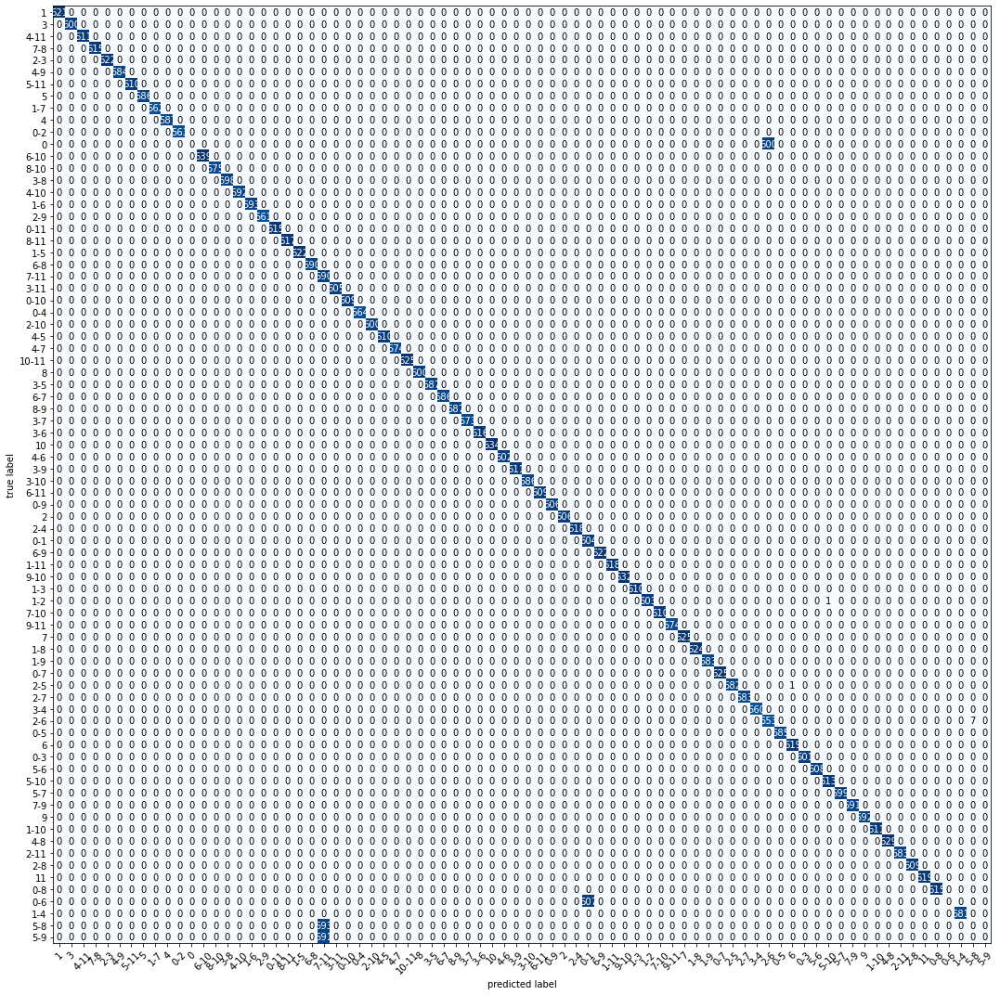

In [128]:
import matplotlib.pyplot as plt
mat=confusion_matrix(y_test,y_pred)
fig,ax=plot_confusion_matrix(conf_mat=mat,figsize=(15,15),class_names=class_names,show_normed=False)
plt.tight_layout()
fig.savefig('cm.png')

In [129]:
import sklearn

In [130]:
from sklearn.metrics import classification_report
from sklearn.utils.multiclass import type_of_target

In [131]:
# y_test = type_of_target(lst_decode_df_y_test['label'])
# y_pred = type_of_target(lst_decode_df['label'])

In [132]:
report = classification_report((np.hstack(lst_decode_df_y_test['label'])), (np.hstack(lst_decode_df['label'])), output_dict=True )
result = pd.DataFrame(report).transpose()
result

,f1-score,precision,recall,support
0,0.956275,1.000000,0.916213,7161.000000
1,0.923947,0.858644,1.000000,7192.000000
2,1.000000,1.000000,1.000000,7172.000000
3,0.959968,0.923018,1.000000,7278.000000
4,0.999931,1.000000,0.999862,7252.000000
5,0.959035,0.922250,0.998877,7125.000000
6,0.999722,0.999722,0.999722,7183.000000
7,1.000000,1.000000,1.000000,7209.000000
8,0.955730,0.999848,0.915342,7170.000000
9,0.833403,0.833403,0.833403,7149.000000


In [133]:
lst_decode_df=pd.DataFrame(lst_decode_df)

In [134]:
arr1=np.array(lst_decode_df)

In [135]:
arr2=np.array(lst_decode_df_y_test)

In [136]:
arr1[100][0]#[0]

array([7, 8], dtype=int64)